In [1]:
from sklearn.feature_extraction.text import CountVectorizer
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Model
from keras.layers import *

In [2]:
import tensorflow as tf
import numpy as np

In [3]:
import pandas as pd

In [4]:
from gensim import models

mecab_model = models.word2vec.Word2Vec.load('NaverMovie_mecab.model')

In [28]:
train_data = pd.read_csv('ratings_train.txt',sep='\t').dropna().reset_index(drop=True)
test_data = pd.read_csv('ratings_test.txt',sep='\t').dropna().reset_index(drop=True)

training_sentences = []
testing_sentences = []

In [29]:
documents = []
for item in train_data.document:
    documents.append(item)

labels = []
for item in train_data.label:
    labels.append(item)

In [30]:
test_documents = []
for item in test_data.document:
    test_documents.append(item)

test_labels = []
for item in test_data.label:
    test_labels.append(item)

In [31]:
vocab_size = 20000
embedding_dim = 200
max_length = 41
trunc_type='post'
oov_tok = '<OOV>'

tokenizer = Tokenizer(num_words = vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(documents)

In [32]:
word_index = tokenizer.word_index
text_sequences = tokenizer.texts_to_sequences(documents)
print(len(word_index))
print(word_index)

padded = pad_sequences(text_sequences,maxlen=max_length,truncating = 'pre')

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [33]:
testing_sequences = tokenizer.texts_to_sequences(test_documents)
test_padded = pad_sequences(testing_sequences, maxlen=max_length)

In [11]:
len(word_index)

296311

In [12]:
word_index

{'<OOV>': 1,
 '영화': 2,
 '너무': 3,
 '정말': 4,
 '진짜': 5,
 '이': 6,
 '그냥': 7,
 '왜': 8,
 '이런': 9,
 '더': 10,
 '수': 11,
 '영화를': 12,
 '다': 13,
 '잘': 14,
 '좀': 15,
 '보고': 16,
 'ㅋㅋ': 17,
 '그': 18,
 '영화는': 19,
 '영화가': 20,
 '본': 21,
 '봤는데': 22,
 '최고의': 23,
 '아': 24,
 '이건': 25,
 '내가': 26,
 '없는': 27,
 '없다': 28,
 '드라마': 29,
 '완전': 30,
 '이렇게': 31,
 '참': 32,
 '이거': 33,
 '평점': 34,
 '그리고': 35,
 '이게': 36,
 '좋은': 37,
 '있는': 38,
 '연기': 39,
 '내': 40,
 '평점이': 41,
 '보는': 42,
 '다시': 43,
 '스토리': 44,
 '역시': 45,
 '최고': 46,
 '쓰레기': 47,
 '난': 48,
 '많이': 49,
 'ㅋ': 50,
 '것': 51,
 'ㅋㅋㅋ': 52,
 '한': 53,
 'ㅠㅠ': 54,
 '재밌게': 55,
 '없고': 56,
 '또': 57,
 '하는': 58,
 '아깝다': 59,
 '꼭': 60,
 '보면': 61,
 '가장': 62,
 '마지막': 63,
 '뭐': 64,
 '영화다': 65,
 '무슨': 66,
 '하지만': 67,
 'ㅡㅡ': 68,
 'ㅎㅎ': 69,
 '10점': 70,
 '별로': 71,
 '같은': 72,
 '작품': 73,
 '솔직히': 74,
 '끝까지': 75,
 '볼': 76,
 '넘': 77,
 '안': 78,
 '대한': 79,
 '만든': 80,
 '와': 81,
 '봐도': 82,
 'ㅠ': 83,
 '전혀': 84,
 '그래도': 85,
 '같다': 86,
 '말이': 87,
 '좋다': 88,
 '지금': 89,
 '아주': 90,
 '뭔가': 91,
 '있다': 9

In [13]:
print(padded[0])
print(padded.shape)

[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0   24  937    5 6728 1098]
(149995, 41)


In [34]:
embedding_matrix = np.zeros((vocab_size, embedding_dim))

index = 0 
for word, idx in tokenizer.word_index.items():
    try:
        embedding_vector = mecab_model.wv.__getitem__(word)
        if embedding_vector is not None:
            embedding_matrix[idx] = embedding_vector
    except Exception as e:
        print(e)
        
embedding_matrix.shape

"word '<OOV>' not in vocabulary"
"word '영화를' not in vocabulary"
"word '영화는' not in vocabulary"
"word '영화가' not in vocabulary"
"word '봤는데' not in vocabulary"
"word '최고의' not in vocabulary"
"word '내가' not in vocabulary"
"word '없는' not in vocabulary"
"word '없다' not in vocabulary"
"word '좋은' not in vocabulary"
"word '있는' not in vocabulary"
"word '평점이' not in vocabulary"
"word '보는' not in vocabulary"
"word '재밌게' not in vocabulary"
"word '없고' not in vocabulary"
"word '하는' not in vocabulary"
"word '아깝다' not in vocabulary"
"word '보면' not in vocabulary"
"word '영화다' not in vocabulary"
"word '10점' not in vocabulary"
"word '같은' not in vocabulary"
"word '끝까지' not in vocabulary"
"word '같다' not in vocabulary"
"word '말이' not in vocabulary"
"word '좋다' not in vocabulary"
"word '있다' not in vocabulary"
"word '영화의' not in vocabulary"
"word '최악의' not in vocabulary"
"word '않고' not in vocabulary"
"word '봤다' not in vocabulary"
"word '연기가' not in vocabulary"
"word '많은' not in vocabulary"
"word '재밌다' not in voca

"word '가족영화' not in vocabulary"
"word '있어도' not in vocabulary"
"word '대표적인' not in vocabulary"
"word '알겠지만' not in vocabulary"
"word '굿굿굿' not in vocabulary"
"word '필요없음' not in vocabulary"
"word '여태까지' not in vocabulary"
"word '이를' not in vocabulary"
"word '게임을' not in vocabulary"
"word '끝은' not in vocabulary"
"word '다른건' not in vocabulary"
"word '사랑한다' not in vocabulary"
"word '행복을' not in vocabulary"
"word '설정에' not in vocabulary"
"word '의외의' not in vocabulary"
"word '못하네' not in vocabulary"
"word '오늘도' not in vocabulary"
"word '만들다' not in vocabulary"
"word '홍콩영화' not in vocabulary"
"word '배경과' not in vocabulary"
"word '하던가' not in vocabulary"
"word '현실적으로' not in vocabulary"
"word '상당한' not in vocabulary"
"word '가치도' not in vocabulary"
"word '사람에게' not in vocabulary"
"word '대사를' not in vocabulary"
"word '장면과' not in vocabulary"
"word '어떠한' not in vocabulary"
"word '죽을' not in vocabulary"
"word '아니라서' not in vocabulary"
"word '기대이하' not in vocabulary"
"word '여자들이' not in vocabulary

"word '없으며' not in vocabulary"
"word '만들었다면' not in vocabulary"
"word '공감되는' not in vocabulary"
"word '크레딧' not in vocabulary"
"word '만들었던' not in vocabulary"
"word '엔딩까지' not in vocabulary"
"word '아직은' not in vocabulary"
"word '먹먹하고' not in vocabulary"
"word '감동적이었어요' not in vocabulary"
"word '보는듯' not in vocabulary"
"word '많았다' not in vocabulary"
"word '소설의' not in vocabulary"
"word '보는듯한' not in vocabulary"
"word '이야기로' not in vocabulary"
"word '끔찍한' not in vocabulary"
"word '지루하지도' not in vocabulary"
"word '연기력을' not in vocabulary"
"word '스크린으로' not in vocabulary"
"word '재미없던데' not in vocabulary"
"word '친구들이랑' not in vocabulary"
"word '애니로' not in vocabulary"
"word '압권이다' not in vocabulary"
"word '1등' not in vocabulary"
"word '엄마와' not in vocabulary"
"word '높냐' not in vocabulary"
"word '볼걸' not in vocabulary"
"word '구리고' not in vocabulary"
"word '나같은' not in vocabulary"
"word '예상되는' not in vocabulary"
"word '손꼽히는' not in vocabulary"
"word '재밌게봤습니다' not in vocabulary"
"word '애절한' no

"word '충격적이고' not in vocabulary"
"word '가시지' not in vocabulary"
"word '보아야' not in vocabulary"
"word '감독들' not in vocabulary"
"word '많은지' not in vocabulary"
"word '해주고' not in vocabulary"
"word '무시한' not in vocabulary"
"word '대화가' not in vocabulary"
"word '구분이' not in vocabulary"
"word '하루에' not in vocabulary"
"word '우리들' not in vocabulary"
"word '영환줄' not in vocabulary"
"word '유치함의' not in vocabulary"
"word '사실적이고' not in vocabulary"
"word '그림체도' not in vocabulary"
"word '간직하고' not in vocabulary"
"word '슬펐어요' not in vocabulary"
"word '잼없어' not in vocabulary"
"word '풍경과' not in vocabulary"
"word '웃게' not in vocabulary"
"word '영상만' not in vocabulary"
"word '즐거웠던' not in vocabulary"
"word '가족에' not in vocabulary"
"word '거품이' not in vocabulary"
"word 'all' not in vocabulary"
"word '짱짱짱' not in vocabulary"
"word '죄없는' not in vocabulary"
"word '타는' not in vocabulary"
"word '이런드라마' not in vocabulary"
"word '다큐가' not in vocabulary"
"word '흥행이' not in vocabulary"
"word '캐릭터들은' not in vocabular

"word '손가락에' not in vocabulary"
"word '영화들에' not in vocabulary"
"word '놀랐음' not in vocabulary"
"word '배경만' not in vocabulary"
"word '10점으로' not in vocabulary"
"word '공허한' not in vocabulary"
"word '좋은영화네요' not in vocabulary"
"word '하시지' not in vocabulary"
"word '대단하네' not in vocabulary"
"word '웃었던' not in vocabulary"
"word '희한한' not in vocabulary"
"word '한명이' not in vocabulary"
"word '다루고' not in vocabulary"
"word '몰입하기' not in vocabulary"
"word '않는다면' not in vocabulary"
"word '멜로도' not in vocabulary"
"word '대표적' not in vocabulary"
"word '지루하던데' not in vocabulary"
"word '옛날영화라' not in vocabulary"
"word '다음날' not in vocabulary"
"word '때묻지' not in vocabulary"
"word '수고하셨어요' not in vocabulary"
"word '영화라기보다는' not in vocabulary"
"word '최고였고' not in vocabulary"
"word '전까지는' not in vocabulary"
"word '공존하는' not in vocabulary"
"word '생각했지만' not in vocabulary"
"word '싫은데' not in vocabulary"
"word '억지스럽게' not in vocabulary"
"word '필요해' not in vocabulary"
"word '내용임' not in vocabulary"
"word '절망적인

"word '놀랐습니다' not in vocabulary"
"word '적극추천' not in vocabulary"
"word '기념비적인' not in vocabulary"
"word '번도' not in vocabulary"
"word '욕먹을' not in vocabulary"
"word '홍보를' not in vocabulary"
"word '10점에' not in vocabulary"
"word '되겠지' not in vocabulary"
"word '기대한다' not in vocabulary"
"word '뭐가뭔지' not in vocabulary"
"word '2004년에' not in vocabulary"
"word '작위적이다' not in vocabulary"
"word '추억돋네' not in vocabulary"
"word '불편하게' not in vocabulary"
"word '세상에는' not in vocabulary"
"word '화가나는' not in vocabulary"
"word '가족들이랑' not in vocabulary"
"word '없다니' not in vocabulary"
"word '5점을' not in vocabulary"
"word '후지고' not in vocabulary"
"word '다시봤다' not in vocabulary"
"word '대중적인' not in vocabulary"
"word '비중을' not in vocabulary"
"word '국어책을' not in vocabulary"
"word '전쟁영화를' not in vocabulary"
"word '기대한다면' not in vocabulary"
"word '정화되는' not in vocabulary"
"word '집어' not in vocabulary"
"word '프랑스판' not in vocabulary"
"word '별2개' not in vocabulary"
"word '만들지를' not in vocabulary"
"word '적나라한'

"word '잘못이' not in vocabulary"
"word '책보다' not in vocabulary"
"word '봐서인지' not in vocabulary"
"word '외국에서' not in vocabulary"
"word '현실에서는' not in vocabulary"
"word '과정과' not in vocabulary"
"word '감동했습니다' not in vocabulary"
"word '내용이네요' not in vocabulary"
"word '신하균이' not in vocabulary"
"word '티비판' not in vocabulary"
"word '고리타분한' not in vocabulary"
"word '그러므로' not in vocabulary"
"word '별도' not in vocabulary"
"word '다하는' not in vocabulary"
"word '편견없이' not in vocabulary"
"word '7년이' not in vocabulary"
"word '더없이' not in vocabulary"
"word '캐안습' not in vocabulary"
"word '스토리인지' not in vocabulary"
"word '기대기대' not in vocabulary"
"word '보기나' not in vocabulary"
"word '스토리도없고' not in vocabulary"
"word '정보가' not in vocabulary"
"word '나루토가' not in vocabulary"
"word '하지마세요' not in vocabulary"
"word '시청하는' not in vocabulary"
"word '음악때문에' not in vocabulary"
"word '영웅의' not in vocabulary"
"word '몰입감과' not in vocabulary"
"word '역으로' not in vocabulary"
"word '편안히' not in vocabulary"
"word '테러를' n

"word '느낌임' not in vocabulary"
"word '태양이' not in vocabulary"
"word '3년이' not in vocabulary"
"word '전체의' not in vocabulary"
"word 'vod로' not in vocabulary"
"word '이외에는' not in vocabulary"
"word '울음이' not in vocabulary"
"word '못할듯' not in vocabulary"
"word '나에' not in vocabulary"
"word '하기에도' not in vocabulary"
"word '실험적인' not in vocabulary"
"word '한명의' not in vocabulary"
"word '10자10자' not in vocabulary"
"word '흐르고' not in vocabulary"
"word '일주일동안' not in vocabulary"
"word '너무좋네요' not in vocabulary"
"word '때문일까' not in vocabulary"
"word '예상했던' not in vocabulary"
"word '제목의' not in vocabulary"
"word '길에' not in vocabulary"
"word '되었구나' not in vocabulary"
"word '억지도' not in vocabulary"
"word '비디오도' not in vocabulary"
"word '피해자를' not in vocabulary"
"word '기대했다면' not in vocabulary"
"word 'let' not in vocabulary"
"word '것들의' not in vocabulary"
"word '뒤의' not in vocabulary"
"word '이완맥그리거' not in vocabulary"
"word '모자라는' not in vocabulary"
"word '장면보고' not in vocabulary"
"word '담담하고' not in

"word '에너지를' not in vocabulary"
"word '거는' not in vocabulary"
"word '미쳤네' not in vocabulary"
"word '줄을' not in vocabulary"
"word '기대할' not in vocabulary"
"word '거라곤' not in vocabulary"
"word '디테일하고' not in vocabulary"
"word '노래들이' not in vocabulary"
"word '더봐라' not in vocabulary"
"word '어떡하지' not in vocabulary"
"word '케릭터는' not in vocabulary"
"word '제작진들이' not in vocabulary"
"word '한달' not in vocabulary"
"word '이중적인' not in vocabulary"
"word '머이리' not in vocabulary"
"word '대작전' not in vocabulary"
"word '관대한' not in vocabulary"
"word '장동건이' not in vocabulary"
"word '소리하고' not in vocabulary"
"word '김민종이' not in vocabulary"
"word '잼있었던' not in vocabulary"
"word '만들었군' not in vocabulary"
"word '하고픈' not in vocabulary"
"word '초딩수준' not in vocabulary"
"word '일수도' not in vocabulary"
"word '자기전에' not in vocabulary"
"word '주지훈이' not in vocabulary"
"word '손예진은' not in vocabulary"
"word '4명의' not in vocabulary"
"word '최고의영화다' not in vocabulary"
"word '광기어린' not in vocabulary"
"word '급의' not in vo

"word '이해해야' not in vocabulary"
"word '느낌이예요' not in vocabulary"
"word '있을까봐' not in vocabulary"
index 20893 is out of bounds for axis 0 with size 20000
"word '최후가' not in vocabulary"
"word '지들은' not in vocabulary"
index 20896 is out of bounds for axis 0 with size 20000
index 20897 is out of bounds for axis 0 with size 20000
"word '싫을' not in vocabulary"
"word '에너미' not in vocabulary"
"word '누리고' not in vocabulary"
"word '비판과' not in vocabulary"
"word '캐실망' not in vocabulary"
"word '호흡도' not in vocabulary"
"word '않은것' not in vocabulary"
"word '5까지' not in vocabulary"
"word '스릴넘치고' not in vocabulary"
"word '갈수' not in vocabulary"
"word '자료가' not in vocabulary"
"word '봐야된다' not in vocabulary"
"word '반복에' not in vocabulary"
"word '1부터' not in vocabulary"
"word '해줘요' not in vocabulary"
"word '시즌4' not in vocabulary"
"word '본방은' not in vocabulary"
"word '싶은건가' not in vocabulary"
"word '알바나' not in vocabulary"
"word '쌩뚱맞다' not in vocabulary"
"word '분명함' not in vocabulary"
"word '아름다움도' not i

"word '0점이다' not in vocabulary"
"word '짧았지만' not in vocabulary"
"word '길었다' not in vocabulary"
"word '액션영화다' not in vocabulary"
"word '출연하지' not in vocabulary"
"word '고귀한' not in vocabulary"
"word '비교는' not in vocabulary"
"word '의해서' not in vocabulary"
"word '네오' not in vocabulary"
"word '볼거리만' not in vocabulary"
"word '열받게' not in vocabulary"
"word '요즈음' not in vocabulary"
"word '첫장면부터' not in vocabulary"
"word '영화사가' not in vocabulary"
"word '능력에' not in vocabulary"
"word '기가막힌' not in vocabulary"
"word '비교하지' not in vocabulary"
"word '집중하지' not in vocabulary"
"word '난데없는' not in vocabulary"
"word '하셈' not in vocabulary"
"word '미세한' not in vocabulary"
"word '정신으로' not in vocabulary"
"word '목소리에' not in vocabulary"
index 22913 is out of bounds for axis 0 with size 20000
"word '보기싫음' not in vocabulary"
"word '하거나' not in vocabulary"
"word '죽는다는' not in vocabulary"
"word '짱구는' not in vocabulary"
"word '화가납니다' not in vocabulary"
"word '우정의' not in vocabulary"
"word '영화를보고' not in vocabul

"word '구원의' not in vocabulary"
index 24890 is out of bounds for axis 0 with size 20000
"word '음악만큼은' not in vocabulary"
"word '보려고했는데' not in vocabulary"
"word '존재하고' not in vocabulary"
"word '지루하더라' not in vocabulary"
"word '잘못된거' not in vocabulary"
"word '가세요' not in vocabulary"
"word '망작이라고' not in vocabulary"
"word '과제를' not in vocabulary"
"word '희한하게' not in vocabulary"
"word '잘만들듯' not in vocabulary"
"word '9번' not in vocabulary"
"word '죽는줄알았음' not in vocabulary"
"word '미래도' not in vocabulary"
"word '때우기용으로' not in vocabulary"
"word '바람피고' not in vocabulary"
"word '슬픔의' not in vocabulary"
"word '올려주고' not in vocabulary"
"word '했니' not in vocabulary"
"word '같다가' not in vocabulary"
"word '야마다' not in vocabulary"
"word '생명체가' not in vocabulary"
"word '미친놈들아' not in vocabulary"
"word '불륜녀' not in vocabulary"
index 24914 is out of bounds for axis 0 with size 20000
index 24915 is out of bounds for axis 0 with size 20000
"word '너무들' not in vocabulary"
"word '포장했지만' not in vocabulary"
"w

"word '남자친구랑' not in vocabulary"
"word '따지지도' not in vocabulary"
"word '전투신도' not in vocabulary"
index 26892 is out of bounds for axis 0 with size 20000
"word '태산' not in vocabulary"
"word '장면이다' not in vocabulary"
"word '하기는' not in vocabulary"
"word '참여하는' not in vocabulary"
index 26897 is out of bounds for axis 0 with size 20000
"word '스릴러로서' not in vocabulary"
"word '안할듯' not in vocabulary"
"word '내용두' not in vocabulary"
"word '진세연' not in vocabulary"
"word '고현정이' not in vocabulary"
"word '데려와서' not in vocabulary"
"word '환경을' not in vocabulary"
"word '선량한' not in vocabulary"
"word '왕추천' not in vocabulary"
"word '때림' not in vocabulary"
"word '똑같은데' not in vocabulary"
"word '돈이면' not in vocabulary"
"word '유쾌하네요' not in vocabulary"
"word '효과만' not in vocabulary"
"word '인간미를' not in vocabulary"
"word '기억이남' not in vocabulary"
"word '왜보냐' not in vocabulary"
"word '끝까지본' not in vocabulary"
"word '참고보기' not in vocabulary"
"word '평점준' not in vocabulary"
"word '어이없다는' not in vocabulary"
"wo

"word '하겠다고' not in vocabulary"
"word '안쓰러울' not in vocabulary"
"word '잃었음' not in vocabulary"
"word '김현중' not in vocabulary"
"word '하게된다' not in vocabulary"
index 28893 is out of bounds for axis 0 with size 20000
"word '무게있는' not in vocabulary"
"word '동방신기' not in vocabulary"
"word '열받은' not in vocabulary"
"word '사랑받고' not in vocabulary"
"word '야하기라도' not in vocabulary"
"word '개봉해도' not in vocabulary"
"word '1987년' not in vocabulary"
"word '감독들도' not in vocabulary"
"word '심사위원들' not in vocabulary"
"word '심사평' not in vocabulary"
"word '소년은' not in vocabulary"
"word '천국에서' not in vocabulary"
"word '재밌으면서도' not in vocabulary"
"word '브룩' not in vocabulary"
"word '브레이브' not in vocabulary"
index 28909 is out of bounds for axis 0 with size 20000
"word '떨어진다고' not in vocabulary"
"word '받았으면' not in vocabulary"
"word '내용과는' not in vocabulary"
"word '다뤘다는' not in vocabulary"
"word '꿈도' not in vocabulary"
"word '우울해서' not in vocabulary"
"word '둘만의' not in vocabulary"
"word '그랬듯이' not in vocabula

"word '탄생했다' not in vocabulary"
index 30889 is out of bounds for axis 0 with size 20000
"word '저가' not in vocabulary"
"word '보셔야' not in vocabulary"
"word '많다는걸' not in vocabulary"
"word '50번' not in vocabulary"
"word '구려요' not in vocabulary"
"word '먹다' not in vocabulary"
"word '하소서' not in vocabulary"
"word '기네' not in vocabulary"
"word '1년전에' not in vocabulary"
index 30899 is out of bounds for axis 0 with size 20000
"word '한방을' not in vocabulary"
"word '짠듯' not in vocabulary"
"word '보고선' not in vocabulary"
"word '연출들' not in vocabulary"
"word '사네' not in vocabulary"
"word '월요일이' not in vocabulary"
"word '관계된' not in vocabulary"
"word '집어넣고' not in vocabulary"
"word '왜만들었냐' not in vocabulary"
index 30909 is out of bounds for axis 0 with size 20000
"word '썼다면' not in vocabulary"
"word '하는짓은' not in vocabulary"
"word '단어만' not in vocabulary"
"word '사전지식이' not in vocabulary"
"word '병사들이' not in vocabulary"
"word '조형기' not in vocabulary"
"word '감독판으로' not in vocabulary"
"word '찾아보지' not i

"word '끝맺음이' not in vocabulary"
"word '조마조마하면서' not in vocabulary"
"word '설정까지' not in vocabulary"
"word '3박자를' not in vocabulary"
"word '작가적' not in vocabulary"
"word '한계도' not in vocabulary"
"word '정권의' not in vocabulary"
index 32894 is out of bounds for axis 0 with size 20000
"word '주제곡과' not in vocabulary"
"word '더하지도' not in vocabulary"
"word '배우진의' not in vocabulary"
"word '키아누리브스가' not in vocabulary"
"word '형님들' not in vocabulary"
"word '돈이아까운' not in vocabulary"
"word '10점이니까' not in vocabulary"
"word '투니버스' not in vocabulary"
"word '가자고' not in vocabulary"
"word '20살때' not in vocabulary"
"word '삽입곡은' not in vocabulary"
"word '영웅본색과' not in vocabulary"
"word '한계였다' not in vocabulary"
"word '통쾌하면서도' not in vocabulary"
"word '의상이' not in vocabulary"
"word '3살짜리' not in vocabulary"
"word '있긴한데' not in vocabulary"
"word '할머니랑' not in vocabulary"
"word '좋을것같다' not in vocabulary"
"word '망작영화' not in vocabulary"
"word '들리지' not in vocabulary"
"word '양키들의' not in vocabulary"
"word '초강력

"word '빙의된' not in vocabulary"
"word '내놓아도' not in vocabulary"
"word '부모들이' not in vocabulary"
"word '질려서' not in vocabulary"
"word '잡았는지' not in vocabulary"
"word '시키야' not in vocabulary"
"word '다케시가' not in vocabulary"
"word '천재인지' not in vocabulary"
"word '사람인' not in vocabulary"
"word '외국영화나' not in vocabulary"
"word '파이란' not in vocabulary"
"word '군대가기전에' not in vocabulary"
index 34899 is out of bounds for axis 0 with size 20000
"word '완벽해요' not in vocabulary"
"word '꼴리는' not in vocabulary"
"word '집중안되는' not in vocabulary"
"word '집중이안된다' not in vocabulary"
"word '우리나라만큼' not in vocabulary"
"word '46' not in vocabulary"
"word '놓쳐버린' not in vocabulary"
"word '보여줬더라면' not in vocabulary"
"word '최고봉이라고' not in vocabulary"
"word '드라마에는' not in vocabulary"
"word '한것같은데' not in vocabulary"
"word '효과적인' not in vocabulary"
index 34912 is out of bounds for axis 0 with size 20000
"word '음냐' not in vocabulary"
"word '변명만' not in vocabulary"
"word '무기도' not in vocabulary"
"word '미국식으로' not in v

"word '작가분은' not in vocabulary"
"word '빨간색' not in vocabulary"
"word '잘하는게' not in vocabulary"
"word '늙어가고' not in vocabulary"
"word '왕은' not in vocabulary"
"word '생각나더라구요' not in vocabulary"
"word '살리면' not in vocabulary"
"word '시청자로써' not in vocabulary"
"word '이해하기힘든' not in vocabulary"
"word '이럴래' not in vocabulary"
"word '드라마인가요' not in vocabulary"
"word '소재에서' not in vocabulary"
"word '악동' not in vocabulary"
"word '찰스의' not in vocabulary"
"word '모르지' not in vocabulary"
"word '들어있지' not in vocabulary"
"word '꾸준하게' not in vocabulary"
"word '느끼게한다' not in vocabulary"
"word '예상밖의' not in vocabulary"
"word '인셉션이랑' not in vocabulary"
"word '현대를' not in vocabulary"
"word '조여온다' not in vocabulary"
"word '이룩한' not in vocabulary"
"word '브레이크' not in vocabulary"
"word '아니었군요' not in vocabulary"
"word '엄청나고' not in vocabulary"
"word '봤어요ㅎㅎ' not in vocabulary"
"word '국경을' not in vocabulary"
"word '귀감이' not in vocabulary"
"word '감독이야말로' not in vocabulary"
"word '숨결이' not in vocabulary"
"word '엔

"word '평가하지마라' not in vocabulary"
"word 'happy' not in vocabulary"
"word '1950년대에' not in vocabulary"
"word '바람피는' not in vocabulary"
"word '알바아니고' not in vocabulary"
"word '평하지' not in vocabulary"
"word '상병' not in vocabulary"
"word '부인과' not in vocabulary"
"word '만든영화인지' not in vocabulary"
"word '설정인데' not in vocabulary"
"word '하는것이' not in vocabulary"
"word '비슷한거' not in vocabulary"
"word '했는대' not in vocabulary"
"word '싸우는거' not in vocabulary"
"word '가버리는' not in vocabulary"
"word '잔인하지도않고' not in vocabulary"
"word '허무개그' not in vocabulary"
"word '잘나갈때' not in vocabulary"
"word '말아먹음' not in vocabulary"
"word '추노' not in vocabulary"
"word '세대에' not in vocabulary"
"word '정선희' not in vocabulary"
"word '망작인데' not in vocabulary"
index 38909 is out of bounds for axis 0 with size 20000
"word '1점밖에' not in vocabulary"
"word '등록이' not in vocabulary"
"word '혼났음' not in vocabulary"
"word '식이라' not in vocabulary"
"word '남아있던' not in vocabulary"
"word '죽기에' not in vocabulary"
"word '보믄' not in

"word '낚이다니' not in vocabulary"
"word '동명이인' not in vocabulary"
"word '짐은' not in vocabulary"
"word '토할거' not in vocabulary"
"word '맷이' not in vocabulary"
"word '수면제같은' not in vocabulary"
"word '있을듯한' not in vocabulary"
"word '따라하게' not in vocabulary"
"word '3까지만' not in vocabulary"
"word '못하겠어요' not in vocabulary"
"word '10점만점을' not in vocabulary"
index 40896 is out of bounds for axis 0 with size 20000
"word '아이러브유' not in vocabulary"
"word '실어' not in vocabulary"
"word '둔갑시켜' not in vocabulary"
"word '줄뿐' not in vocabulary"
"word '액션장면' not in vocabulary"
"word '몰려온다' not in vocabulary"
"word '여름을' not in vocabulary"
"word '더웃겨' not in vocabulary"
"word '명화다' not in vocabulary"
"word '등도' not in vocabulary"
"word '안믿긴다' not in vocabulary"
"word '여운까지' not in vocabulary"
"word '혼자봐도' not in vocabulary"
"word '과거엔' not in vocabulary"
"word '상관없고' not in vocabulary"
"word '보여드리고' not in vocabulary"
"word '여자라는' not in vocabulary"
"word '만난다' not in vocabulary"
"word '심심풀이' not in vocabu

"word '꼬아놓은' not in vocabulary"
"word '정상은' not in vocabulary"
"word '목표는' not in vocabulary"
"word '플롯으로' not in vocabulary"
"word '연애가' not in vocabulary"
index 42890 is out of bounds for axis 0 with size 20000
"word '음란마귀가' not in vocabulary"
"word '밀린' not in vocabulary"
"word '우스꽝스럽게' not in vocabulary"
"word '사랑스러웠어요' not in vocabulary"
"word '다니지' not in vocabulary"
"word '감기로' not in vocabulary"
"word '그치지' not in vocabulary"
"word '종려시' not in vocabulary"
"word 'ㅊㅊ' not in vocabulary"
"word '먼저봐서' not in vocabulary"
"word '심리적인' not in vocabulary"
index 42902 is out of bounds for axis 0 with size 20000
"word '묵념' not in vocabulary"
"word '좋다면' not in vocabulary"
"word '좋은영화이다' not in vocabulary"
"word '형님과' not in vocabulary"
"word '인디밴드' not in vocabulary"
"word '무난하다' not in vocabulary"
"word 'html' not in vocabulary"
"word '만드시지' not in vocabulary"
"word '한심할뿐' not in vocabulary"
"word '재미도없구만' not in vocabulary"
"word '예술이지' not in vocabulary"
"word '마터스' not in vocabulary

"word '무섭기도하고' not in vocabulary"
"word '평점이너무높다' not in vocabulary"
"word '희대의명작' not in vocabulary"
"word '잘하시던데' not in vocabulary"
"word '김민종씨' not in vocabulary"
"word '강하늘' not in vocabulary"
"word '두가지를' not in vocabulary"
"word '맨인블랙의' not in vocabulary"
"word '조의' not in vocabulary"
"word '박아라' not in vocabulary"
"word '장난없다' not in vocabulary"
"word '이번해' not in vocabulary"
"word '실망할수밖에' not in vocabulary"
"word '담아내려' not in vocabulary"
"word '가문시리즈의' not in vocabulary"
"word '성녀' not in vocabulary"
"word '난해하면' not in vocabulary"
"word '공감ㅋㅋㅋ' not in vocabulary"
"word '조르는' not in vocabulary"
"word '풀면서' not in vocabulary"
"word '감정표현에' not in vocabulary"
"word '리브스와' not in vocabulary"
"word '아닌가보네' not in vocabulary"
"word '휴가같은' not in vocabulary"
"word '모든이에게' not in vocabulary"
"word '일본답다' not in vocabulary"
"word '웃겨죽을뻔' not in vocabulary"
"word '빈스본' not in vocabulary"
"word '한글자막으로' not in vocabulary"
"word '썼구만' not in vocabulary"
"word '나아지겠지' not in vocabulary"

"word '군생활을' not in vocabulary"
"word '밑에분은' not in vocabulary"
"word '일어날수있는' not in vocabulary"
"word '명성은' not in vocabulary"
"word '작가주의로' not in vocabulary"
"word '한바가지' not in vocabulary"
"word '말하라' not in vocabulary"
"word '보는거지만' not in vocabulary"
"word '곤란합니다' not in vocabulary"
"word '추천이' not in vocabulary"
"word '화류계' not in vocabulary"
"word '넣음' not in vocabulary"
"word '구하기도' not in vocabulary"
"word '장민의' not in vocabulary"
"word '푼수' not in vocabulary"
"word '치사한' not in vocabulary"
"word '김수로의' not in vocabulary"
"word '거슬렸습니다' not in vocabulary"
"word '포르노는' not in vocabulary"
"word '싸이코는' not in vocabulary"
"word '색채로' not in vocabulary"
"word '이감독꺼는' not in vocabulary"
"word '오창석' not in vocabulary"
"word '같이산다는' not in vocabulary"
"word '여행이라는' not in vocabulary"
"word '하이힐' not in vocabulary"
"word '의지한' not in vocabulary"
"word '설득력이나' not in vocabulary"
"word '이것땜에' not in vocabulary"
"word '태양은가득히' not in vocabulary"
"word '뱃김' not in vocabulary"
"word '특수분장

"word '기대감도' not in vocabulary"
"word '혹하고' not in vocabulary"
"word '선생님들의' not in vocabulary"
"word '파괴의' not in vocabulary"
"word 'oo랜드' not in vocabulary"
"word '3부는' not in vocabulary"
"word '죽네유' not in vocabulary"
"word '6편이' not in vocabulary"
"word '제밌다' not in vocabulary"
"word '킬링타임용으로만' not in vocabulary"
"word '무겁긴' not in vocabulary"
"word '어이상실의' not in vocabulary"
"word '없어지지' not in vocabulary"
"word '아담의' not in vocabulary"
"word '시각적인것만' not in vocabulary"
"word '인도영화가' not in vocabulary"
"word 'wonderful' not in vocabulary"
"word '자연스러울' not in vocabulary"
"word '별1점' not in vocabulary"
"word '아까운것은' not in vocabulary"
"word '노랑머리의' not in vocabulary"
index 48904 is out of bounds for axis 0 with size 20000
"word '영어발음이' not in vocabulary"
"word '발음은' not in vocabulary"
"word '감동적ㅠㅠ' not in vocabulary"
"word '짙었다' not in vocabulary"
"word '생각해보세요' not in vocabulary"
"word '다시보구' not in vocabulary"
"word '고민없이' not in vocabulary"
"word '로맨틱물' not in vocabulary"
"word 

"word '개한민국' not in vocabulary"
"word '무섭긴한데' not in vocabulary"
"word '비범함' not in vocabulary"
"word '끝나요' not in vocabulary"
"word '탄탄해' not in vocabulary"
"word ''진짜'' not in vocabulary"
"word '희망적이라' not in vocabulary"
"word '빨갱이들은' not in vocabulary"
"word '보냈으면' not in vocabulary"
"word '어설펐다' not in vocabulary"
"word 'ooo기ㅡㅡ' not in vocabulary"
"word '서른넘어' not in vocabulary"
"word '그랑블루' not in vocabulary"
"word '피하는' not in vocabulary"
"word '혼자의' not in vocabulary"
"word '대결로' not in vocabulary"
"word '진행한다' not in vocabulary"
"word '낳지' not in vocabulary"
"word '여성비하' not in vocabulary"
"word '생각되지않습니다' not in vocabulary"
"word '홍진호를' not in vocabulary"
"word '개이버' not in vocabulary"
"word '나같아도' not in vocabulary"
"word '다큐라고' not in vocabulary"
"word '준비된' not in vocabulary"
"word '볼수있을까' not in vocabulary"
"word '그렇긴하지만' not in vocabulary"
"word '히사이시' not in vocabulary"
"word '찌질이들' not in vocabulary"
"word '아무리드라마라지만' not in vocabulary"
"word '개념없게' not in vocabulary"
"

"word '어캐' not in vocabulary"
"word '죽기직전의' not in vocabulary"
"word '됐을듯' not in vocabulary"
"word '러시아워를' not in vocabulary"
"word '2일' not in vocabulary"
"word '먹는건지' not in vocabulary"
"word '것들도' not in vocabulary"
"word '만든것도아니고' not in vocabulary"
"word '김구라땜에' not in vocabulary"
"word '보여주는걸' not in vocabulary"
"word '컨저링보단' not in vocabulary"
"word '마틴의' not in vocabulary"
"word '작품인건' not in vocabulary"
"word '한편봤다' not in vocabulary"
"word '사람같다' not in vocabulary"
"word '개연성이라는' not in vocabulary"
"word '단면적으로' not in vocabulary"
"word '1점이아니라' not in vocabulary"
"word '몇마디로' not in vocabulary"
"word '딴나라에서' not in vocabulary"
"word '위버의' not in vocabulary"
"word '지식의' not in vocabulary"
"word '와봤어요' not in vocabulary"
"word '부천영화제를' not in vocabulary"
"word '사운드만' not in vocabulary"
"word '재밌을꺼' not in vocabulary"
"word '활약을' not in vocabulary"
"word '아픈영화' not in vocabulary"
"word '판도를' not in vocabulary"
"word '바꿔놓았다' not in vocabulary"
"word '연기부족' not in vocabulary"
"w

"word '공감하기는' not in vocabulary"
"word '가긴' not in vocabulary"
"word '영상일' not in vocabulary"
"word '봤으면하는' not in vocabulary"
"word '이응경씨' not in vocabulary"
"word '미친여자' not in vocabulary"
"word '길용우씨가' not in vocabulary"
"word '싸이코로' not in vocabulary"
"word '일일드라마는' not in vocabulary"
"word '40분쯤' not in vocabulary"
"word '내려감' not in vocabulary"
"word '간결하다' not in vocabulary"
"word '애니메이션들이랑' not in vocabulary"
"word '시리우스' not in vocabulary"
"word '톱스타가' not in vocabulary"
"word '않는다는걸' not in vocabulary"
"word '영화잘봤어요' not in vocabulary"
"word '수준급이다' not in vocabulary"
"word '관람객들에게' not in vocabulary"
"word '어른까지' not in vocabulary"
"word '만족스러웠습니다' not in vocabulary"
"word '구성까지' not in vocabulary"
index 54885 is out of bounds for axis 0 with size 20000
"word '한여름에' not in vocabulary"
"word '다같은' not in vocabulary"
"word '독립하지' not in vocabulary"
"word '냉전시대의' not in vocabulary"
"word '피해자인' not in vocabulary"
"word '배우진도' not in vocabulary"
"word 'tv소설' not in vocabulary"
"

"word '교회는' not in vocabulary"
"word '협상' not in vocabulary"
"word '얘기들' not in vocabulary"
"word '도대채' not in vocabulary"
"word '초등1학년' not in vocabulary"
"word '꼬꼬마들' not in vocabulary"
"word '예산은' not in vocabulary"
"word '열풍속에' not in vocabulary"
"word '정준호는' not in vocabulary"
"word '감명받은' not in vocabulary"
"word '진짜싫다' not in vocabulary"
"word '병맛나는' not in vocabulary"
"word 'ip' not in vocabulary"
"word '절대보지마시길' not in vocabulary"
"word '왜사냐' not in vocabulary"
"word '최고네여' not in vocabulary"
"word '데이지의' not in vocabulary"
"word '드마라' not in vocabulary"
"word '요세는' not in vocabulary"
"word '흐르면서' not in vocabulary"
"word '틀린게' not in vocabulary"
"word '필수로' not in vocabulary"
"word '하기싫다' not in vocabulary"
"word '않는구만' not in vocabulary"
"word '여자이면서' not in vocabulary"
"word 'sf영화다' not in vocabulary"
"word '실종되고' not in vocabulary"
"word '어처구니없고' not in vocabulary"
"word '놀라다' not in vocabulary"
"word '못하는걸까' not in vocabulary"
"word '일상생활에서의' not in vocabulary"
"word '볼줄모

"word '2개만' not in vocabulary"
"word '트렌드를' not in vocabulary"
"word '아저씨한테' not in vocabulary"
"word '설래고' not in vocabulary"
"word '살아나게' not in vocabulary"
"word '트랜스포머라는' not in vocabulary"
"word '결말에선' not in vocabulary"
"word '이감독이' not in vocabulary"
"word '켄이치가' not in vocabulary"
"word '코난이니까' not in vocabulary"
"word '오시면' not in vocabulary"
"word '포착한' not in vocabulary"
"word '오마이' not in vocabulary"
"word '자본주의는' not in vocabulary"
"word '내뱉는다' not in vocabulary"
"word '소통하려는' not in vocabulary"
"word '참신하지' not in vocabulary"
"word '후진국으로' not in vocabulary"
"word '으흑' not in vocabulary"
"word '뭐양' not in vocabulary"
"word '잡는건' not in vocabulary"
"word '달라졌지만' not in vocabulary"
"word '재밋엇네요' not in vocabulary"
"word '사막과' not in vocabulary"
"word 'cg없는' not in vocabulary"
"word '싫었는지' not in vocabulary"
"word '받는구나' not in vocabulary"
"word '엉망징창' not in vocabulary"
"word '맺다' not in vocabulary"
"word '꼭보세용' not in vocabulary"
"word '신기했는데' not in vocabulary"
"word '슬프진

"word '보이죠' not in vocabulary"
"word '죄지은' not in vocabulary"
"word '가는걸까' not in vocabulary"
"word '통에' not in vocabulary"
"word '최원영' not in vocabulary"
"word '믿을께' not in vocabulary"
"word '떨어지면서' not in vocabulary"
"word '무섭잖아' not in vocabulary"
"word '무리다' not in vocabulary"
"word '만들어주시면' not in vocabulary"
"word '시간여행은' not in vocabulary"
"word '허이재' not in vocabulary"
"word '힘있게' not in vocabulary"
"word '없듯이' not in vocabulary"
"word '오지랍' not in vocabulary"
"word '곱씹어보면' not in vocabulary"
"word '없었기' not in vocabulary"
"word '말아서' not in vocabulary"
"word '진짜싫어' not in vocabulary"
"word '인생영화임' not in vocabulary"
"word '눈물흘리는' not in vocabulary"
"word '기쁘네요' not in vocabulary"
"word '좋을거같아요' not in vocabulary"
"word '본것같아요' not in vocabulary"
index 60500 is out of bounds for axis 0 with size 20000
"word '괜찮았던걸로' not in vocabulary"
"word '몰입방해' not in vocabulary"
"word '헛것이' not in vocabulary"
"word '보이거나' not in vocabulary"
"word '빨리보기로' not in vocabulary"
"word '돈있고' not i

"word '보기민망할' not in vocabulary"
"word '질주할때' not in vocabulary"
"word '보리울의' not in vocabulary"
"word '랩을' not in vocabulary"
"word '육체적인' not in vocabulary"
"word '채울려고' not in vocabulary"
"word '장의사' not in vocabulary"
"word '징징대고' not in vocabulary"
"word '사료' not in vocabulary"
"word '인물간' not in vocabulary"
index 62519 is out of bounds for axis 0 with size 20000
"word '이사람들' not in vocabulary"
"word '꼬마아이' not in vocabulary"
"word '레이놀즈의' not in vocabulary"
"word '구혜선씨' not in vocabulary"
"word '귀척' not in vocabulary"
"word '시간죽이기에는' not in vocabulary"
"word '밀려드는' not in vocabulary"
"word '만나지도' not in vocabulary"
"word '쥑이네' not in vocabulary"
"word '이정도일줄이야' not in vocabulary"
"word '울림으로' not in vocabulary"
"word '아닌듯하다' not in vocabulary"
"word '까다롭게' not in vocabulary"
"word '하루아침에' not in vocabulary"
"word '배우마저' not in vocabulary"
"word '마무리에서' not in vocabulary"
"word '8점줬다' not in vocabulary"
"word '아나키스트의' not in vocabulary"
"word '리카' not in vocabulary"
"word '귀여어' no

"word '아이돌들을' not in vocabulary"
"word '어울리더라' not in vocabulary"
"word '기대할께여' not in vocabulary"
"word '재미만으로도' not in vocabulary"
"word '열자열자열자' not in vocabulary"
"word '야구소재라' not in vocabulary"
"word '어려웠네요' not in vocabulary"
"word 'ㅂㅅ이고' not in vocabulary"
"word '아듀' not in vocabulary"
"word '못보겠습니다' not in vocabulary"
"word '그대들' not in vocabulary"
index 64390 is out of bounds for axis 0 with size 20000
"word '정사가' not in vocabulary"
"word '거북스러웠다' not in vocabulary"
"word '그점이' not in vocabulary"
"word '제압하는' not in vocabulary"
"word '스토리이다' not in vocabulary"
"word '스피커' not in vocabulary"
"word '부러웠어요' not in vocabulary"
"word '의리가없네' not in vocabulary"
"word '초등학교시절' not in vocabulary"
"word '10점주지' not in vocabulary"
"word '도식적인' not in vocabulary"
"word '동전의' not in vocabulary"
"word 'hear' not in vocabulary"
"word 'sing' not in vocabulary"
"word '알아주지' not in vocabulary"
"word '풀려도' not in vocabulary"
"word 'ㅅㄱㅇ' not in vocabulary"
"word '아깝노' not in vocabulary"
"word '

"word '인물들로' not in vocabulary"
"word '진실에' not in vocabulary"
"word '아빠나' not in vocabulary"
"word '딸이나' not in vocabulary"
"word '붉어진다' not in vocabulary"
"word '공동주연' not in vocabulary"
"word '베니니의' not in vocabulary"
"word '과욕때문에' not in vocabulary"
"word '하자나' not in vocabulary"
"word '마이클의' not in vocabulary"
"word '되는디' not in vocabulary"
"word '북한말' not in vocabulary"
"word '이해했음' not in vocabulary"
"word '압박감' not in vocabulary"
"word '대체누구야' not in vocabulary"
"word '보고싶지않네요' not in vocabulary"
"word '재치있고' not in vocabulary"
"word '풍요롭다' not in vocabulary"
"word '눈배림' not in vocabulary"
"word '과장의' not in vocabulary"
"word '폭이' not in vocabulary"
"word '비도오고' not in vocabulary"
"word '펑펑울었다' not in vocabulary"
"word '조인성을' not in vocabulary"
"word '남우주연상에' not in vocabulary"
"word '도화지' not in vocabulary"
"word '당혹스럽다' not in vocabulary"
"word '알고싶다를' not in vocabulary"
"word '보겔' not in vocabulary"
"word '감상중' not in vocabulary"
"word '일으키게' not in vocabulary"
"word '이때까지만'

"word '나만그런가' not in vocabulary"
"word '촬영해서' not in vocabulary"
"word '워싱턴과' not in vocabulary"
"word '영화찍을돈으로' not in vocabulary"
"word '코스모스는' not in vocabulary"
"word '인도가서' not in vocabulary"
"word '시시할' not in vocabulary"
"word '황당한영화' not in vocabulary"
"word '차요' not in vocabulary"
"word '이제사' not in vocabulary"
"word '가졌지만' not in vocabulary"
"word '워크샵' not in vocabulary"
"word '러브스토리로' not in vocabulary"
"word '로빈윌리엄스를' not in vocabulary"
"word '배웠으면' not in vocabulary"
"word '찍어보세요' not in vocabulary"
"word '에펠탑' not in vocabulary"
"word '개판이었지만' not in vocabulary"
"word '이뤄질' not in vocabulary"
"word '스토리구성도' not in vocabulary"
"word '나름인' not in vocabulary"
"word '잼엄슴' not in vocabulary"
"word '가엽고' not in vocabulary"
"word '사과를' not in vocabulary"
"word '지나쳤는데' not in vocabulary"
"word '이상에' not in vocabulary"
"word '샨티' not in vocabulary"
"word '환상적이었음' not in vocabulary"
"word '궁금했다' not in vocabulary"
"word '대사다' not in vocabulary"
"word '다시볼수없나' not in vocabulary"
"w

"word '그사람은' not in vocabulary"
"word '17살에' not in vocabulary"
"word '초난강' not in vocabulary"
"word '유두가' not in vocabulary"
"word '스토리구성은' not in vocabulary"
"word '재미잇엇음' not in vocabulary"
"word '내가만일' not in vocabulary"
"word '충분하고' not in vocabulary"
"word '끝내길' not in vocabulary"
"word '서인국님' not in vocabulary"
"word '희생자들과' not in vocabulary"
"word '이성재씨' not in vocabulary"
"word '미스테리야' not in vocabulary"
"word '종이를' not in vocabulary"
"word 'ost인' not in vocabulary"
"word '신세대' not in vocabulary"
"word '매기고' not in vocabulary"
"word '안들었고' not in vocabulary"
"word '꿀꿀이' not in vocabulary"
"word '궁금하지가' not in vocabulary"
"word '말마다' not in vocabulary"
"word '롸져' not in vocabulary"
"word '몸매뿐' not in vocabulary"
"word '낫구나' not in vocabulary"
"word '미스인듯' not in vocabulary"
"word '해석해야' not in vocabulary"
"word '벗어던지고' not in vocabulary"
"word '믿긴다' not in vocabulary"
"word '코넬리와' not in vocabulary"
"word '주파수' not in vocabulary"
"word '사냥을' not in vocabulary"
"word '자살해라' not

"word '안뜨는지' not in vocabulary"
"word '모르는거야' not in vocabulary"
"word '알겠구만' not in vocabulary"
"word '내어릴적' not in vocabulary"
"word '떠낫나보다' not in vocabulary"
"word '총을드나' not in vocabulary"
"word '크리스토퍼왈츠와' not in vocabulary"
"word '한국에선유명한편은아니지만' not in vocabulary"
"word '상상초월한' not in vocabulary"
"word '재밋는영화봤네요' not in vocabulary"
"word '종방되어' not in vocabulary"
"word '오늘막방도' not in vocabulary"
"word '방송대본이' not in vocabulary"
"word '완성도있다는' not in vocabulary"
"word '느낌받았고요' not in vocabulary"
"word '드라마들의' not in vocabulary"
"word '지쳐있었는데' not in vocabulary"
"word '바른드라마였던듯해요' not in vocabulary"
"word '어이없지도' not in vocabulary"
"word '않았고요' not in vocabulary"
"word 'mbc화이팅' not in vocabulary"
"word '김혜선은' not in vocabulary"
"word '김순정' not in vocabulary"
"word '팜므파탈로써' not in vocabulary"
"word '잘해낼' not in vocabulary"
"word '의외였어' not in vocabulary"
"word '연기20년' not in vocabulary"
"word '한사람에게' not in vocabulary"
"word '연기논란은' not in vocabulary"
"word '코미디의한장면' not in vocabula

"word '차가와서' not in vocabulary"
"word '이건한국영화의미래다' not in vocabulary"
"word '설국열차따위가아니다근데' not in vocabulary"
"word '가루지기였나' not in vocabulary"
"word '최고명작이였던건가' not in vocabulary"
"word '어느순간부터' not in vocabulary"
"word '머리가약점' not in vocabulary"
"word '11번째스트라이커가' not in vocabulary"
"word '김준식의' not in vocabulary"
"word '살육이라는' not in vocabulary"
"word '눈물로써' not in vocabulary"
"word '잘만든거라' not in vocabulary"
"word '옛날영화의영상미' not in vocabulary"
"word '흡연량을' not in vocabulary"
"word '55세에' not in vocabulary"
"word '아끼워하며' not in vocabulary"
"word '전개템포가' not in vocabulary"
"word '드라들과' not in vocabulary"
"word '작가분들과' not in vocabulary"
"word '수고하시는' not in vocabulary"
"word '감사해용' not in vocabulary"
"word '영화평론가평점들' not in vocabulary"
"word '다oo보세요' not in vocabulary"
"word '보는영화는' not in vocabulary"
"word '평균이상이' not in vocabulary"
"word '선동식영화는' not in vocabulary"
"word '7점이상대임' not in vocabulary"
"word '대단들하다' not in vocabulary"
"word '어려운영화' not in vocabulary"
"word '원표만' not in

"word '김진수' not in vocabulary"
"word '안보는걸추천' not in vocabulary"
"word '나오넥' not in vocabulary"
"word '23세때' not in vocabulary"
"word '가치보기' not in vocabulary"
"word '예매했어요' not in vocabulary"
"word '직장인들은' not in vocabulary"
"word '깡패들한테서' not in vocabulary"
"word '향기는' not in vocabulary"
"word '주제가의' not in vocabulary"
"word '이루세요' not in vocabulary"
"word '크리스틴크룩만으로' not in vocabulary"
"word '돌란이' not in vocabulary"
"word '스웨덴의' not in vocabulary"
"word '쫓아가지' not in vocabulary"
"word '흐헬' not in vocabulary"
"word '클래식처럼' not in vocabulary"
"word '설정말' not in vocabulary"
"word '이상향' not in vocabulary"
"word '시꺼먼게' not in vocabulary"
"word '죄냥' not in vocabulary"
"word '짜증난다짜증난다짜증난다괜히봤다' not in vocabulary"
"word '화려하기보단' not in vocabulary"
"word '병맛ㅋㅋ무술도' not in vocabulary"
"word '후지고ㅋㅋ무료라서' not in vocabulary"
"word '이oo쯤' not in vocabulary"
"word '개봉한거냐고' not in vocabulary"
"word '개봉한거라' not in vocabulary"
"word '개깜놀무슨배짱으로' not in vocabulary"
"word '이건ㅋㅋ중국은' not in vocabulary"
"word

"word '다각적' not in vocabulary"
"word '개재미있어요' not in vocabulary"
"word '분들인' not in vocabulary"
"word '고전소설을' not in vocabulary"
"word '시킨건가도' not in vocabulary"
"word '생각되고' not in vocabulary"
"word '재활용이라도하지' not in vocabulary"
"word '똥오줌이닷' not in vocabulary"
"word '그냥병맛ㅋㅋㅋㅋ' not in vocabulary"
"word '계속보게돼' not in vocabulary"
"word '끝나니아쉽네요' not in vocabulary"
"word '스페셜이나' not in vocabulary"
index 78388 is out of bounds for axis 0 with size 20000
"word '내용도있었으면' not in vocabulary"
"word '좋겠네요♥♥' not in vocabulary"
"word '머리쓰지' not in vocabulary"
"word '재구축하라고' not in vocabulary"
"word '바다속을' not in vocabulary"
"word '실감나는거' not in vocabulary"
"word '이런정도면' not in vocabulary"
"word '과장하나' not in vocabulary"
"word '3안에' not in vocabulary"
"word '빙의해서' not in vocabulary"
"word '전기총쏘는거' not in vocabulary"
"word '개폭소했다' not in vocabulary"
"word '가너의' not in vocabulary"
"word '봉달희' not in vocabulary"
"word '2기대' not in vocabulary"
"word '1998년도의' not in vocabulary"
"word '환복하고' not in v

"word '변탠가' not in vocabulary"
"word '써버리는' not in vocabulary"
"word '왜아직까지' not in vocabulary"
"word '가지못하는거지' not in vocabulary"
"word '작가주의적이고' not in vocabulary"
"word '완전재이있어요짜세' not in vocabulary"
"word '인듯언제든지저희는기다리고있담니다' not in vocabulary"
"word '메이퀸♥o♥사랑에빠졌어요' not in vocabulary"
"word '메이킌드라마에ㅋ' not in vocabulary"
"word '발연기발연기발연기발연기발연기발연기발연기발연기발연기발연기발연기발연기발연기' not in vocabulary"
"word '양윤호' not in vocabulary"
"word '1호탄' not in vocabulary"
"word '시드의' not in vocabulary"
"word '아크엔젤의' not in vocabulary"
"word '트리스탄이랑' not in vocabulary"
"word '이졸데' not in vocabulary"
"word '이럴거에요' not in vocabulary"
"word '스토리한번' not in vocabulary"
"word '뺏엇다' not in vocabulary"
"word '뺏겼다' not in vocabulary"
"word 'mbc작가들' not in vocabulary"
"word '다큐형식이지만' not in vocabulary"
"word '쓸쓸하지만' not in vocabulary"
"word '해피앤드란' not in vocabulary"
"word '쩌러요' not in vocabulary"
index 80344 is out of bounds for axis 0 with size 20000
"word '퀸즈' not in vocabulary"
"word '무개념팬이다' not in vocabulary"
"wo

"word '용서못한다' not in vocabulary"
"word '똑똑해진' not in vocabulary"
"word '무엇으로도' not in vocabulary"
"word '꺾을수없다' not in vocabulary"
"word '1개대대를' not in vocabulary"
"word '마지막엔딩이' not in vocabulary"
"word '재미가아주아주재미있어요' not in vocabulary"
"word '이정도평점은' not in vocabulary"
"word '외국영화제' not in vocabulary"
"word '출품해보시길' not in vocabulary"
"word '백발마녀전이' not in vocabulary"
"word '볼생각조차안나네요' not in vocabulary"
"word '쌈만' not in vocabulary"
"word '작아도' not in vocabulary"
"word '놀라면서' not in vocabulary"
"word '메세지들이' not in vocabulary"
"word '설레는적도' not in vocabulary"
"word '많앗곸ㅋㅋㅋㅋ' not in vocabulary"
"word '개허세' not in vocabulary"
"word '허세도이런' not in vocabulary"
"word '허세가없네' not in vocabulary"
"word '똥멋든' not in vocabulary"
"word '뻔한스토리뻔한전개방식지루' not in vocabulary"
"word '대사는분위기와안어울리고' not in vocabulary"
"word '와아아' not in vocabulary"
"word '다큐맨터리가' not in vocabulary"
"word '없었으므로' not in vocabulary"
"word '잔잔하면서고' not in vocabulary"
"word '클레이메이션의' not in vocabulary"
"word '100여명' not in

"word ''람보'로' not in vocabulary"
"word '일본자위대' not in vocabulary"
"word '일일드라마로는' not in vocabulary"
"word '프레데터와' not in vocabulary"
"word 'tokyo의' not in vocabulary"
"word '듬뿍담은' not in vocabulary"
"word '하품나게' not in vocabulary"
"word '돌려대느라' not in vocabulary"
"word '원작인영화' not in vocabulary"
"word '최고엿지만' not in vocabulary"
"word '애니메이션영화는' not in vocabulary"
"word 'you사라' not in vocabulary"
"word '사라져라' not in vocabulary"
"word '허술해서야' not in vocabulary"
"word '썩어야' not in vocabulary"
"word '댄서로써' not in vocabulary"
"word '인간드라' not in vocabulary"
"word '올라가라' not in vocabulary"
"word '영화는망햇는데신민아개이쁘네ㅜㅜ' not in vocabulary"
"word '살인마라는것' not in vocabulary"
"word '이외에는정말' not in vocabulary"
"word '하수구씬' not in vocabulary"
"word '한장만으로도' not in vocabulary"
"word '수작이란걸' not in vocabulary"
"word '평가절하했던' not in vocabulary"
"word '맨오브스틸보다' not in vocabulary"
"word '잘만든영화였단걸' not in vocabulary"
"word '외모로만' not in vocabulary"
"word '아니더라구요' not in vocabulary"
"word '어런게' not in vocabul

"word '다였던' not in vocabulary"
"word '알바같음' not in vocabulary"
"word '따를자' not in vocabulary"
"word '누가있으리' not in vocabulary"
"word '왠만한드라마' not in vocabulary"
"word '중독되는드라마' not in vocabulary"
"word '사랑이야기나' not in vocabulary"
"word '볼보' not in vocabulary"
"word '엄청하는' not in vocabulary"
"word '빌려오라고' not in vocabulary"
"word '발상만' not in vocabulary"
"word '기발하면' not in vocabulary"
"word '보배지' not in vocabulary"
"word '플롯에서부터' not in vocabulary"
"word '거죽을' not in vocabulary"
"word '입혀나가는' not in vocabulary"
"word '얻어본게' not in vocabulary"
"word '것마저도' not in vocabulary"
"word '바이오맨이고' not in vocabulary"
"word '우울해하는' not in vocabulary"
"word '여치니를' not in vocabulary"
"word '빵터지게' not in vocabulary"
"word '스토리전개를' not in vocabulary"
"word '엉망은' not in vocabulary"
"word '화면들' not in vocabulary"
"word '애니역으로' not in vocabulary"
"word '제니퍼모리슨때문에' not in vocabulary"
"word 'ㅎ재밌었다' not in vocabulary"
"word '헤니만' not in vocabulary"
"word '로봇애니메이셔은' not in vocabulary"
"word '슈퍼로봇장르' not in 

"word '솔직히일점도아깝다진짜이게왜코믹인지도모르겠고1편부터다봤는데정말재미없다더빙도진짜못하고' not in vocabulary"
"word '22만들자' not in vocabulary"
"word '만들어만들어' not in vocabulary"
"word '만ㄷ' not in vocabulary"
"word '민효린씨가' not in vocabulary"
"word '앉아만' not in vocabulary"
"word '나뜨겁고' not in vocabulary"
"word '원조만한' not in vocabulary"
"word '불려야' not in vocabulary"
"word '작가의한계가보임' not in vocabulary"
"word '오래남을영화' not in vocabulary"
"word '안좋나' not in vocabulary"
"word '발생했을때' not in vocabulary"
"word '온도가' not in vocabulary"
"word '궁금한가' not in vocabulary"
"word '안전을' not in vocabulary"
"word '도망치기만' not in vocabulary"
"word '얘들에게' not in vocabulary"
"word '재주밖에없는' not in vocabulary"
"word '작품아무런' not in vocabulary"
"word '못주어서' not in vocabulary"
"word '케릭터성없는' not in vocabulary"
"word '용의자들' not in vocabulary"
"word '등장비율이라도' not in vocabulary"
"word '높여서' not in vocabulary"
"word '눈과귀라도' not in vocabulary"
"word '즐겁게해라' not in vocabulary"
"word '하고싶다는' not in vocabulary"
"word '달팽이는' not in vocabulary"
"word '느리니까' not

"word '방계로서' not in vocabulary"
"word '왕위에' not in vocabulary"
"word '안넘기면서' not in vocabulary"
"word '몇이나될까' not in vocabulary"
"word '실화던모던' not in vocabulary"
"word '나쁘게도' not in vocabulary"
"word 'texas' not in vocabulary"
"word '예쁘다ㅎ' not in vocabulary"
"word '질질대서' not in vocabulary"
"word '여자때매' not in vocabulary"
"word '끓이지' not in vocabulary"
"word '마일리지로는' not in vocabulary"
"word '이렇노' not in vocabulary"
"word ''웨컴' not in vocabulary"
"word '동막골'' not in vocabulary"
"word '봤는데ㅜㅜ' not in vocabulary"
"word '팔다가' not in vocabulary"
"word '급실망' not in vocabulary"
"word '허접ooo기' not in vocabulary"
"word '찾아다녔는데ㅜㅜㅜㅜ' not in vocabulary"
"word 'ㄴㄹㄴ' not in vocabulary"
"word '극찬하는지' not in vocabulary"
"word '알거같음' not in vocabulary"
"word '웃더라' not in vocabulary"
"word '기시유스케' not in vocabulary"
"word '원작이란' not in vocabulary"
"word 'm보다도' not in vocabulary"
"word '치히로역' not in vocabulary"
"word '발연기이고' not in vocabulary"
"word '야요이역' not in vocabulary"
"word '봐주기힘든' not in vocabular

"word '파랗고' not in vocabulary"
"word '깨끗하던' not in vocabulary"
"word '물든다수중카메라에' not in vocabulary"
"word '파랗던' not in vocabulary"
"word '바닷물이' not in vocabulary"
"word '변할때는온몸에' not in vocabulary"
"word '돋았다돌고래들의' not in vocabulary"
"word '비명도' not in vocabulary"
"word '릭오베리와' not in vocabulary"
"word '모든출연자들이' not in vocabulary"
"word '컬킨은' not in vocabulary"
"word '그리재미있지는' not in vocabulary"
"word '후속작같은' not in vocabulary"
"word '원스의' not in vocabulary"
"word '너무재미있는드라마' not in vocabulary"
"word '다시보소싶어요' not in vocabulary"
"word '이거구할수없나요' not in vocabulary"
"word '평점안남기는대' not in vocabulary"
"word 'ㅋㅋ너무햇다' not in vocabulary"
"word '대작삘이고' not in vocabulary"
"word 'ooo수준' not in vocabulary"
"word 'ㅋㅋ용몇번나오지도않고' not in vocabulary"
"word '용같지도않고' not in vocabulary"
"word '작살몇번던지고' not in vocabulary"
"word '어설푼연기력에' not in vocabulary"
"word '스케일도작고' not in vocabulary"
"word '줄거리역시' not in vocabulary"
"word '티비에서해주는' not in vocabulary"
"word '주말에영화급에도' not in vocabulary"
"word '평점높게준애

"word '개ㅅㅂ대박재미없다' not in vocabulary"
"word '존길러민의킹콩이' not in vocabulary"
"word '피터잭슨의킹콩보다도' not in vocabulary"
"word '점과동일한' not in vocabulary"
"word '고양이때문에봤당' not in vocabulary"
"word '신나다가도' not in vocabulary"
"word '볼만했으며' not in vocabulary"
"word '남순의' not in vocabulary"
"word '표현법도' not in vocabulary"
"word '8점정도의' not in vocabulary"
"word '이해해줬더라면' not in vocabulary"
"word '막을수도' not in vocabulary"
"word '안았을까' not in vocabulary"
"word '한달후에' not in vocabulary"
"word '진전돼있겠네' not in vocabulary"
"word '에효최악' not in vocabulary"
"word '태워죽이곤' not in vocabulary"
"word '사해지길' not in vocabulary"
"word '거가' not in vocabulary"
"word '주제인듯' not in vocabulary"
"word '일본침몰은' not in vocabulary"
"word '표절입니다' not in vocabulary"
"word '도의' not in vocabulary"
"word '멜로부문' not in vocabulary"
"word '단연1위' not in vocabulary"
"word '홍보되어야할텐데요' not in vocabulary"
"word '얘고' not in vocabulary"
"word '쟤다' not in vocabulary"
"word '어려보이던데' not in vocabulary"
"word '1살' not in vocabulary"
"word '차이네' n

"word '아름답더군용' not in vocabulary"
"word '양돈근' not in vocabulary"
"word '안가는군요' not in vocabulary"
"word '양철북과' not in vocabulary"
"word '결투자' not in vocabulary"
"word '받았으니께' not in vocabulary"
"word '치세유' not in vocabulary"
"word '배우를좋아하게만드는멋진영화' not in vocabulary"
"word '배우등이여이런영화를잡으라' not in vocabulary"
"word '막장소재' not in vocabulary"
"word '자극시킬' not in vocabulary"
"word '꾸밈없기에' not in vocabulary"
"word '2보단' not in vocabulary"
"word '액션상으로는' not in vocabulary"
"word '제인에어' not in vocabulary"
"word '끌고가네요' not in vocabulary"
"word '억지스럽기까지' not in vocabulary"
"word '돌림노래' not in vocabulary"
"word '안습입니다' not in vocabulary"
"word '미어캣이' not in vocabulary"
"word '했는지도' not in vocabulary"
"word '요근래젤재미있었던드라마' not in vocabulary"
"word '몇번은더보게될꺼같아요' not in vocabulary"
"word '데이빗하셀호프인데' not in vocabulary"
"word '전격z작전' not in vocabulary"
"word '낚음' not in vocabulary"
"word '피식해서' not in vocabulary"
"word '있어야죠' not in vocabulary"
"word '최고였다가' not in vocabulary"
"word '오옹오오오옹오오오오오옹' not 

"word '주온을' not in vocabulary"
"word '코미디영화란' not in vocabulary"
"word '핸섬슈트랑' not in vocabulary"
"word '사온' not in vocabulary"
"word '최하인가' not in vocabulary"
"word '없어도이건' not in vocabulary"
"word '보면안됩니다' not in vocabulary"
"word '보면안되요보면' not in vocabulary"
"word 'x10000' not in vocabulary"
"word '시점에서는' not in vocabulary"
"word '엄청구림' not in vocabulary"
"word '좋아했었음' not in vocabulary"
"word '그림자애니매이션' not in vocabulary"
"word '충만하다면' not in vocabulary"
"word '제일무서운게' not in vocabulary"
"word '창문에돌던지는거다' not in vocabulary"
"word '삐리리씬이' not in vocabulary"
"word '재밋엇는데평가가왤케이따구지' not in vocabulary"
"word '생물체는' not in vocabulary"
"word '있을까나' not in vocabulary"
"word '지루해할듯' not in vocabulary"
"word '다가오는것만' not in vocabulary"
"word '일본만화걸작데스노트에도' not in vocabulary"
"word '끼쳤으며' not in vocabulary"
"word '시도우가' not in vocabulary"
"word '엔터테인먼트영화들에' not in vocabulary"
"word '불려다니는' not in vocabulary"
"word '검프이다' not in vocabulary"
"word '돌프의' not in vocabulary"
"word '잼두없구' not in vo

"word '흑백전쟁영화or책을' not in vocabulary"
"word '낫겟네' not in vocabulary"
"word '날더만' not in vocabulary"
"word '급엔딩이네' not in vocabulary"
"word '끈킨기분이' not in vocabulary"
"word '재밋게보다가' not in vocabulary"
"word '문화재로' not in vocabulary"
"word '지정되어' not in vocabulary"
"word '정태성의' not in vocabulary"
"word '대대손손' not in vocabulary"
"word '물려가며' not in vocabulary"
"word '감상되어야' not in vocabulary"
"word '제자리에' not in vocabulary"
"word '난관을' not in vocabulary"
"word '진실의' not in vocabulary"
"word '흡혈귀의' not in vocabulary"
"word '그린건' not in vocabulary"
"word '그런면에선' not in vocabulary"
"word '나은지도' not in vocabulary"
"word '약물두' not in vocabulary"
"word '3편이면' not in vocabulary"
"word '늘렸지' not in vocabulary"
"word '별루않좋아요' not in vocabulary"
"word '눈이아프네요' not in vocabulary"
"word '애기인지' not in vocabulary"
"word '집단속이나' not in vocabulary"
"word '주연상을' not in vocabulary"
"word ''보나세라' not in vocabulary"
"word '보나세라' not in vocabulary"
"word '이친구야' not in vocabulary"
index 100185 is out of bounds

"word '여자가슴' not in vocabulary"
"word '한장' not in vocabulary"
"word '낫습니다이런걸' not in vocabulary"
"word '다는게' not in vocabulary"
"word '어이었음알바를' not in vocabulary"
"word '푸는게' not in vocabulary"
"word '이런거라고' not in vocabulary"
"word '알았네요코메디' not in vocabulary"
"word '저는9화이후부터약간절망했긴했는데전혀지루하지않던데요정말최고♥♥♥♥♥♥♥' not in vocabulary"
"word '돌아다니는게' not in vocabulary"
"word '미스터리냐' not in vocabulary"
"word '기타치면서' not in vocabulary"
"word '안찾고' not in vocabulary"
"word '동네를' not in vocabulary"
"word '싸돌아' not in vocabulary"
"word '초딩들만봤나' not in vocabulary"
"word '현실감있고스토리전개도' not in vocabulary"
"word '세상살다가' not in vocabulary"
"word '힘든과정속에' not in vocabulary"
"word '로또라' not in vocabulary"
"word '목숨걸어야겠지만' not in vocabulary"
"word '의미는있다고생각' not in vocabulary"
"word '마지막결말도' not in vocabulary"
"word '그대로해피엔딩했으면' not in vocabulary"
"word '더웃겼을지도' not in vocabulary"
"word '돈안가져가고' not in vocabulary"
"word '우체국표먹는장면감동' not in vocabulary"
"word '연속인' not in vocabulary"
"word '주변인간들' not in vocabu

"word '간만에눈물펑펑' not in vocabulary"
"word '월아의죽음과나의눈물은무슨상관관계인지' not in vocabulary"
"word '나라다잔인하고' not in vocabulary"
"word '일삼는다' not in vocabulary"
"word '재치넘치는' not in vocabulary"
"word '진구야' not in vocabulary"
"word '도라에몽도' not in vocabulary"
"word '아주많이' not in vocabulary"
"word '악당한테' not in vocabulary"
"word '실감났다' not in vocabulary"
"word '소중이가' not in vocabulary"
"word '즐거워해서' not in vocabulary"
"word '수퍼에이트보다' not in vocabulary"
"word '1점부터' not in vocabulary"
"word '시작하니' not in vocabulary"
"word '붙는구나' not in vocabulary"
"word '소비하면' not in vocabulary"
"word '본것에대한' not in vocabulary"
"word '화다' not in vocabulary"
"word '으ㅣㄹㅣ밖에' not in vocabulary"
"word '쓸게없음ㅋ' not in vocabulary"
"word '징끗하며' not in vocabulary"
"word '살인의추억과' not in vocabulary"
"word '아닌듯ㅡㅡ' not in vocabulary"
"word '상상적' not in vocabulary"
"word '어케이런영화를만드는지참훌륭하십니다' not in vocabulary"
"word '생활고에시달리다' not in vocabulary"
"word '어쩔수없이만든건가요' not in vocabulary"
"word '여가활동중에취미로' not in vocabulary"
"word '영화학도들과

"word '중학생을' not in vocabulary"
"word '가미가' not in vocabulary"
"word '중후반부의' not in vocabulary"
"word '빈약하면서' not in vocabulary"
"word '악마는프라다를입는다' not in vocabulary"
"word '영화이름은' not in vocabulary"
"word '알고있었고' not in vocabulary"
"word '인기있는영화라는건' not in vocabulary"
"word '고1지금' not in vocabulary"
"word '개여신ㄷㄷ' not in vocabulary"
"word '힘드시죠' not in vocabulary"
"word '만들어선' not in vocabulary"
"word '엉망ㅋㅋ보다가ㅋㅋ' not in vocabulary"
"word '포기ㅋ' not in vocabulary"
"word '포스트는' not in vocabulary"
"word '엄청잼있게' not in vocabulary"
"word '포스트보다가' not in vocabulary"
"word '잘만들겠다ㅋㅋ' not in vocabulary"
"word '잼나지' not in vocabulary"
"word '대왕오징어' not in vocabulary"
"word '티남ㅋㅋ' not in vocabulary"
"word '맞춰야' not in vocabulary"
"word '드는거지' not in vocabulary"
"word '봤는데여' not in vocabulary"
"word '어케다운로드해요' not in vocabulary"
"word 'ㅠ10점이' not in vocabulary"
"word '모지라요' not in vocabulary"
"word '봐도봐도재밌었음' not in vocabulary"
"word '스토리이나' not in vocabulary"
"word '평점줘본다' not in vocabulary"
"word

"word '자기욕심을' not in vocabulary"
"word '빗속에서' not in vocabulary"
"word '어시작했다' not in vocabulary"
"word '끝날때쯤이면' not in vocabulary"
"word '이게끝난거야' not in vocabulary"
"word '러시아영화라서' not in vocabulary"
"word '별생각없이보기시작했는데' not in vocabulary"
"word '갈수록재밌음' not in vocabulary"
"word '전쟁에서는' not in vocabulary"
"word '젊어도' not in vocabulary"
"word '만든영화인듯한데' not in vocabulary"
"word '탈영' not in vocabulary"
"word '항복하지않고' not in vocabulary"
"word '자유이려나' not in vocabulary"
"word '느껴보기는' not in vocabulary"
"word '한국영화였고' not in vocabulary"
"word '실화였다면' not in vocabulary"
"word '가해자넘들' not in vocabulary"
"word '썰어버릴까' not in vocabulary"
"word '고민했을거' not in vocabulary"
"word '앤을' not in vocabulary"
"word '틀어주는게' not in vocabulary"
"word '예전ㅇ' not in vocabulary"
"word '목서리가' not in vocabulary"
"word '1000만배' not in vocabulary"
"word '모래시계보다' not in vocabulary"
"word '못하다그냥그래' not in vocabulary"
"word '1회때부터' not in vocabulary"
"word '같은내용이' not in vocabulary"
"word '반복되는거' not in vocabulary"
"

"word '김현아언니도' not in vocabulary"
"word '인기많아진' not in vocabulary"
"word '123444567890' not in vocabulary"
"word '쓰레기영화였네요' not in vocabulary"
"word '대재앙인지' not in vocabulary"
"word '소행성보다' not in vocabulary"
"word '공부나할걸' not in vocabulary"
"word '등장인물들에게' not in vocabulary"
"word '피의자들은' not in vocabulary"
"word '짝이없단말이지' not in vocabulary"
"word '이거나중에다운받아봐야될듯' not in vocabulary"
"word '보셔야해요' not in vocabulary"
"word '코믹어드밴쳐무협' not in vocabulary"
"word '어드밴처' not in vocabulary"
"word '개늑시2나와라' not in vocabulary"
"word '무셔워서' not in vocabulary"
"word '재밌네여저' not in vocabulary"
"word '은정나가라' not in vocabulary"
"word '이장우가' not in vocabulary"
"word '일본얘넨' not in vocabulary"
"word '엄청인기라며' not in vocabulary"
"word '이태리타올도' not in vocabulary"
"word '온돌도' not in vocabulary"
"word '우리건데' not in vocabulary"
"word '잠잘때' not in vocabulary"
"word '따뜻해지라고' not in vocabulary"
"word '종놈들' not in vocabulary"
"word '이불속에' not in vocabulary"
"word '눕혀놓았다가' not in vocabulary"
"word '따뜻해지면' not in vo

"word '흥행할거라고' not in vocabulary"
"word '초ㅣ고' not in vocabulary"
"word '지연진짜좋아♡♡♡♡' not in vocabulary"
"word '고리타분해' not in vocabulary"
"word '치뤄라' not in vocabulary"
"word '13도' not in vocabulary"
"word '있다니배우들의' not in vocabulary"
"word '1드으므그느드르므브' not in vocabulary"
"word '최정원이' not in vocabulary"
"word '2장면정도' not in vocabulary"
"word '쏴야할' not in vocabulary"
"word '성격변화에' not in vocabulary"
"word '진행되는데도' not in vocabulary"
"word '잘생겼으면' not in vocabulary"
"word '솔드' not in vocabulary"
"word '징글' not in vocabulary"
"word '인간이야' not in vocabulary"
"word '제목원래' not in vocabulary"
"word '순위도' not in vocabulary"
"word '4위하는데' not in vocabulary"
"word '계속나오네요다른분들도' not in vocabulary"
"word '교체하지' not in vocabulary"
"word '말아야지요' not in vocabulary"
"word '테이큰2를' not in vocabulary"
"word '보여주라고' not in vocabulary"
"word '타격을' not in vocabulary"
"word '생각을하나' not in vocabulary"
"word '상영여부결정하나' not in vocabulary"
"word '교과서나고나' not in vocabulary"
"word '정전자씨리즈' not in vocabulary"
"word '

"word '소설가와' not in vocabulary"
"word '여직원의' not in vocabulary"
"word '어쩜이렇게' not in vocabulary"
"word '타임킬링용으로는' not in vocabulary"
"word '싸이코구만' not in vocabulary"
"word '뭐가반전이라는겨' not in vocabulary"
"word '한국조폭영화보단' not in vocabulary"
index 113961 is out of bounds for axis 0 with size 20000
"word '개봉당시엔엄청무섭게봤는데다시보니' not in vocabulary"
"word '세월탓에' not in vocabulary"
"word '허접해보이는' not in vocabulary"
"word '이종석씨멋잇어요' not in vocabulary"
"word '1탕2탕3탕' not in vocabulary"
"word '우리듯' not in vocabulary"
"word '애니뿐만아니라' not in vocabulary"
"word '무슨판무슨판' not in vocabulary"
"word '싫음ㅇㅇ' not in vocabulary"
"word '덜함' not in vocabulary"
"word '도둑들도' not in vocabulary"
"word '연출스타일이' not in vocabulary"
"word '이런식인데' not in vocabulary"
"word '매력적이지두않구' not in vocabulary"
"word '허세스럽다구' not in vocabulary"
"word '오션스일레븐같은' not in vocabulary"
"word '감명받아' not in vocabulary"
"word '이런종류만' not in vocabulary"
"word '찍어내는거같다는' not in vocabulary"
"word '여자잘못만나면어떻게되는지보여주는영화' not in vocabulary"
"word '머치

"word '검은우비가' not in vocabulary"
"word '알려주셔야죠' not in vocabulary"
"word '권현상오빠도' not in vocabulary"
"word '나오셨으면' not in vocabulary"
"word '열자압박' not in vocabulary"
"word '안치환의' not in vocabulary"
"word '묻는다'라는' not in vocabulary"
"word '생각나더랍니다' not in vocabulary"
"word '개똥씬이' not in vocabulary"
"word '제일웃겼음' not in vocabulary"
"word '코믹영화에' not in vocabulary"
"word 'ㅅㅂooo기' not in vocabulary"
"word '속았따' not in vocabulary"
"word '똥때까리' not in vocabulary"
"word '작살나던' not in vocabulary"
"word '차들' not in vocabulary"
"word '달리던늠들은' not in vocabulary"
"word '좋아하는늠들한텐' not in vocabulary"
"word '아카데미작품상감' not in vocabulary"
"word '탄생시켰다' not in vocabulary"
"word '불사르는' not in vocabulary"
"word '발하게' not in vocabulary"
"word '역량만이' not in vocabulary"
"word '완득이랑' not in vocabulary"
"word '잘기억은안나지만그때당시정말재밌게봤었던드라마' not in vocabulary"
"word '잘뽑아서' not in vocabulary"
"word '경북대학교에' not in vocabulary"
"word '13학번' not in vocabulary"
"word '오덕이라고' not in vocabulary"
"word '지칭들' not in vocabular

"word '무감흥이나' not in vocabulary"
"word '뒷자석' not in vocabulary"
"word '체크는' not in vocabulary"
"word '근엄하신' not in vocabulary"
"word '아버지한테서' not in vocabulary"
"word 'x욕이' not in vocabulary"
"word '나오게한' not in vocabulary"
"word '거위도' not in vocabulary"
"word '무대위의' not in vocabulary"
"word '문성근을' not in vocabulary"
"word '일본애니만화를' not in vocabulary"
"word '풀어나갔을' not in vocabulary"
"word '기분완전' not in vocabulary"
"word '상큼해짐' not in vocabulary"
"word '상큼깜찍하지만' not in vocabulary"
"word '표방하는데' not in vocabulary"
"word '전통인' not in vocabulary"
"word '근친상간을' not in vocabulary"
"word '망하리니' not in vocabulary"
"word '목소리톤이라도' not in vocabulary"
"word '원본보고' not in vocabulary"
"word '더빙보면' not in vocabulary"
"word '장난하듯이' not in vocabulary"
"word '오니까' not in vocabulary"
"word '생각나요ㅋ' not in vocabulary"
"word '삭막하다' not in vocabulary"
"word '그려졌어요' not in vocabulary"
"word '만든인간이나' not in vocabulary"
"word '상영해주는' not in vocabulary"
"word '대다나다ㆍㆍㆍ' not in vocabulary"
"word '진지희님의' not in v

"word '처음이다ㅋㅋ' not in vocabulary"
"word '10점준것들은' not in vocabulary"
"word 'oo자식들인가' not in vocabulary"
"word '머쉬멜로우' not in vocabulary"
"word '맨이' not in vocabulary"
"word '서로다른집안이' not in vocabulary"
"word '한가족이되가는내용이너무좋았어요벌써끝나서' not in vocabulary"
"word '중견배우만' not in vocabulary"
"word '보였어' not in vocabulary"
"word '프훗' not in vocabulary"
"word '깨라' not in vocabulary"
"word '식자인척' not in vocabulary"
"word '부모입장에서' not in vocabulary"
"word '전혀모르겠지만' not in vocabulary"
"word '눈을떼지못하고' not in vocabulary"
"word '영화묘하다정말' not in vocabulary"
"word '일본내' not in vocabulary"
"word '순수악이다' not in vocabulary"
"word '외곡된' not in vocabulary"
"word '25시간의' not in vocabulary"
"word '완벽하면서도' not in vocabulary"
"word '와사비' not in vocabulary"
"word '후속작이네' not in vocabulary"
"word '김공익은' not in vocabulary"
"word '여자판' not in vocabulary"
"word '김탁구' not in vocabulary"
"word '나체를' not in vocabulary"
"word 'c급인줄알았는데' not in vocabulary"
"word 'b급중에서도' not in vocabulary"
"word '괜찮은편이네요' not in vocabulary

"word '글쓰려고' not in vocabulary"
"word '수익' not in vocabulary"
"word '높일려고' not in vocabulary"
"word '조작한거임' not in vocabulary"
"word '10페이지' not in vocabulary"
"word '60페이지까지' not in vocabulary"
"word '출연하는걸까' not in vocabulary"
"word '위장을' not in vocabulary"
"word '티파니가' not in vocabulary"
"word '찍었는가' not in vocabulary"
"word '흉내낼수없는' not in vocabulary"
"word '리얼액션의' not in vocabulary"
"word '뻔뻔스러운' not in vocabulary"
"word '키이라는' not in vocabulary"
"word '매력녀b' not in vocabulary"
"word '피어스는' not in vocabulary"
"word '본드답다' not in vocabulary"
"word '평점제대로줘라' not in vocabulary"
"word '피타고라스정리' not in vocabulary"
"word '해버릴까보다' not in vocabulary"
"word '최악인걸' not in vocabulary"
"word '그만좀해' not in vocabulary"
"word '480억씩' not in vocabulary"
"word '우려먹길' not in vocabulary"
"word '돈버는만큼' not in vocabulary"
"word '극장판좀' not in vocabulary"
"word '싱크율100' not in vocabulary"
"word '극복이라는' not in vocabulary"
"word '영화보긴했냐' not in vocabulary"
"word '10점장난을' not in vocabulary"
"word '치나' not 

"word 'dick' not in vocabulary"
"word '보았다등과' not in vocabulary"
"word '삽질과' not in vocabulary"
"word '억지감정을' not in vocabulary"
"word '부추기며' not in vocabulary"
"word '이어지게끔' not in vocabulary"
"word '한국정서에' not in vocabulary"
"word '이런넘' not in vocabulary"
"word '주는법아시는분' not in vocabulary"
"word '식상한스토리라도' not in vocabulary"
"word '잡았고' not in vocabulary"
"word '안동홍보물' not in vocabulary"
"word '네이버알바생들한테' not in vocabulary"
"word '무는거' not in vocabulary"
"word '시걸임' not in vocabulary"
"word '존슨과에' not in vocabulary"
"word '잊음' not in vocabulary"
"word '甲중의' not in vocabulary"
"word '아이거왜이래내가으으으' not in vocabulary"
"word '받으니' not in vocabulary"
"word '순신횽아가' not in vocabulary"
"word '1점주기도아깝다ㅡㅡ이럴꺼면' not in vocabulary"
"word '왜불렀노' not in vocabulary"
"word '정신도없고' not in vocabulary"
"word '시간없다면서게스트들' not in vocabulary"
"word '무안주고' not in vocabulary"
"word '본질이니' not in vocabulary"
"word '샘플이니' not in vocabulary"
"word '신동엽은' not in vocabulary"
"word '띄아주기' not in vocabulary"
"word '

"word '하위1' not in vocabulary"
"word '별점업다' not in vocabulary"
"word '영화발연기도아니고' not in vocabulary"
"word '졸라못하네' not in vocabulary"
"word '특히유승준' not in vocabulary"
"word '살찐근육돼지같다' not in vocabulary"
"word '나랑붙자' not in vocabulary"
"word '그냥등록할려고햇는데별주란다' not in vocabulary"
"word '갯불이별옛다별ㅋ' not in vocabulary"
"word '않네그랴' not in vocabulary"
"word '익숙해졌나' not in vocabulary"
"word '긴말필요없지' not in vocabulary"
"word '첫등장부터' not in vocabulary"
"word '가톨릭신자로서' not in vocabulary"
"word '많지요' not in vocabulary"
"word '두편에서' not in vocabulary"
"word '좋은평가를' not in vocabulary"
"word '패기랄까' not in vocabulary"
"word '읽어야할' not in vocabulary"
"word '맛으로도' not in vocabulary"
"word '레이건은' not in vocabulary"
"word '클레멘타인이전의' not in vocabulary"
"word '엄청난배우들' not in vocabulary"
"word '세탁되지않는멘탈의' not in vocabulary"
"word '떠날때가왔다현정부똥개를' not in vocabulary"
"word '썰전에서도' not in vocabulary"
"word '불편해서이제안볼란다' not in vocabulary"
"word '자극적이지않아서좋다' not in vocabulary"
"word '평점이높길래봤는데' not in vocabulary"
"wor

"word '사랑스러워요ㅠ' not in vocabulary"
"word '이해해주고' not in vocabulary"
"word '지적도해주고ㅠ' not in vocabulary"
"word '재미가없진않앗음' not in vocabulary"
"word '엉성함은확실히잇엇음' not in vocabulary"
"word '실평은7' not in vocabulary"
"word '5점정도가적당' not in vocabulary"
"word '조절용으로1점줌' not in vocabulary"
"word '소스코드보다' not in vocabulary"
"word '획기적이진' not in vocabulary"
"word '졸았음환불받고싶었음' not in vocabulary"
"word '욕나오는쓰레기' not in vocabulary"
"word '개발연기들' not in vocabulary"
"word '쩐다어떻게' not in vocabulary"
"word '감독천재다' not in vocabulary"
"word '삥꾸' not in vocabulary"
"word '최고의♡' not in vocabulary"
"word '아프도다' not in vocabulary"
"word '연출해내지만' not in vocabulary"
"word '개짓거리여' not in vocabulary"
"word '잠이들어버린다주말' not in vocabulary"
"word '8시는' not in vocabulary"
"word '버리는시간' not in vocabulary"
"word '데운' not in vocabulary"
"word '재방송통해보게되었는데' not in vocabulary"
"word '진짜재밌고훈훈해지는드라마네여' not in vocabulary"
"word '저말오랜만에미소띄면서보게되네요' not in vocabulary"
"word '완전좋아여' not in vocabulary"
"word '그린랜턴' not in vocabulary

"word '니가더' not in vocabulary"
"word '조가타' not in vocabulary"
"word 'ㅇ자도' not in vocabulary"
"word '모르는기' not in vocabulary"
"word '찌그러져있어' not in vocabulary"
"word '영화볼줄도모르는기' not in vocabulary"
"word '찾아왔을때' not in vocabulary"
"word '없어지지ㅋㅋㅋ개연성' not in vocabulary"
"word '극혐한다' not in vocabulary"
"word '전편만못하다' not in vocabulary"
"word '메카와' not in vocabulary"
"word '일상물' not in vocabulary"
"word '하렘물을' not in vocabulary"
"word '놓음으로써' not in vocabulary"
"word '노벨이' not in vocabulary"
"word '6권에서' not in vocabulary"
"word '절판되면서' not in vocabulary"
"word '스토리가이어지지' not in vocabulary"
"word '않게되어' not in vocabulary"
"word '티라고도' not in vocabulary"
"word '어리다고' not in vocabulary"
"word '얕보면' not in vocabulary"
"word '가슴아프구나' not in vocabulary"
"word '진짜한번' not in vocabulary"
"word '봐두후회' not in vocabulary"
"word '관람가라는' not in vocabulary"
"word '동양철학과' not in vocabulary"
"word '위쇼스키남매답네요' not in vocabulary"
"word '에스엪이' not in vocabulary"
"word '자막봤는데' not in vocabulary"
"word '더빙봤다' no

"word '카터땜에' not in vocabulary"
"word '보개' not in vocabulary"
"word '3류구만' not in vocabulary"
"word '호들갑은' not in vocabulary"
"word '별하나겨우준다' not in vocabulary"
"word '망한건' not in vocabulary"
"word '개그코드의' not in vocabulary"
"word '마지막화라니' not in vocabulary"
"word '아쉽다ㅠㅜ' not in vocabulary"
"word '방은진의' not in vocabulary"
"word '랩배틀도' not in vocabulary"
"word '한국랩퍼들' not in vocabulary"
"word '이름언급하면서' not in vocabulary"
"word '머라고좀' not in vocabulary"
"word '그분들이' not in vocabulary"
"word '힙합잘알아요' not in vocabulary"
"word '신시티하고' not in vocabulary"
"word '비슷하다길래' not in vocabulary"
"word '멋부리기용' not in vocabulary"
"word '재밌어지려나' not in vocabulary"
"word '온에어가' not in vocabulary"
"word '투덜대면서' not in vocabulary"
"word '찍어봐라' not in vocabulary"
"word 'ㅉㅉ개뿔도' not in vocabulary"
"word '살아가꼬' not in vocabulary"
index 131938 is out of bounds for axis 0 with size 20000
"word '안돼나요' not in vocabulary"
"word '아침하면서' not in vocabulary"
"word '아참드라마' not in vocabulary"
"word '짜는나는' not in vocabul

"word '맞춘듯한' not in vocabulary"
"word '흠이긴' not in vocabulary"
"word '이천수' not in vocabulary"
"word '사고친지' not in vocabulary"
"word '섭외를' not in vocabulary"
"word '태어난걸' not in vocabulary"
"word '각색하기' not in vocabulary"
"word '동심이라' not in vocabulary"
"word '식은' not in vocabulary"
"word '도입부에' not in vocabulary"
"word '그림체구나' not in vocabulary"
"word '니뽄' not in vocabulary"
"word '정말좋은주제로' not in vocabulary"
"word '단편인데' not in vocabulary"
"word '창문을' not in vocabulary"
"word '바라보기라니' not in vocabulary"
"word 't시리즈중' not in vocabulary"
"word '2왜만들었는지' not in vocabulary"
"word '나타났다고' not in vocabulary"
"word '도망가자' not in vocabulary"
"word '물어갔다는' not in vocabulary"
index 133883 is out of bounds for axis 0 with size 20000
"word '도망하다' not in vocabulary"
"word ''임신'' not in vocabulary"
"word ''결혼'' not in vocabulary"
"word ''무모한' not in vocabulary"
"word '사랑'' not in vocabulary"
"word '사일런스' not in vocabulary"
"word '공포영화네요' not in vocabulary"
"word '공감가지않는' not in vocabulary"
"word '근

"word '작살남' not in vocabulary"
"word '드럽게재미없어ㅡㅡ별점한개도아깝다' not in vocabulary"
"word '64냐' not in vocabulary"
"word '도가니탕이다' not in vocabulary"
"word '중년남들과' not in vocabulary"
"word '고문만으로' not in vocabulary"
"word '끝이냐' not in vocabulary"
"word '짜증나사' not in vocabulary"
"word '제발쪼' not in vocabulary"
"word '당하게만' not in vocabulary"
"word '요리만큼이나' not in vocabulary"
"word '탐나는' not in vocabulary"
"word '남편들' not in vocabulary"
"word '좀비도없고' not in vocabulary"
"word '귀신도없고' not in vocabulary"
"word '악ㅋㅋㅋㅋ' not in vocabulary"
"word '봤을까ㅋㅋ' not in vocabulary"
"word '나왔으면ㅋㅋㅋ' not in vocabulary"
"word '만들었냐ㅡㅡ' not in vocabulary"
"word '뭣같아짐' not in vocabulary"
"word '감동영화로' not in vocabulary"
"word '어이쿠손이미끄러졌네' not in vocabulary"
"word 'ㅋㅋㅋ생각하게' not in vocabulary"
"word '할머니에게도' not in vocabulary"
"word '순정은' not in vocabulary"
"word '너무높음' not in vocabulary"
"word '34' not in vocabulary"
"word '50살' not in vocabulary"
"word '평온하게' not in vocabulary"
"word '내레이션을' not in vocabulary"
"word '드카

"word '예상가능햇던' not in vocabulary"
"word '끝났구나' not in vocabulary"
"word '찬양하면' not in vocabulary"
"word '있어보인다고' not in vocabulary"
"word '할튼노잼' not in vocabulary"
"word '개인평점은' not in vocabulary"
"word '짱입니다♥♥ㅋㅋ' not in vocabulary"
"word '3때부터알아봄' not in vocabulary"
"word '멈추질않아요ㅠㅠㅠ뽀르뚜가ㅠㅠㅠㅠ' not in vocabulary"
"word '에단때문에' not in vocabulary"
"word '영화임꼭' not in vocabulary"
"word 'x공포' not in vocabulary"
"word 'x드라마' not in vocabulary"
"word 'x보는내내짜증만났다' not in vocabulary"
"word '모른거임' not in vocabulary"
"word '107분' not in vocabulary"
"word '잼있는거야' not in vocabulary"
"word '20화가' not in vocabulary"
"word '16화면' not in vocabulary"
"word '보고싶냐' not in vocabulary"
"word '감동적이에요♥' not in vocabulary"
"word '계속집중하게되는영화' not in vocabulary"
"word '달려갔는데' not in vocabulary"
"word '쫌실망했어요' not in vocabulary"
"word '깎기놀이ㅋㅋ' not in vocabulary"
"word '제여자친구인데요' not in vocabulary"
"word '초딩떄부터' not in vocabulary"
"word '빠순이라' not in vocabulary"
"word '한유진' not in vocabulary"
"word '28살이다' not in v

"word '그리고진정한남자의냄새' not in vocabulary"
"word '양들의침묵같은것과는' not in vocabulary"
"word '기다린사람들' not in vocabulary"
"word '광산노동자와' not in vocabulary"
"word '나았읍니다' not in vocabulary"
"word '한계까지' not in vocabulary"
"word '우디알렌식' not in vocabulary"
"word 'dmdma' not in vocabulary"
"word '읎어' not in vocabulary"
"word 'ㅋㅋㅋ옷던질때하곸ㅋㅋㅋㅋㅋ총슬라이드' not in vocabulary"
"word '빠질때ㅋㅋㅋㅋ아낰ㅋㅋㅋㅋ진짜웃김' not in vocabulary"
"word '변한다면' not in vocabulary"
"word '횡재가' not in vocabulary"
"word '이게만화라니' not in vocabulary"
"word '배려남' not in vocabulary"
"word '박지성선수' not in vocabulary"
"word '4편과' not in vocabulary"
"word '영상반' not in vocabulary"
"word '만든수준' not in vocabulary"
"word '팔레' not in vocabulary"
"word '재ㅣ밌음' not in vocabulary"
"word '3글자니까' not in vocabulary"
"word '표백제를' not in vocabulary"
"word '유일하겠지' not in vocabulary"
"word '김ㅁㅎ이' not in vocabulary"
"word '강요함' not in vocabulary"
"word '개짱남' not in vocabulary"
"word '답이없네뇨' not in vocabulary"
"word '자들이여' not in vocabulary"
"word '손모가지를' not in vocabul

"word '들었겠다' not in vocabulary"
"word '조시내와' not in vocabulary"
"word '동반자가' not in vocabulary"
"word '현실성있어보였다' not in vocabulary"
"word '겁에질린모습으로' not in vocabulary"
"word '계획을짜고' not in vocabulary"
"word '실천해나가는거보면서' not in vocabulary"
"word '쫄깃해졌다' not in vocabulary"
"word '까메오로나와' not in vocabulary"
"word '한층더해주었다' not in vocabulary"
"word '결정적인단서를' not in vocabulary"
"word '너무아쉽고' not in vocabulary"
"word '깨름직했다' not in vocabulary"
"word '518가지고' not in vocabulary"
"word '클루니의' not in vocabulary"
"word '98분을' not in vocabulary"
"word '투자하기에' not in vocabulary"
"word '커피내릴때' not in vocabulary"
"word '해보신분' not in vocabulary"
"word '정적의' not in vocabulary"
"word '여성비하적이고' not in vocabulary"
"word '섹시함만은' not in vocabulary"
"word '사줄만함' not in vocabulary"
"word '연기잘하는분들' not in vocabulary"
"word '모이셨네요' not in vocabulary"
"word '흥행예감' not in vocabulary"
"word '말아잡숴주시네' not in vocabulary"
"word '먼내용이냐' not in vocabulary"
"word '반도못따라가는' not in vocabulary"
"word '기대에부흥못하는쓰레기' not in v

"word '자연재해로' not in vocabulary"
"word '헤쳐나가는거' not in vocabulary"
"word '지루하게밖에' not in vocabulary"
"word '나도걍' not in vocabulary"
"word '사람들따라' not in vocabulary"
"word '칼세이건의' not in vocabulary"
"word '백색왜성과' not in vocabulary"
"word '딸아이에게' not in vocabulary"
"word '소개하게되어' not in vocabulary"
"word '방송사에' not in vocabulary"
"word '남자한명은' not in vocabulary"
"word '와이리' not in vocabulary"
"word '뛰어다니는지' not in vocabulary"
"word '춥지도않나' not in vocabulary"
"word '클레멘타인에서' not in vocabulary"
"word '느꼇던' not in vocabulary"
"word '스텝1이' not in vocabulary"
"word 'oddity가' not in vocabulary"
"word '동지도' not in vocabulary"
"word '이야를' not in vocabulary"
"word '진행하겠다고' not in vocabulary"
"word '폴뉴먼' not in vocabulary"
"word '심판과' not in vocabulary"
"word '법정드라마로써' not in vocabulary"
"word '덮어주지만' not in vocabulary"
"word '슲픈' not in vocabulary"
"word '히어로들이' not in vocabulary"
"word '나와서인지는' not in vocabulary"
"word '프랙티컬매직에' not in vocabulary"
"word '가고싶었던' not in vocabulary"
"word '퍼펙트함' no

"word '그냥그런데' not in vocabulary"
"word '놀랄것도없었고' not in vocabulary"
"word '평점8점인게' not in vocabulary"
"word '행운인' not in vocabulary"
"word '직접보았음에도' not in vocabulary"
"word '뭍인' not in vocabulary"
"word '발하길' not in vocabulary"
"word '1인4역이' not in vocabulary"
"word '빛낸다' not in vocabulary"
"word '코오롱' not in vocabulary"
"word 'ㅆㅅ들아' not in vocabulary"
"word '그만써라' not in vocabulary"
"word '주는넘들' not in vocabulary"
"word '알바아니었음' not in vocabulary"
"word '0나왔을' not in vocabulary"
"word '진짜재밋게봣던기억이나는군' not in vocabulary"
"word '평점왜이러냥' not in vocabulary"
"word '빠지든다' not in vocabulary"
"word '교관의' not in vocabulary"
"word '전형이되었다' not in vocabulary"
"word '비디오시청용' not in vocabulary"
"word 'tv관람에' not in vocabulary"
"word '제격인' not in vocabulary"
"word '변태감독' not in vocabulary"
"word '쿠키영상이' not in vocabulary"
"word ''이젠' not in vocabulary"
"word '외롭든' not in vocabulary"
"word '나아가야돼' not in vocabulary"
"word '기억할건' not in vocabulary"
"word '걸어간다는거야' not in vocabulary"
"word '힘이되지'' not

"word '재이있게' not in vocabulary"
"word '로맨스의조화' not in vocabulary"
"word '봐버렸어' not in vocabulary"
"word '전설의영화를' not in vocabulary"
"word '늙었을때' not in vocabulary"
"word '폼나게' not in vocabulary"
"word '처음엔뭐지' not in vocabulary"
"word '거의끝날때' not in vocabulary"
"word '앞부분하나하나가' not in vocabulary"
"word '사연이있고' not in vocabulary"
"word '내용이였다는게' not in vocabulary"
"word '참좋았네요' not in vocabulary"
"word '변신한건' not in vocabulary"
"word '영화에서했을까' not in vocabulary"
"word '싶었던건가' not in vocabulary"
"word '흠미진진하지도' not in vocabulary"
"word '나인스게이트로' not in vocabulary"
"word '어쨌다는건지' not in vocabulary"
"word '캘리의' not in vocabulary"
"word '포르노에' not in vocabulary"
"word '탐구하고' not in vocabulary"
"word '계속하게' not in vocabulary"
"word '언행을' not in vocabulary"
"word '전달하는바를' not in vocabulary"
"word '모르는사람들은' not in vocabulary"
"word '나른하게만' not in vocabulary"
"word '느껴질뿐이겠죠' not in vocabulary"
"word '시청률아닌가' not in vocabulary"
"word '하려고글쓰려고' not in vocabulary"
"word '들어왔는데나말고' not in vocabulary

"word '풀어내면서도' not in vocabulary"
"word '섞어낸' not in vocabulary"
"word '안에도' not in vocabulary"
"word '삶의무게를' not in vocabulary"
"word '치료에' not in vocabulary"
"word '도움이된' not in vocabulary"
"word '있으신분들한테' not in vocabulary"
"word '삼다수나' not in vocabulary"
"word '미네랄월터정도는되야' not in vocabulary"
"word '먹어주지' not in vocabulary"
"word '어느시대유머냐' not in vocabulary"
"word '장국을' not in vocabulary"
"word '늘이빼는바람에' not in vocabulary"
"word '지쳐버렸다' not in vocabulary"
"word '맨앞줄에' not in vocabulary"
"word '아팠다엔딩크래딧' not in vocabulary"
"word '올라감과' not in vocabulary"
"word '음료수통이' not in vocabulary"
"word '날아가는데' not in vocabulary"
"word '광경이' not in vocabulary"
"word '영화말고1점도' not in vocabulary"
"word '못달아서' not in vocabulary"
"word '이럴바엔' not in vocabulary"
"word '억찌로' not in vocabulary"
"word '기워맞추는' not in vocabulary"
"word '쾌락인가' not in vocabulary"
"word '돈인가' not in vocabulary"
"word '재벌과' not in vocabulary"
"word '미혼녀의' not in vocabulary"
"word '폭로' not in vocabulary"
"word '안타까울따름ㅠ' not i

"word '걸릴뻔했다사이다챙겨가서봐라꼭' not in vocabulary"
"word '오컬트영화일것이라는' not in vocabulary"
"word '그렸네요' not in vocabulary"
"word '곽지민이랑' not in vocabulary"
"word '몇번을봐도명작이다' not in vocabulary"
"word '군사경험이' not in vocabulary"
"word '자위대는' not in vocabulary"
"word '기르는건가' not in vocabulary"
"word '쎈데' not in vocabulary"
"word '쏴서' not in vocabulary"
"word '여름하면' not in vocabulary"
"word '학생들에게' not in vocabulary"
"word '아주좋군' not in vocabulary"
"word '빨간구두에' not in vocabulary"
"word '이태리판' not in vocabulary"
"word '현평점이' not in vocabulary"
"word '스릴도없고ㅋ' not in vocabulary"
"word '너무평범함' not in vocabulary"
"word '너무산만한것같다처음엔막빠져들다가뜬금없는혈연관계' not in vocabulary"
"word '끝으로갈수록' not in vocabulary"
"word '알수가없는' not in vocabulary"
"word '진짜기대이하' not in vocabulary"
"word '명절특선영화' not in vocabulary"
"word '콜렉션만' not in vocabulary"
"word '늘어가는' not in vocabulary"
"word '이유없이그냥1점드릴게' not in vocabulary"
"word '개잘생겼음' not in vocabulary"
"word '서유기영화인줄' not in vocabulary"
"word '서유기영화라는것을' not in vocabulary"
"w

"word '못찾았지만' not in vocabulary"
"word '모른채로' not in vocabulary"
"word '사랑을한다' not in vocabulary"
"word '진정한인연은' not in vocabulary"
"word '있나봐요ㅎㅎ' not in vocabulary"
"word '일본애들이하면이해가되는데' not in vocabulary"
"word '서양애들이하니진짜이상하고어색ㅡ' not in vocabulary"
"word '퀴어영화에' not in vocabulary"
"word 'ㅅㅅ얘기좀' not in vocabulary"
"word '안넣으면안되나' not in vocabulary"
"word '현실적으로좀' not in vocabulary"
"word '그렸음한다' not in vocabulary"
"word '게이를받아들일' not in vocabulary"
"word '게이판타지영화' not in vocabulary"
"word '수요많아서' not in vocabulary"
"word '찍어내는거' not in vocabulary"
"word '영화까지만들어서' not in vocabulary"
index 154160 is out of bounds for axis 0 with size 20000
"word '이따위영화만들돈으로' not in vocabulary"
"word '불우이웃돕기나해' not in vocabulary"
"word '이렇게재미없게영화만드는것도' not in vocabulary"
"word '역시케로로' not in vocabulary"
"word '줘패버리고싶엇음' not in vocabulary"
"word '재밋음ㅎㅎㅎ태어' not in vocabulary"
"word '첨봄대박일세' not in vocabulary"
"word '그냥스토리가' not in vocabulary"
"word '없고연기는' not in vocabulary"
"word '20분부터만' not in vocabula

"word '싸인받았었는데' not in vocabulary"
"word 'ㅎㅎㅎ김소명씨' not in vocabulary"
"word '선물도주고' not in vocabulary"
"word '머하고살려나' not in vocabulary"
"word '다이쥬센세가' not in vocabulary"
"word '각색하는' not in vocabulary"
"word '영화과에서' not in vocabulary"
"word '열공중인' not in vocabulary"
"word '학부생의' not in vocabulary"
"word '습작같이' not in vocabulary"
"word '다케우치유코만' not in vocabulary"
"word '예뼜음' not in vocabulary"
"word '광대도이상해' not in vocabulary"
"word '세연역활여자' not in vocabulary"
"word '얼굴마비같아' not in vocabulary"
"word '이유리도' not in vocabulary"
"word '말도못하고' not in vocabulary"
"word '영화참고로' not in vocabulary"
"word '봤다청소년들이' not in vocabulary"
"word '파렴치범이라는' not in vocabulary"
"word '오명속에서도' not in vocabulary"
"word '베니그노의' not in vocabulary"
"word '헌신적인' not in vocabulary"
"word '저마다의' not in vocabulary"
"word '동창생이' not in vocabulary"
"word '재회하면서' not in vocabulary"
"word '그럼인제' not in vocabulary"
"word '보여주세요ㅋㅋㅋㅋㅋ이건' not in vocabulary"
"word '이니고' not in vocabulary"
"word 'ㅋㅋㅋㅋ막장' not in vocabulary"

"word '급전개까지' not in vocabulary"
"word '보기힘들엇어요' not in vocabulary"
"word '씬들과' not in vocabulary"
"word '망설이나' not in vocabulary"
"word '직면하는' not in vocabulary"
"word '깨달아라' not in vocabulary"
"word '스타뎀도' not in vocabulary"
"word '젝키라서가' not in vocabulary"
"word '청소년적인' not in vocabulary"
"word '훌륭하단' not in vocabulary"
"word '요로이비츠가' not in vocabulary"
"word '무기냐' not in vocabulary"
"word '시큰하다' not in vocabulary"
"word '타잔과' not in vocabulary"
"word '손맞대는장면은' not in vocabulary"
"word '영화만들지말고' not in vocabulary"
"word '개그력에' not in vocabulary"
"word '대박박' not in vocabulary"
"word ''불교'를' not in vocabulary"
"word '딴건몰라도' not in vocabulary"
"word '몇십배를' not in vocabulary"
"word '제공했다' not in vocabulary"
"word '액션영화인듯' not in vocabulary"
"word '생각나긴' not in vocabulary"
"word '몇단계위의' not in vocabulary"
"word '보여준듯하다' not in vocabulary"
"word '이영화최고ㅠㅠㅠㅠㅠㅠㅠㅠㅠ감동에눈물주르륵입니다' not in vocabulary"
"word '볼때마다마음이뜨거워진다는' not in vocabulary"
"word 'ㅠㅠㅠㅠ슬프네요' not in vocabulary"
"word '내가4' not in vo

"word '형언할' not in vocabulary"
"word '행복감에' not in vocabulary"
"word 'through' not in vocabulary"
"word 'love는' not in vocabulary"
"word '배트맨같은' not in vocabulary"
"word '천하무적영웅이' not in vocabulary"
"word '크리스가드너가' not in vocabulary"
"word '영우처럼' not in vocabulary"
"word '포기했을텐데' not in vocabulary"
"word '힘든생계를' not in vocabulary"
"word '강해보였습니다' not in vocabulary"
"word '아들끌어앉고' not in vocabulary"
"word '사건위주로' not in vocabulary"
"word '프뷁' not in vocabulary"
"word '히어로즈' not in vocabulary"
"word '얼불노' not in vocabulary"
"word '이화여대' not in vocabulary"
"word 'ecc예' not in vocabulary"
"word '변해가는데' not in vocabulary"
"word '일반영화의' not in vocabulary"
"word '과장적' not in vocabulary"
"word '영웅을그리지' not in vocabulary"
"word '않고바보' not in vocabulary"
"word '웅얼거리며말하는' not in vocabulary"
"word '손빈' not in vocabulary"
"word '스펙다클한' not in vocabulary"
"word '배경등' not in vocabulary"
"word '제니시스를' not in vocabulary"
"word '영화밉까' not in vocabulary"
"word '주제파악안되고' not in vocabulary"
"word '써내린' not

"word '부모님께들었습니다' not in vocabulary"
"word '스탭분들과' not in vocabulary"
"word '감독님이아는체를해주셔서감사했습니다' not in vocabulary"
"word '그때제성격이활발하여감독님이나중에이곳을다시오게되면' not in vocabulary"
"word '저를찾겠다는말이기억이남아이렇게씁니다' not in vocabulary"
"word '나갓음' not in vocabulary"
"word '전개에나' not in vocabulary"
"word '정치성을' not in vocabulary"
"word '패기에는' not in vocabulary"
"word '아까웠기에' not in vocabulary"
"word '우후죽순처럼' not in vocabulary"
"word '개봉해대는' not in vocabulary"
"word '신파극들이나조폭' not in vocabulary"
"word '갈갈이패밀리가너무너무좋아요' not in vocabulary"
"word '돈에눈먼' not in vocabulary"
"word 'ooo끼들' not in vocabulary"
"word '머리박고' not in vocabulary"
"word '볠로' not in vocabulary"
"word '추천하고싶지않아요' not in vocabulary"
"word '재미엇ㅂ다' not in vocabulary"
"word '뒤론' not in vocabulary"
"word '입체적이며' not in vocabulary"
"word '내리는구나' not in vocabulary"
"word '그냥저냥그렇다' not in vocabulary"
"word '재미있네요악당과' not in vocabulary"
"word '용사를' not in vocabulary"
"word ''만약' not in vocabulary"
"word '탔더라면'' not in vocabulary"
"word '귀로에서' not in

"word '토마스킨케이드원래정말좋아하는' not in vocabulary"
"word '아닌듯해요' not in vocabulary"
"word '말에서야' not in vocabulary"
"word '정식으로' not in vocabulary"
"word '발매가' not in vocabulary"
"word 'vtr로' not in vocabulary"
"word '조롱하기도' not in vocabulary"
"word '경악스러웠고' not in vocabulary"
"word '공포영화사상' not in vocabulary"
"word '위한이야기' not in vocabulary"
"word '예쁜지도' not in vocabulary"
"word '케이온팬이된지' not in vocabulary"
"word '5년이되는' not in vocabulary"
"word '날이네정말' not in vocabulary"
"word '궈였고' not in vocabulary"
"word '예뻐여' not in vocabulary"
"word '보기힘드네요' not in vocabulary"
"word '유쾌했는데수고하셨습니다' not in vocabulary"
"word '같았다는' not in vocabulary"
"word '지루하다라' not in vocabulary"
"word '지루보단' not in vocabulary"
"word '두게된다' not in vocabulary"
"word '발로했네' not in vocabulary"
"word '짱삼성' not in vocabulary"
"word '물중에' not in vocabulary"
"word '만들었기에' not in vocabulary"
"word '원작1편과' not in vocabulary"
"word '살인청부업자를' not in vocabulary"
"word '나올거라곤' not in vocabulary"
"word '분위기다' not in vocabulary"
"word

"word '우와내가태어나기9년전꺼네ㅋㅋㅋ이거1편은10년은넘을거다' not in vocabulary"
"word '그래도강시선생잼있ㅋ' not in vocabulary"
"word '넘치죠' not in vocabulary"
"word 'cg도쓰래기' not in vocabulary"
"word '스토리전개속도' not in vocabulary"
"word '싫망함' not in vocabulary"
"word '칼리포니아' not in vocabulary"
"word '김한민씨' not in vocabulary"
"word '이순신장군' not in vocabulary"
"word '팔아먹어' not in vocabulary"
"word '이순신장군은' not in vocabulary"
"word '모두의것이지' not in vocabulary"
"word '당신만의' not in vocabulary"
"word '소유가' not in vocabulary"
"word '무거우나' not in vocabulary"
"word '깃털처럼' not in vocabulary"
"word 'world는' not in vocabulary"
"word '시행' not in vocabulary"
"word '공범들끼리' not in vocabulary"
"word '다툼만' not in vocabulary"
"word '300명넘겨서' not in vocabulary"
"word '올려야됨' not in vocabulary"
"word '너무지겹네요' not in vocabulary"
"word '120부작인가' not in vocabulary"
"word '내용소재가' not in vocabulary"
"word '딸리시는건' not in vocabulary"
"word '쓸데없는애정씬으로' not in vocabulary"
"word '계속시간끌고' not in vocabulary"
"word '억지스러운것도' not in vocabulary"
"word '많구요' n

"word '일터' not in vocabulary"
"word '작업이' not in vocabulary"
"word '상황파악' not in vocabulary"
"word '짜다가' not in vocabulary"
"word '밀치고' not in vocabulary"
"word '떡이냐하며' not in vocabulary"
"word '말못할' not in vocabulary"
"word '있고majority는' not in vocabulary"
"word 'minority를' not in vocabulary"
"word '몰이해하고' not in vocabulary"
"word '따시키고' not in vocabulary"
"word '당연시한다' not in vocabulary"
"word '케이시와레이몬드에게' not in vocabulary"
"word '쥔공들' not in vocabulary"
"word '원래연기잘하는' not in vocabulary"
"word '진실횽과' not in vocabulary"
"word '새로보게된' not in vocabulary"
"word '뭐있어' not in vocabulary"
"word '별주기도아까운영화' not in vocabulary"
"word '참나어이없슴알바생에게나도낚엮슴후회함' not in vocabulary"
"word '캐스트어웨이까지' not in vocabulary"
"word '유빈아' not in vocabulary"
"word '잘봤어용ㅎㅎ' not in vocabulary"
"word '중이지만' not in vocabulary"
"word '타협하려고' not in vocabulary"
"word '자극을준' not in vocabulary"
"word '그래픽등' not in vocabulary"
"word '작품같음' not in vocabulary"
"word '일위인' not in vocabulary"
"word '분하고' not in vocabulary"

"word '금방빠져드는스타일이라' not in vocabulary"
"word '넓은맵이아닌' not in vocabulary"
"word '한정된맵에서' not in vocabulary"
"word '이러쿵저러쿵하는데' not in vocabulary"
"word '나쁘진않고' not in vocabulary"
"word '아까울정도ㅋ' not in vocabulary"
"word '멜깁슨에게' not in vocabulary"
"word '이연걸에겐' not in vocabulary"
"word '태극권이있다' not in vocabulary"
"word '임팩트에선' not in vocabulary"
"word 'ooo않는' not in vocabulary"
"word '안본닝겐은' not in vocabulary"
"word '연인관계를' not in vocabulary"
"word '다루려는' not in vocabulary"
"word '꼬집던' not in vocabulary"
"word '연출밖에' not in vocabulary"
"word '소름이돋음' not in vocabulary"
"word '3개만꼽으라면' not in vocabulary"
"word '프로메테우스' not in vocabulary"
"word '言葉' not in vocabulary"
"word '뭐라할수' not in vocabulary"
"word '마니아도' not in vocabulary"
"word '양자경이더냐' not in vocabulary"
"word '고생고생을' not in vocabulary"
"word '가중시키는지' not in vocabulary"
"word '고생한게' not in vocabulary"
"word '인디아나존스에' not in vocabulary"
"word '고대이집트를' not in vocabulary"
"word 'sf명작이' not in vocabulary"
"word '바닥이네요' not in vocabulary

"word '존그리샴꺼' not in vocabulary"
"word '쏘우영감이랑' not in vocabulary"
"word '홀리헌터도' not in vocabulary"
"word '망작느낌' not in vocabulary"
"word '냉각되어가는' not in vocabulary"
"word '한일관계속에서의' not in vocabulary"
"word '발자취가미래의' not in vocabulary"
"word '청사진이' not in vocabulary"
"word '사람사는건' not in vocabulary"
"word '똑같으니까' not in vocabulary"
"word '주말내내' not in vocabulary"
"word '가슴절절하고' not in vocabulary"
"word '생각해볼수' not in vocabulary"
"word '연애물인데' not in vocabulary"
"word '최악두번다신' not in vocabulary"
"word '웃끼면' not in vocabulary"
"word '여자들평점보소' not in vocabulary"
"word '새로워' not in vocabulary"
"word '숨쉴틈을' not in vocabulary"
"word 'ㄴ1ㅁ1' not in vocabulary"
"word 'm병' not in vocabulary"
"word '진짜ㄱh병맛임' not in vocabulary"
"word '똥싸는걸' not in vocabulary"
"word '볼만할거임' not in vocabulary"
"word '별기대없었는데' not in vocabulary"
"word '닉의' not in vocabulary"
"word '말로말이다' not in vocabulary"
"word '정상임' not in vocabulary"
"word '끝낫' not in vocabulary"
"word '합류하면' not in vocabulary"
"word '제갈공명' not 

"word '예뻐보여요' not in vocabulary"
"word '본인생각' not in vocabulary"
"word '세아들' not in vocabulary"
"word '걱정한다는데' not in vocabulary"
"word '상관이세요' not in vocabulary"
"word '하라마라' not in vocabulary"
"word '나와보세요' not in vocabulary"
"word '꼴좀' not in vocabulary"
"word '무자식' not in vocabulary"
"word '상팔자나' not in vocabulary"
"word '걱정이나' not in vocabulary"
"word '논하세요' not in vocabulary"
"word '전율에' not in vocabulary"
"word '전시회장에' not in vocabulary"
"word '개노재미' not in vocabulary"
"word '많다싶어서' not in vocabulary"
"word '극장판시리즈보다' not in vocabulary"
"word '스토리에염' not in vocabulary"
"word '내용괜찮음' not in vocabulary"
"word '싫어하는건' not in vocabulary"
"word '이해하는데이건' not in vocabulary"
"word '자자삥크스' not in vocabulary"
"word '았지만' not in vocabulary"
"word '혼란스럽기만하다' not in vocabulary"
"word '진심노잼이네요' not in vocabulary"
"word '상어보고' not in vocabulary"
"word '놀랄때' not in vocabulary"
"word '코헨이었네' not in vocabulary"
"word '영상물은' not in vocabulary"
"word '콘돔끼고' not in vocabulary"
"word '천원식당' not in v

"word '고급명품' not in vocabulary"
"word '남녀노소다좋아할만한영화' not in vocabulary"
"word '집중이안되는영화' not in vocabulary"
"word '평점6점정도' not in vocabulary"
"word '쥴리아로버츠는' not in vocabulary"
"word '무서울듯' not in vocabulary"
"word '스토리연결성도없고' not in vocabulary"
"word '시리즈라고볼수도없다' not in vocabulary"
"word '투가역대급영화지' not in vocabulary"
"word '유치했슴' not in vocabulary"
"word '이게왜높지' not in vocabulary"
"word '김감독특유의멋진배경음악은낭만적이였다' not in vocabulary"
"word '한개도없네' not in vocabulary"
"word '평점좀주세요' not in vocabulary"
"word '영화그대로의' not in vocabulary"
"word '예수찬양만' not in vocabulary"
"word '95분이' not in vocabulary"
"word '지나가는지도' not in vocabulary"
"word '취미이신분들만' not in vocabulary"
"word '느와르액션' not in vocabulary"
"word '주윤발만큼' not in vocabulary"
"word '바바리가' not in vocabulary"
"word '휘휘휙귀' not in vocabulary"
"word '피규업니까' not in vocabulary"
"word '그냥저급영화' not in vocabulary"
"word 'ㄹㄹㄹㄹㄹㄹㄹ' not in vocabulary"
"word '재밋ㅅㅅ뜸' not in vocabulary"
"word '와지애들도' not in vocabulary"
"word '많이나오공ㅇ' not in vocabulary"
"

"word '김규리씨의' not in vocabulary"
"word '못하긋다' not in vocabulary"
"word '무한의' not in vocabulary"
"word '발생시켰다는' not in vocabulary"
"word '칭찬도' not in vocabulary"
"word '망쳐놨네요' not in vocabulary"
"word '슬프넹' not in vocabulary"
"word '가능함을' not in vocabulary"
"word '끝맛만' not in vocabulary"
"word '미친놈이' not in vocabulary"
"word '이런식에' not in vocabulary"
"word '화려한액션에' not in vocabulary"
"word '아주볼거리였어요' not in vocabulary"
"word '조로아들너무귀엽고그아비에그아들' not in vocabulary"
"word '온가족이대박' not in vocabulary"
"word '이안은' not in vocabulary"
"word 'milf가' not in vocabulary"
"word '로즈한테' not in vocabulary"
"word '끌렸다는게' not in vocabulary"
"word '지엄마' not in vocabulary"
"word '따먹은거' not in vocabulary"
"word '박아대는데' not in vocabulary"
"word '분노하기는' not in vocabulary"
"word '안느낀다는게' not in vocabulary"
"word '해라진짜' not in vocabulary"
"word '가지고이런' not in vocabulary"
"word '치셨네요영화제목을' not in vocabulary"
"word '바꾸셔야' not in vocabulary"
"word '유랑기' not in vocabulary"
"word '망고나무' not in vocabulary"
"word '게임하세

"word '면상만' not in vocabulary"
"word '베니스에서의' not in vocabulary"
"word '잊을순없다' not in vocabulary"
"word '막나가' not in vocabulary"
"word '민망하게' not in vocabulary"
"word '20세기풍' not in vocabulary"
"word '시작부터끝까지' not in vocabulary"
"word '손과다리에힘이들어가넹' not in vocabulary"
"word '이겼다가' not in vocabulary"
"word '1점등록' not in vocabulary"
"word '대일본제국의' not in vocabulary"
"word '영화였습니다지금' not in vocabulary"
"word '이순간을' not in vocabulary"
"word '번영을' not in vocabulary"
"word '힘쓰시는위대하신' not in vocabulary"
"word '천황폐하께' not in vocabulary"
"word '마음바쳐' not in vocabulary"
"word '표시합시다감사합니다' not in vocabulary"
"word '천황폐하대일본제국이여' not in vocabulary"
"word '남는거없이' not in vocabulary"
"word '씨네21의' not in vocabulary"
"word '음모로' not in vocabulary"
"word ''보석'' not in vocabulary"
"word '꽤재밌었는데' not in vocabulary"
"word '안됐었지' not in vocabulary"
"word 'ㅋㅋ너무' not in vocabulary"
"word '침대씬에서' not in vocabulary"
"word '독백하는거' not in vocabulary"
"word '영화제작자들슈퍼마리오도안해봤냐' not in vocabulary"
"word '만화가100배낫다' no

"word '위안거리라면' not in vocabulary"
"word '반달곰들' not in vocabulary"
"word '인생극장류의' not in vocabulary"
"word '옴니버스모음' not in vocabulary"
"word '폰만' not in vocabulary"
"word '이연걸액션은' not in vocabulary"
"word '파워레인져같은거' not in vocabulary"
"word '영화같지도않게만듦' not in vocabulary"
"word '태권v30년을맞이하여4점씩을준비해야합니다' not in vocabulary"
"word 'saves' not in vocabulary"
"word 'ㅋㅋㅋ나래이션이너무와닷는다' not in vocabulary"
"word '헤픈' not in vocabulary"
"word '여자역' not in vocabulary"
"word '멋잇다는걸' not in vocabulary"
"word '봐주시면' not in vocabulary"
"word '앵커는' not in vocabulary"
"word '바람피는거' not in vocabulary"
"word '칭찬일색이지' not in vocabulary"
"word '칭찬들에' not in vocabulary"
"word '무색했다' not in vocabulary"
"word ''자유로운' not in vocabulary"
"word '새'이고자' not in vocabulary"
"word '보디' not in vocabulary"
"word '천하대전이라는' not in vocabulary"
"word '영화가끝날때까지' not in vocabulary"
"word '뭐라그러는건지' not in vocabulary"
"word '관심이안생김' not in vocabulary"
"word '엉성하다ㅠㅠ' not in vocabulary"
"word '별로였다ㅠㅠ' not in vocabulary"
"word '참난해한영

"word '이런거밖에' not in vocabulary"
"word '피라미드의비밀' not in vocabulary"
"word '싸이코들의' not in vocabulary"
"word '광란의' not in vocabulary"
"word '쓰리섬파티' not in vocabulary"
"word '4대' not in vocabulary"
"word '맥베스' not in vocabulary"
"word '읽어보시는' not in vocabulary"
"word '회와' not in vocabulary"
"word '썼데' not in vocabulary"
"word '안나오는영화' not in vocabulary"
"word '평점이왜이리' not in vocabulary"
"word '대사란' not in vocabulary"
"word '필요없게' not in vocabulary"
"word '조조로도' not in vocabulary"
"word '일반으로' not in vocabulary"
"word '봤었다는게' not in vocabulary"
"word 'ooo만에' not in vocabulary"
"word '돌아온것만으로도' not in vocabulary"
"word '꼬부랑' not in vocabulary"
"word '날뻔함' not in vocabulary"
"word '재밌기만한영화' not in vocabulary"
"word '스토리ㅗㅗ초등학생' not in vocabulary"
"word '않된다는게' not in vocabulary"
"word '부숴졌다' not in vocabulary"
"word '삼류극장에서' not in vocabulary"
"word '재평가라지민' not in vocabulary"
"word '오락영화일' not in vocabulary"
"word '질병재난영화는' not in vocabulary"
"word '기억ㅋㅋ멀더나온다고' not in vocabulary"
"word '기대했는

"word '백배좋은것같다' not in vocabulary"
"word '이십대는' not in vocabulary"
"word '흑백티비가' not in vocabulary"
"word '영상미찾고있게지' not in vocabulary"
"word '걍보라해도' not in vocabulary"
"word '영화처음본' not in vocabulary"
"word '강국에서' not in vocabulary"
"word '싸이코남' not in vocabulary"
"word '더럽게못하네' not in vocabulary"
"word '실망하였다면' not in vocabulary"
"word '준영화입니다' not in vocabulary"
"word '농염한베드신' not in vocabulary"
"word '오버랩은' not in vocabulary"
"word '횡설수설은' not in vocabulary"
"word '왜나왔음' not in vocabulary"
"word ''타인'에게' not in vocabulary"
"word '완전쓰레기내용' not in vocabulary"
"word '막장이라는표현도아깝던데' not in vocabulary"
"word '신자들이' not in vocabulary"
"word '불편하겠지만' not in vocabulary"
"word '무신론자들이' not in vocabulary"
"word '벗겨먹는' not in vocabulary"
"word '작픔하는' not in vocabulary"
"word '감동적이예요ㅠㅠㅜ재미있음ㅠㅠㅠㅠㅠ' not in vocabulary"
"word '송승헌님' not in vocabulary"
"word '넘기면서봤다ㅋㅋ' not in vocabulary"
"word '섬세하면서도' not in vocabulary"
"word '어렵지않게' not in vocabulary"
"word '연출한게느껴진다' not in vocabulary"
"word '몰입해서

"word '하시고ㅋ' not in vocabulary"
"word '시기질투하는' not in vocabulary"
"word '무리들도' not in vocabulary"
"word '운동이나' not in vocabulary"
"word '하셔' not in vocabulary"
"word '이보영만' not in vocabulary"
"word '이쁜영화긴한거' not in vocabulary"
"word '갑자기호러ㅋㅋ서현진씨' not in vocabulary"
"word '시골길을' not in vocabulary"
"word '로드로' not in vocabulary"
"word '달려보고' not in vocabulary"
"word '쟝끌로드반담' not in vocabulary"
"word '격투신에서' not in vocabulary"
"word '마빡의혹이' not in vocabulary"
"word '특수분장인줄' not in vocabulary"
"word '1人。' not in vocabulary"
"word '지티비' not in vocabulary"
"word '무료떠서' not in vocabulary"
"word '잡아볼려고' not in vocabulary"
"word '못믿겠음' not in vocabulary"
"word '문성근과' not in vocabulary"
"word '김희애도' not in vocabulary"
"word '기성' not in vocabulary"
"word '데이브가' not in vocabulary"
"word '물어볼정도로' not in vocabulary"
"word '놀라셨죠' not in vocabulary"
"word '원로' not in vocabulary"
"word '멤버들을' not in vocabulary"
"word '만점이죠' not in vocabulary"
"word '대명작을' not in vocabulary"
"word '흐리는지' not in vocabula

"word '디어' not in vocabulary"
"word '평양에' not in vocabulary"
"word '저리게한' not in vocabulary"
"word '이야기기에' not in vocabulary"
"word '전재미있기만한데' not in vocabulary"
"word '끝이조금찝찝하긴햇지만' not in vocabulary"
"word '석방이라니' not in vocabulary"
"word '않단' not in vocabulary"
"word '닌자어쌔신' not in vocabulary"
"word '안목이면' not in vocabulary"
"word '우잉ㅠㅠ' not in vocabulary"
"word '채고야ㅠㅠㅠㅠ' not in vocabulary"
"word '전쟁신만' not in vocabulary"
"word '금욜날' not in vocabulary"
"word '막방이라뉘ㅠㅠ' not in vocabulary"
"word '보게되던데' not in vocabulary"
"word '미인형' not in vocabulary"
"word '배우였네요' not in vocabulary"
"word '노동법을' not in vocabulary"
"word '준수하라' not in vocabulary"
"word '영화왜만든거야진짜' not in vocabulary"
"word '요즘초딩들은' not in vocabulary"
"word '이재미를' not in vocabulary"
"word '모르겠찌' not in vocabulary"
"word 'low듣다가' not in vocabulary"
"word '급꼴로봤는데' not in vocabulary"
"word '내가왜봤을까' not in vocabulary"
"word '마지막장면빼고' not in vocabulary"
"word '스릴이어딨냐ㅡㅡ' not in vocabulary"
"word '진행ㅡㅡ' not in vocabulary"
"word

"word '어셔한테' not in vocabulary"
"word '2작품이나' not in vocabulary"
"word '아시아권' not in vocabulary"
"word '맞잖아' not in vocabulary"
"word '그정도라도' not in vocabulary"
"word '대단하냐' not in vocabulary"
"word '정말재미있는영화' not in vocabulary"
"word 'ㅋㅋ임창정' not in vocabulary"
"word '복잡한이야기를' not in vocabulary"
"word '찾아가는듯ㅎㅎ' not in vocabulary"
"word '못고름' not in vocabulary"
"word '스너프' not in vocabulary"
"word '이런맛이' not in vocabulary"
"word '있다니깐' not in vocabulary"
"word 'n'ever' not in vocabulary"
"word '샤오홍의' not in vocabulary"
"word ''생사의' not in vocabulary"
"word '장'' not in vocabulary"
"word '책들에' not in vocabulary"
"word '호국영령들께' not in vocabulary"
"word '키읔키읔키읔ㅋ키응ㅋ킹크' not in vocabulary"
"word '신고당할듯' not in vocabulary"
"word '행위예술' not in vocabulary"
"word ''프리러닝'의' not in vocabulary"
"word '경쟁반대철학을' not in vocabulary"
"word '매춘행위라할수있는' not in vocabulary"
"word '이건돈많은중국대학생들이만들었나봐요' not in vocabulary"
"word 'ㅋㅋㅋ반전만' not in vocabulary"
"word '충격이엇지' not in vocabulary"
"word '막판까지' not in voca

"word '울희집에능비디오도있댣' not in vocabulary"
"word '이대근가슴' not in vocabulary"
"word '좋아요ㅋ' not in vocabulary"
"word '태민이는' not in vocabulary"
"word '쟈니와' not in vocabulary"
"word '우려먹는거' not in vocabulary"
"word '재미있읍니다' not in vocabulary"
"word '아마겟돈보다' not in vocabulary"
"word '신상이라는게' not in vocabulary"
"word '공포영화보단코믹영화에가까운듯' not in vocabulary"
"word '코믹영화로서' not in vocabulary"
"word '보면재밋을듯ㅋ' not in vocabulary"
"word '초호화길래' not in vocabulary"
"word '진짜재미없네요' not in vocabulary"
"word '졸롸' not in vocabulary"
"word '식겁했음' not in vocabulary"
"word '새낔' not in vocabulary"
"word '자서전이잖아' not in vocabulary"
"word '만점이야ㅠ' not in vocabulary"
"word '소화못하는' not in vocabulary"
"word '몰입하려는걸' not in vocabulary"
"word '전체저으로' not in vocabulary"
"word '끊기듯' not in vocabulary"
"word '이여진다' not in vocabulary"
"word '개토하면서' not in vocabulary"
"word '좋았을텐데요' not in vocabulary"
"word '가놓고' not in vocabulary"
"word '풀어보시겠다' not in vocabulary"
"word '공포미스터리' not in vocabulary"
"word '해외서도' not in vocabulary

"word '미래에도' not in vocabulary"
"word '열리는' not in vocabulary"
"word '큰영화제에서' not in vocabulary"
"word '큰상받을일이' not in vocabulary"
"word '슬플뿐이다' not in vocabulary"
"word '계백없인' not in vocabulary"
"word '다구리' not in vocabulary"
"word '수있을까' not in vocabulary"
"word '의문이생긴다' not in vocabulary"
"word '달성하고자' not in vocabulary"
index 196356 is out of bounds for axis 0 with size 20000
"word '노력하는지' not in vocabulary"
"word '보여준것보다' not in vocabulary"
"word '쳐야하는' not in vocabulary"
"word '별반개를' not in vocabulary"
"word '넘기며봐도' not in vocabulary"
"word '이영화만드는데' not in vocabulary"
"word '드는돈으로' not in vocabulary"
"word '망한나라' not in vocabulary"
"word '채권을사도' not in vocabulary"
"word '남을거라' not in vocabulary"
"word '자신합니다' not in vocabulary"
"word '영화장면이' not in vocabulary"
"word '시간죽이기용임' not in vocabulary"
"word '지루할때스킵' not in vocabulary"
"word '해서보면' not in vocabulary"
"word '땅땅땅' not in vocabulary"
"word '다재다능한' not in vocabulary"
"word '벤은' not in vocabulary"
"word '일것같아' not in vocabul

"word '거져' not in vocabulary"
"word '먹을려는' not in vocabulary"
"word '애플은' not in vocabulary"
"word '파인애플이다' not in vocabulary"
"word '삼성과의수소폭탄전쟁은' not in vocabulary"
"word '잘되가쇼' not in vocabulary"
"word '저승에서라도' not in vocabulary"
"word '승리해' not in vocabulary"
"word '보시든가' not in vocabulary"
"word '보다가우뢰매를보는듯한느낌에확인해보니역시오리지날2가아니군' not in vocabulary"
"word '그게다임' not in vocabulary"
"word '불연속' not in vocabulary"
"word '얘기하기엔' not in vocabulary"
"word '벗은듯했다' not in vocabulary"
"word '8이상임' not in vocabulary"
"word '베리굿입니다' not in vocabulary"
"word '무서운거같은데' not in vocabulary"
"word '웃겨죽을만도' not in vocabulary"
"word '고양이사촌쩔어요' not in vocabulary"
"word '2주뒤면' not in vocabulary"
"word '무서웠어야' not in vocabulary"
"word '두주인공을' not in vocabulary"
"word '봐라볼' not in vocabulary"
"word 'ooo귀' not in vocabulary"
"word '주변인들이라' not in vocabulary"
"word '17번봤고' not in vocabulary"
"word '눈물을흘린다' not in vocabulary"
"word '극중ost' not in vocabulary"
"word '성시경의' not in vocabulary"
"word '너무잘어울린다' not 

"word '갠적이지만' not in vocabulary"
"word '한재석하고' not in vocabulary"
"word '원했음' not in vocabulary"
"word '돈이없어서' not in vocabulary"
"word '착한애들이니까' not in vocabulary"
"word '도와주자' not in vocabulary"
"word '잠재우냐' not in vocabulary"
"word '배고파지는영화플린트' not in vocabulary"
"word '진짜귀여우ㅜ' not in vocabulary"
"word '자기생각때문에' not in vocabulary"
"word '최악의영화한' not in vocabulary"
"word '구성원으로써' not in vocabulary"
"word '지기싫고' not in vocabulary"
"word '하고싶은것만' not in vocabulary"
"word '하고싶은사람' not in vocabulary"
"word '이런사람을' not in vocabulary"
"word '미화시키려고' not in vocabulary"
"word '취하다' not in vocabulary"
"word '쾌걸조로리' not in vocabulary"
"word '봤던거였는데' not in vocabulary"
"word '개걸걸해미친' not in vocabulary"
"word '다된밥에재뿌려놓고' not in vocabulary"
"word '돈만받아가면장땡이지' not in vocabulary"
"word '노답들이다' not in vocabulary"
"word '시대활극' not in vocabulary"
"word '개봉에' not in vocabulary"
"word '얘기하겠습니다' not in vocabulary"
"word '시작좋았다' not in vocabulary"
"word '주인공포스' not in vocabulary"
"word '감독연출' not in vocab

"word '드래스는' not in vocabulary"
"word '양면테이프' not in vocabulary"
"word '배드씬은' not in vocabulary"
"word '가리느라' not in vocabulary"
"word '정신없네' not in vocabulary"
"word '하이틴급' not in vocabulary"
"word '고전연기' not in vocabulary"
"word '출발선' not in vocabulary"
"word '골인점' not in vocabulary"
"word '마틴이' not in vocabulary"
"word '할머니분장을' not in vocabulary"
"word '안쓰러워보인다' not in vocabulary"
"word '긔엽내요' not in vocabulary"
"word '영화ㅇㅇㅇㅇㅇ' not in vocabulary"
"word '엄청재미있는데여' not in vocabulary"
"word '멋진영화가' not in vocabulary"
"word '수식어구' not in vocabulary"
"word '11년만에' not in vocabulary"
"word '되었습니다영화가' not in vocabulary"
"word '끝나가는동안' not in vocabulary"
"word '서운함에' not in vocabulary"
"word '끝나지않기를' not in vocabulary"
"word '바랬던게' not in vocabulary"
"word '오랜만인것같네요20살에' not in vocabulary"
"word '본영화와' not in vocabulary"
"word '31살이되어' not in vocabulary"
"word '다르지않은데제' not in vocabulary"
"word '달라져있네요감동이란' not in vocabulary"
"word '하루종일밤새서' not in vocabulary"
"word '최고의몰입도가' not in vocabul

"word '핸드폰같은' not in vocabulary"
"word ''수출상품'으로' not in vocabulary"
"word '문화계에' not in vocabulary"
"word '인디씬이' not in vocabulary"
"word '세명만' not in vocabulary"
"word '공연하는' not in vocabulary"
"word '짐승같은' not in vocabulary"
"word '납골당에서' not in vocabulary"
"word '지수현의' not in vocabulary"
"word '태연한듯' not in vocabulary"
"word '안타깝지만지금이시대를살아가는우리들에게필요한것은사드같은신념' not in vocabulary"
"word '짝은' not in vocabulary"
"word '놓아도' not in vocabulary"
"word '한수였던' not in vocabulary"
"word '어색한게' not in vocabulary"
"word '원석같은' not in vocabulary"
"word '남자감독들보다도' not in vocabulary"
"word '폭탄해체를' not in vocabulary"
"word '담당하는' not in vocabulary"
"word 'eod팀이' not in vocabulary"
"word '순간순간마다' not in vocabulary"
"word '중사를' not in vocabulary"
"word '레너의' not in vocabulary"
"word '광해군임금이' not in vocabulary"
"word '성군인데' not in vocabulary"
"word '또라이감독' not in vocabulary"
"word 'me친' not in vocabulary"
"word '쪽빠리들의' not in vocabulary"
"word '출연했었어야지' not in vocabulary"
"word '연기어쩔' not in vocabulary"

"word '펜대를' not in vocabulary"
"word '내려놓으시길' not in vocabulary"
"word '창업의' not in vocabulary"
"word '명과암' not in vocabulary"
"word '조현아' not in vocabulary"
"word '마카다미아' not in vocabulary"
"word '과속스캔들보다' not in vocabulary"
"word '아이와함께즐거웠어요' not in vocabulary"
"word '조직에대한' not in vocabulary"
"word '액션을기대' not in vocabulary"
"word '버러지들에게' not in vocabulary"
"word '천만배의' not in vocabulary"
"word '죽여야한다' not in vocabulary"
"word '은근잼잇는영화에요' not in vocabulary"
"word '헤어진연인들이보기좋겟네요ㅎ' not in vocabulary"
"word '추천받아서봤는데솔직히별로다' not in vocabulary"
"word '웃으면서보아라' not in vocabulary"
"word '재밌을것이다' not in vocabulary"
"word '여인으로서' not in vocabulary"
"word '성선녀님' not in vocabulary"
"word '온영삼님' not in vocabulary"
"word '정경애님' not in vocabulary"
"word '낯설긴하네요' not in vocabulary"
"word '기적이였다' not in vocabulary"
"word '실전은' not in vocabulary"
"word '시험하게하는' not in vocabulary"
"word '영화배우들이' not in vocabulary"
"word '미워지고' not in vocabulary"
"word '하이킥을' not in vocabulary"
"word '날리며투자자가' not in

"word '정권은' not in vocabulary"
"word '그런적' not in vocabulary"
"word '궤도를' not in vocabulary"
"word '이탈한' not in vocabulary"
"word '많은사람인데' not in vocabulary"
"word '선풍기' not in vocabulary"
"word '원주민들' not in vocabulary"
"word '주의깊게' not in vocabulary"
"word '굿귯' not in vocabulary"
"word '자존심이' not in vocabulary"
"word '싶어하는게' not in vocabulary"
"word '잘알아주는' not in vocabulary"
"word '잃은거지' not in vocabulary"
"word '살아온게' not in vocabulary"
"word '허무해져버린것뿐' not in vocabulary"
"word '숨넘어가는' not in vocabulary"
"word '쏟을' not in vocabulary"
"word '주인공들으' not in vocabulary"
"word '드러내서' not in vocabulary"
"word '전달된듯' not in vocabulary"
"word '먹엇엇음' not in vocabulary"
"word '꽃미남연쇄살인' not in vocabulary"
"word '사건이랑은' not in vocabulary"
"word '꽃연테는' not in vocabulary"
"word '났지만' not in vocabulary"
"word '말아먹은격' not in vocabulary"
"word '액션연출' not in vocabulary"
"word '화면구성까지' not in vocabulary"
"word '잠든거' not in vocabulary"
"word '자단이형님' not in vocabulary"
"word '은퇴작이라구요' not in vocabulary

"word '아들내미는' not in vocabulary"
"word '엄마아빠는' not in vocabulary"
"word '숙청' not in vocabulary"
"word '흑인죽이려고' not in vocabulary"
"word '인간적이면서' not in vocabulary"
"word '데이빗린치는' not in vocabulary"
"word '맥라클란이' not in vocabulary"
"word 'oo들아우리가' not in vocabulary"
"word '좋아하는건너네들이' not in vocabulary"
"word '아이돌보고' not in vocabulary"
"word '깍깍거리는거랑' not in vocabulary"
"word '똑깥다' not in vocabulary"
"word '쌍팔년대' not in vocabulary"
"word '오그라들겠다ㅋㅋ' not in vocabulary"
"word '사연있고' not in vocabulary"
"word '사정있으니' not in vocabulary"
"word '뇬들' not in vocabulary"
"word '변호해주느라' not in vocabulary"
"word '고생많다ㅋ' not in vocabulary"
"word '남자색히' not in vocabulary"
"word '변호도' not in vocabulary"
"word '그만해라ㅋ' not in vocabulary"
"word '기대돼네' not in vocabulary"
"word '새로운게있을까' not in vocabulary"
"word '블록버스터를' not in vocabulary"
"word '국수주의' not in vocabulary"
"word '김하늘씨' not in vocabulary"
"word '아빠말고는' not in vocabulary"
"word '주인공가족들' not in vocabulary"
"word '숙청하고싶더라' not in vocabulary"
"word

"word '가장궁금한게' not in vocabulary"
"word '곤조라고' not in vocabulary"
"word '생각하는거지ㄱㅡ' not in vocabulary"
"word '96년작인데' not in vocabulary"
"word '영화티가' not in vocabulary"
"word '풍겨나는' not in vocabulary"
"word '캐쓰레기영화' not in vocabulary"
"word '할리우드풍' not in vocabulary"
"word '보아씨도' not in vocabulary"
"word '임시완씨도' not in vocabulary"
"word '최다니엘씨' not in vocabulary"
"word '김지원씨야' not in vocabulary"
"word '정규방송' not in vocabulary"
"word '소고기라니' not in vocabulary"
"word 'vod서비스로' not in vocabulary"
"word '한oo전에' not in vocabulary"
"word '작품으론' not in vocabulary"
"word '오우삼감독의' not in vocabulary"
"word '아찐짜' not in vocabulary"
"word '애니안봐서' not in vocabulary"
"word '괜찮앗음' not in vocabulary"
"word '충격소킹개소리' not in vocabulary"
"word '거지쓰레기영화' not in vocabulary"
"word '안보겠지만' not in vocabulary"
"word '영화해주면' not in vocabulary"
"word '떄마다' not in vocabulary"
"word '독립영화느낌' not in vocabulary"
"word '잘만든것같아요' not in vocabulary"
"word '싱크로율이' not in vocabulary"
"word '최다비드가' not in vocabulary"
"word

"word '시간압축이' not in vocabulary"
"word '되살아나게하는' not in vocabulary"
"word '여대생인' not in vocabulary"
"word '벤킹슬리역에게' not in vocabulary"
"word '깊은이해는' not in vocabulary"
"word '소유하는게' not in vocabulary"
"word '소유한다는' not in vocabulary"
"word 'ㅋㅋㅋ재밋구' not in vocabulary"
"word '쉰나요' not in vocabulary"
"word '영화뭐니' not in vocabulary"
"word '주제곡은' not in vocabulary"
"word '4점씩주네' not in vocabulary"
"word '웃겨ㅋㅋ' not in vocabulary"
"word '링게이트' not in vocabulary"
"word '비추네여' not in vocabulary"
"word '음악모두' not in vocabulary"
"word '찡하도록' not in vocabulary"
"word '울려주는' not in vocabulary"
"word '쓰래기중에서도' not in vocabulary"
"word '최악질' not in vocabulary"
"word '오래살고' not in vocabulary"
"word '기다림끝에' not in vocabulary"
"word '못봣다' not in vocabulary"
"word '감동적이엇습니다' not in vocabulary"
"word '졸잔인' not in vocabulary"
"word '공상적' not in vocabulary"
"word '망상적' not in vocabulary"
"word '실망시키고' not in vocabulary"
"word '짜증나게하고' not in vocabulary"
"word '블라끄레인' not in vocabulary"
"word '1989' not in v

"word '민영화가' not in vocabulary"
"word '국가경제를' not in vocabulary"
"word ''믿음'은' not in vocabulary"
"word ''민영화반대시위' not in vocabulary"
"word '좌빨공산시위'라는' not in vocabulary"
"word '패러다임이' not in vocabulary"
"word '구축되어있다' not in vocabulary"
"word '초감각적으로' not in vocabulary"
"word '버추어캅' not in vocabulary"
"word '징그러워요' not in vocabulary"
"word '만든넘' not in vocabulary"
"word '에머리히가' not in vocabulary"
"word '팽팽해지기도' not in vocabulary"
index 215854 is out of bounds for axis 0 with size 20000
"word '스토리설명은' not in vocabulary"
"word '개따운' not in vocabulary"
"word '많은떡밥' not in vocabulary"
"word '포도주로' not in vocabulary"
"word '숨길수없는' not in vocabulary"
"word '인간의내면적' not in vocabulary"
"word '새엄마를' not in vocabulary"
"word '은행이송차량' not in vocabulary"
"word '털기나' not in vocabulary"
"word '이뤄질리' not in vocabulary"
"word '밑에5명전부알바' not in vocabulary"
"word 'fabulous' not in vocabulary"
"word '멜로좋아하는' not in vocabulary"
"word '아닌지라' not in vocabulary"
"word '깝다는' not in vocabulary"
"word '퉤퉤퉤' no

"word '땀범벅' not in vocabulary"
"word '킬러를' not in vocabulary"
"word '일대일로' not in vocabulary"
"word '아니죠여하튼' not in vocabulary"
"word '엑소어빠들은안나오나보네ㅋㅋㅋㅋ샤이니보러가야것드아ㅋㅋ' not in vocabulary"
"word '일본아줌마들돈을노린' not in vocabulary"
"word '이병헌씨인생최대의실수작품' not in vocabulary"
"word '십보들은' not in vocabulary"
"word '만들줄아냐' not in vocabulary"
"word '레이싱영화로서도' not in vocabulary"
"word '실화영화로서도' not in vocabulary"
"word '라우다와' not in vocabulary"
"word '헌트라는' not in vocabulary"
"word '각인될' not in vocabulary"
"word '뭐가재밌냐' not in vocabulary"
"word '드래곤볼이넼' not in vocabulary"
"word '설리설리' not in vocabulary"
"word '심쿵심쿵ㅎ아' not in vocabulary"
"word '연애하고시프다ㅎ' not in vocabulary"
"word '전혜빈의' not in vocabulary"
"word '느꼈으나' not in vocabulary"
"word '옛날코메디라는' not in vocabulary"
"word '1933년도에' not in vocabulary"
"word '봐보세요66년' not in vocabulary"
"word '전이지만' not in vocabulary"
"word '최고★★★★★' not in vocabulary"
"word '셤기간인데' not in vocabulary"
"word '복잡해진다' not in vocabulary"
"word '실패도' not in vocabulary"
"wor

"word '최강이라고' not in vocabulary"
"word '제인앓이♡' not in vocabulary"
"word '사링병기를' not in vocabulary"
"word '있냐ㅉㅉ' not in vocabulary"
"word '캐릭터중에선' not in vocabulary"
"word '탐진이' not in vocabulary"
"word '평점ㅋ안봐도' not in vocabulary"
"word '예상감ㅋㅋ지워야겠네' not in vocabulary"
"word '운운하지만' not in vocabulary"
"word '봉건주의' not in vocabulary"
"word '작태' not in vocabulary"
"word '역사인식' not in vocabulary"
"word '긴내용을' not in vocabulary"
"word '압축하는거부터' not in vocabulary"
"word '무리였어' not in vocabulary"
"word '일생이고' not in vocabulary"
"word '일상이라서' not in vocabulary"
"word '1980년도' not in vocabulary"
"word '작품이래도' not in vocabulary"
"word '조정문사랑해' not in vocabulary"
"word '수작이네여' not in vocabulary"
"word '향숙이' not in vocabulary"
"word '오빠들이니까' not in vocabulary"
"word '시체발견한' not in vocabulary"
"word '다시타는거' not in vocabulary"
"word '줘야겠다는' not in vocabulary"
"word '다괜찮은데' not in vocabulary"
"word '부족했니' not in vocabulary"
"word '유명인만' not in vocabulary"
"word '월슨' not in vocabulary"
"word '추천하기는' no

"word '비유가' not in vocabulary"
"word '묻어남' not in vocabulary"
"word '어딜봐서영화임' not in vocabulary"
"word '쓰래기지' not in vocabulary"
"word '만화적인설정' not in vocabulary"
"word '몇몇씬이' not in vocabulary"
"word '한예리같은' not in vocabulary"
"word '접근하며' not in vocabulary"
"word '명작이긴' not in vocabulary"
"word '전략의' not in vocabulary"
"word '당시라고' not in vocabulary"
"word '등따시고' not in vocabulary"
"word '배부르니까' not in vocabulary"
"word '별oo을' not in vocabulary"
"word '다하는구나' not in vocabulary"
"word '잘만들엇네여' not in vocabulary"
"word '살아남았다고' not in vocabulary"
"word '이딴놈한테' not in vocabulary"
"word '민폐인데' not in vocabulary"
"word '아프리카가' not in vocabulary"
"word '장식하고' not in vocabulary"
"word '흑인좋으라고' not in vocabulary"
"word '영화장면들많음' not in vocabulary"
"word '동양인은' not in vocabulary"
"word '발암유발영화' not in vocabulary"
"word '여자경찰' not in vocabulary"
"word '구시대에나' not in vocabulary"
"word '23녀전꺼라니' not in vocabulary"
"word '새볔녁' not in vocabulary"
"word '푸른요정을' not in vocabulary"
"word '바라보며외치던' no

"word '딴사람이한말만따라하지' not in vocabulary"
"word '주연여배우가' not in vocabulary"
"word '닮고싶을정도로' not in vocabulary"
"word '매력적이였어요' not in vocabulary"
"word '남주랑도' not in vocabulary"
"word '현실적이네여' not in vocabulary"
"word '홍승희역의' not in vocabulary"
"word '황선희씨' not in vocabulary"
"word '홍승희만' not in vocabulary"
"word '극몰입이' not in vocabulary"
"word '늑대소년이왜나오냐ㅋㅋㅋ' not in vocabulary"
"word '마치카페베네빙수와' not in vocabulary"
"word '7성급두바이호텔' not in vocabulary"
"word '금가루빙수의차이임' not in vocabulary"
"word '장르만같다' not in vocabulary"
"word '발정났음' not in vocabulary"
"word '음성변조' not in vocabulary"
"word '기쁨이다' not in vocabulary"
"word '2까지도' not in vocabulary"
"word '추가해' not in vocabulary"
"word '실망스러운건' not in vocabulary"
"word 'l같지가' not in vocabulary"
"word '버렸다는' not in vocabulary"
"word '의사를' not in vocabulary"
"word '힘내라햄내라' not in vocabulary"
"word '칙칙이' not in vocabulary"
"word '일어날꺼라고' not in vocabulary"
"word '이게뭐야ㅠ' not in vocabulary"
"word '없는허접영화같으니라고' not in vocabulary"
"word '영화표가' not in 

"word '상봉의' not in vocabulary"
"word '비정함' not in vocabulary"
"word '0넘길래' not in vocabulary"
"word '혹시나해서봤는데시간아깝다' not in vocabulary"
"word '못한듯하다공포도' not in vocabulary"
"word '완전어정쩡' not in vocabulary"
"word '아샹돈아까워' not in vocabulary"
"word '신선하기는' not in vocabulary"
"word '황당하면' not in vocabulary"
"word '신선한거야' not in vocabulary"
"word '꼴좋다' not in vocabulary"
"word '내용도그럿고' not in vocabulary"
"word '좀아니였습니다돈주고' not in vocabulary"
"word '아까웟다고' not in vocabulary"
"word '싶을정도로일단' not in vocabulary"
"word '썩좋아하지는않앗기에' not in vocabulary"
"word '낮게봅니다' not in vocabulary"
"word '포인트가없다' not in vocabulary"
"word '거기지' not in vocabulary"
"word '드라마사상' not in vocabulary"
"word '응원해보긴' not in vocabulary"
"word '어떡케' not in vocabulary"
"word '불을질러도' not in vocabulary"
"word '성폭행해도' not in vocabulary"
"word '너무해요ㅠㅠ' not in vocabulary"
"word '4점이라두' not in vocabulary"
"word '민재랑' not in vocabulary"
"word '해령이' not in vocabulary"
"word '응원해주려고' not in vocabulary"
"word '중딩때극장에서' not in vocabula

"word '다해결되는게마지막회' not in vocabulary"
"word 'ucc에서' not in vocabulary"
"word '방하나에서' not in vocabulary"
"word '대박대박대박대박대박노래대박' not in vocabulary"
"word '긴장감도안생기고' not in vocabulary"
"word '놀라는것도없는' not in vocabulary"
"word '진부한스토리만' not in vocabulary"
"word '채운영화같음' not in vocabulary"
"word '마지막이그나마잼씀' not in vocabulary"
"word '재밌어지는거야' not in vocabulary"
"word '로버츠에' not in vocabulary"
"word '귀여운여인' not in vocabulary"
"word '미제라블을' not in vocabulary"
"word '영화보질' not in vocabulary"
"word '서먼이' not in vocabulary"
"word '편의적' not in vocabulary"
"word '호의' not in vocabulary"
"word '소비되는' not in vocabulary"
"word '안이함' not in vocabulary"
"word '바둑기사를' not in vocabulary"
"word '하하하유치하다캬캬캬2점주기도아깝다' not in vocabulary"
"word '진짜류승범씨' not in vocabulary"
"word '연기잘하시는지' not in vocabulary"
"word '엠씨몽나간뒤로' not in vocabulary"
"word '자동차였나' not in vocabulary"
"word '껌뻑껌벅' not in vocabulary"
"word '녀석들이' not in vocabulary"
"word '활주로가' not in vocabulary"
"word '격납고에' not in vocabulary"
"word '불이나도' 

"word '민페초딩' not in vocabulary"
"word '제임스만' not in vocabulary"
"word '볼거리의' not in vocabulary"
"word '껍데기가' not in vocabulary"
"word '3부작트릴로지중' not in vocabulary"
"word '눈에띈다' not in vocabulary"
"word '심도깊게' not in vocabulary"
"word '3편중' not in vocabulary"
"word '유흑와' not in vocabulary"
"word '시각적볼거리의' not in vocabulary"
"word '3편은비장한' not in vocabulary"
"word '파이널로써' not in vocabulary"
"word '제몫을다했다' not in vocabulary"
"word '재밋게본영화' not in vocabulary"
"word '그냥저냥본거같다' not in vocabulary"
"word '괜찮은부분도좀있고' not in vocabulary"
"word '특성이라고' not in vocabulary"
"word '삼류스멜이' not in vocabulary"
"word '진동한다' not in vocabulary"
"word '죽이는징면만' not in vocabulary"
"word '재밌긴했는데' not in vocabulary"
"word '덜한' not in vocabulary"
"word '약혼자버리고' not in vocabulary"
"word '잠깐만난사람찾기' not in vocabulary"
"word '로맨스면' not in vocabulary"
"word '어릴때가' not in vocabulary"
"word '배경정말이쁘고' not in vocabulary"
"word '인생중' not in vocabulary"
"word '만들었다기' not in vocabulary"
"word '형편없을' not in vocabulary"
"word 

"word '정말이해안되는건네이버' not in vocabulary"
"word '팩토리토바꾸라고ㅡㅡ' not in vocabulary"
"word '느낄수잇어서' not in vocabulary"
"word '봣습니당' not in vocabulary"
"word '티아라소동등' not in vocabulary"
"word '다잊어버리고' not in vocabulary"
"word '시청율팍팍올려봅시당ㅋ너무' not in vocabulary"
"word '연기자여러분들' not in vocabulary"
"word '너무귀여워요조연분들도' not in vocabulary"
"word 'ㅋㅋ기대됩니당' not in vocabulary"
"word '진이어렸을때부터' not in vocabulary"
"word '정말좋아서본영환데오글거림' not in vocabulary"
"word '좋은원작으로이리할거면' not in vocabulary"
"word '로망간지' not in vocabulary"
"word '지망생들' not in vocabulary"
"word '등쳐먹는' not in vocabulary"
"word '시간버렷다' not in vocabulary"
"word '스님이네' not in vocabulary"
"word '핵폭발' not in vocabulary"
"word '됐었는대' not in vocabulary"
"word '영화네요ㅋㅋ' not in vocabulary"
"word '푸르니' not in vocabulary"
"word '민효린때문에10점' not in vocabulary"
"word '재밋나' not in vocabulary"
"word '왜케오래하고난리야' not in vocabulary"
"word '예능하고' not in vocabulary"
"word '거리가먼데' not in vocabulary"
"word '인기있는애들데리고' not in vocabulary"
"word '안습허다' not in vocabul

"word '말이되냐고' not in vocabulary"
"word '아까운내시간ㅠ' not in vocabulary"
"word '뼈저리게느꼇다' not in vocabulary"
"word '네요흥미진진한' not in vocabulary"
"word '깨어보니' not in vocabulary"
"word '개운해진' not in vocabulary"
"word '예리하고' not in vocabulary"
"word '꿰뚫는' not in vocabulary"
"word '경탄한다' not in vocabulary"
"word '전설의시작' not in vocabulary"
"word '안본것' not in vocabulary"
"word '지웠나보다' not in vocabulary"
"word '폐지하면' not in vocabulary"
"word '영화들어올까겁난다' not in vocabulary"
"word '환경에서의' not in vocabulary"
"word '까꾸이' not in vocabulary"
"word '요있네' not in vocabulary"
"word '물체는' not in vocabulary"
"word '현장사람들만' not in vocabulary"
"word '참을성' not in vocabulary"
"word '로버트로드리게즈와' not in vocabulary"
"word '퀸틴타란티노가' not in vocabulary"
"word '알츠하이머라는' not in vocabulary"
"word '병으로' not in vocabulary"
"word '커리어의' not in vocabulary"
"word '남으려는' not in vocabulary"
"word '독립영화따위가' not in vocabulary"
"word '이걸왜봤나싶음' not in vocabulary"
"word '아깝도다' not in vocabulary"
"word '아직보진않았는데' not in vocabulary"
"word 

"word '정신못차렸지' not in vocabulary"
"word '케이블이지' not in vocabulary"
"word '김준호가' not in vocabulary"
"word '공중파고' not in vocabulary"
"word '가루지기다' not in vocabulary"
"word '별반개도아꿉' not in vocabulary"
"word '예고보니또납치감금' not in vocabulary"
"word '이틀에한번꼴은납치' not in vocabulary"
"word '어이없어웃음이빵' not in vocabulary"
"word '내가써도이거보단잘쓰겠다' not in vocabulary"
"word '어케작가가된건지의문의문' not in vocabulary"
"word '허영이' not in vocabulary"
"word '재밍' not in vocabulary"
"word '강동적인' not in vocabulary"
"word '영화봐야' not in vocabulary"
"word '별거있나' not in vocabulary"
"word '즐기다가' not in vocabulary"
"word '섹시미녀' not in vocabulary"
"word '방희도' not in vocabulary"
"word '11월1일' not in vocabulary"
"word '회분' not in vocabulary"
"word '뭐귀신신나라까먹는' not in vocabulary"
"word '줄거리입니까' not in vocabulary"
"word '드시기좋아하는것' not in vocabulary"
"word '아녀요' not in vocabulary"
"word '쳐드시던가' not in vocabulary"
"word '1점치곤' not in vocabulary"
"word '영웅이고' not in vocabulary"
"word '팀워크' not in vocabulary"
"word '포가스타워즈' not in vocabular

"word '소련만세가' not in vocabulary"
"word '참혹함이라는' not in vocabulary"
"word '잼있다가' not in vocabulary"
"word '캐릭설정해' not in vocabulary"
"word '잘되는것' not in vocabulary"
"word '시청율떨어지는거' not in vocabulary"
"word '뻔히보이는데도' not in vocabulary"
"word '고집하네' not in vocabulary"
"word '잔머리로' not in vocabulary"
"word '돌된' not in vocabulary"
"word '가족에게도' not in vocabulary"
"word '두근거리고' not in vocabulary"
"word '가슴조린' not in vocabulary"
"word '태어나첨' not in vocabulary"
"word '아담샌들러를믿고' not in vocabulary"
"word '봤엇지만' not in vocabulary"
"word '아담샌들러도멋지고' not in vocabulary"
"word '흑형들도멋지고' not in vocabulary"
"word '두근거리고설레게만듬' not in vocabulary"
"word '해외로케' not in vocabulary"
"word '들인것같은데' not in vocabulary"
"word '감독프로필' not in vocabulary"
"word '첫작품이네' not in vocabulary"
"word '졸부아버지' not in vocabulary"
"word '부자인건지는' not in vocabulary"
"word '들어먹을까' not in vocabulary"
"word '은교' not in vocabulary"
"word '행보만' not in vocabulary"
"word '봐도딱' not in vocabulary"
"word '은교에서의' not in vocabulary"
"word 

"word '있듯' not in vocabulary"
"word '끼어들고' not in vocabulary"
"word '게스트는자기가' not in vocabulary"
index 239838 is out of bounds for axis 0 with size 20000
"word '실컷ㅡㅡ' not in vocabulary"
"word '얘기일' not in vocabulary"
"word '어느술집에서' not in vocabulary"
"word '해온거냐' not in vocabulary"
"word '정말지루하고재미없고잠오는영화' not in vocabulary"
"word '남산' not in vocabulary"
"word '청계천' not in vocabulary"
"word '썸녀랑' not in vocabulary"
"word '쫑났어요ㅜ' not in vocabulary"
"word '대박한국영화계의명작' not in vocabulary"
"word '허전함마저' not in vocabulary"
"word '영화특유의' not in vocabulary"
"word '받아들여졌다' not in vocabulary"
"word '중세분위기' not in vocabulary"
"word '절제미가' not in vocabulary"
"word '노숙하는' not in vocabulary"
"word '여미는지' not in vocabulary"
"word '헤이글이' not in vocabulary"
"word '사실처럼' not in vocabulary"
"word '12세관람가에' not in vocabulary"
"word 'tourbillion' not in vocabulary"
"word '꺄아ㅏㅏ아아ㅏ아아' not in vocabulary"
"word '예수님이당' not in vocabulary"
"word '나비효과보다' not in vocabulary"
"word '남겨주고' not in vocabulary"
"word '사

"word '느꼈으리라' not in vocabulary"
"word '순둥순둥하게' not in vocabulary"
"word '안됨ㅋㅋㅋ' not in vocabulary"
"word '원하는대로' not in vocabulary"
"word '다녀왔답니다' not in vocabulary"
"word '칼라브리아에' not in vocabulary"
"word '영국영화는' not in vocabulary"
"word '민폐덩어리년' not in vocabulary"
"word '쫑고' not in vocabulary"
"word '쫑기는' not in vocabulary"
"word '말이필요없어요ㅠ' not in vocabulary"
"word '표현까지' not in vocabulary"
"word '거아닌가' not in vocabulary"
"word '주성치영화라고' not in vocabulary"
"word '할까ㅋㅋ' not in vocabulary"
"word '몰입하게되요' not in vocabulary"
"word '현실적인걸까' not in vocabulary"
"word '퓨처룸에서' not in vocabulary"
"word '맺던' not in vocabulary"
"word '슈트를' not in vocabulary"
"word '입는다고' not in vocabulary"
"word '히어로냐' not in vocabulary"
"word 'ㅣ다너고아부니개미다' not in vocabulary"
"word '뻘짓이지' not in vocabulary"
"word '기대를했지만이걸' not in vocabulary"
"word '원작의틀을' not in vocabulary"
"word '너무깨부신듯' not in vocabulary"
"word '스즈랑이' not in vocabulary"
"word '없어지다니가장' not in vocabulary"
"word '중요한장면' not in vocabulary"
"word

"word '쑤셔넣은' not in vocabulary"
"word '므고이게' not in vocabulary"
"word '마이너스점수는없나' not in vocabulary"
"word '아진짜개지루해' not in vocabulary"
"word '집착녀와' not in vocabulary"
"word '주접떠는' not in vocabulary"
"word '표현하려면' not in vocabulary"
"word '김기덕이는' not in vocabulary"
"word '전규환이' not in vocabulary"
"word '초졸이던가' not in vocabulary"
"word '레옹패러디인줄알았네판타지물도아니고시간아까운영화' not in vocabulary"
"word '크리스천으로서' not in vocabulary"
"word '강추입니다♥' not in vocabulary"
"word '돌아갔네요' not in vocabulary"
"word '설립자인것' not in vocabulary"
"word '우려낸건지' not in vocabulary"
"word '분간도' not in vocabulary"
"word '고래밥cf도' not in vocabulary"
"word '암이낫고' not in vocabulary"
"word '마음이녹았다' not in vocabulary"
"word '까는놈들은' not in vocabulary"
"word '이해안가지만' not in vocabulary"
"word '그림체도맘에들던데' not in vocabulary"
"word '완전치' not in vocabulary"
"word '이렇게들' not in vocabulary"
"word '신공ㅇㅇㅇ' not in vocabulary"
"word '사회악들을' not in vocabulary"
"word '소탕하는' not in vocabulary"
"word '제왕삘' not in vocabulary"
"word ''tv' not in vo

"word '이해되던' not in vocabulary"
"word '적었으면' not in vocabulary"
"word '매혹적이었던' not in vocabulary"
"word '남아당자강' not in vocabulary"
"word '있어야할' not in vocabulary"
"word '단어이다' not in vocabulary"
"word '마시멜로' not in vocabulary"
"word '룸바가' not in vocabulary"
"word '조신하게' not in vocabulary"
"word '개웃김ㅋㅋㅋㅋ성동일한테' not in vocabulary"
"word '남자친구라고' not in vocabulary"
"word '보여주는부분인데' not in vocabulary"
"word '이시영이랑' not in vocabulary"
"word '부인한테' not in vocabulary"
"word '사과박스' not in vocabulary"
"word '안된다고ㅋㅋㅋㅋㅋㅋㅋㅋㅋ이거' not in vocabulary"
"word '보기는한건가' not in vocabulary"
"word '젤가까운게' not in vocabulary"
"word '이거길래' not in vocabulary"
"word '자살하싶었음' not in vocabulary"
"word '한국전문성우를' not in vocabulary"
"word '배우를쓰지말고' not in vocabulary"
"word '개삼류영화를만드는구나' not in vocabulary"
"word '연출부족인지' not in vocabulary"
"word '연기부족인지' not in vocabulary"
"word '용서한다는게' not in vocabulary"
"word '메세지라는데' not in vocabulary"
"word '비꼬아놓은' not in vocabulary"
"word '작품같다주제가' not in vocabulary"
"word '병맛같았지만'

"word '초라해진다' not in vocabulary"
"word '예술끼다분한감독' not in vocabulary"
"word '스토리결말이좀아쉬운데' not in vocabulary"
"word '서른살이넘어서' not in vocabulary"
"word '쩔기는' not in vocabulary"
"word '니뿡이다' not in vocabulary"
"word '흐려졌다' not in vocabulary"
"word '훔쳐사는' not in vocabulary"
"word '살인자라는' not in vocabulary"
"word '살인에도' not in vocabulary"
"word '무덤덤하던' not in vocabulary"
"word '활용조차' not in vocabulary"
"word '시청하면서도' not in vocabulary"
"word '잊을만큼' not in vocabulary"
"word '초반분들' not in vocabulary"
"word '니콜슨도' not in vocabulary"
"word '느껴보라구요' not in vocabulary"
"word '한국에서하는' not in vocabulary"
"word '서바이벌이면' not in vocabulary"
"word '한국노래를해야지' not in vocabulary"
"word '실력보고' not in vocabulary"
"word '투표하는' not in vocabulary"
"word '짱증만' not in vocabulary"
"word '종교란' not in vocabulary"
"word '건너더니' not in vocabulary"
"word '되어버렸다는' not in vocabulary"
"word '마약범인' not in vocabulary"
"word ''오광록'을' not in vocabulary"
"word '출연료는' not in vocabulary"
"word ''뽕'' not in vocabulary"
"word '방황할'

"word '집밥의' not in vocabulary"
"word '식식로드' not in vocabulary"
"word '출연시키는게' not in vocabulary"
"word '오듯' not in vocabulary"
"word '어딨습니까' not in vocabulary"
"word '애꿋은' not in vocabulary"
"word '주면서까지' not in vocabulary"
"word '졋다' not in vocabulary"
"word '안하고봣는데' not in vocabulary"
"word '이게머여' not in vocabulary"
"word '본따' not in vocabulary"
"word '짝퉁애니' not in vocabulary"
"word '안쓰는데넘' not in vocabulary"
"word '성장과정' not in vocabulary"
"word '아빠넘' not in vocabulary"
"word '케이트홈즈만' not in vocabulary"
"word '긴급' not in vocabulary"
"word '안거는거여' not in vocabulary"
"word '무기력함이' not in vocabulary"
"word '공감된' not in vocabulary"
"word '임자' not in vocabulary"
"word 'complicated' not in vocabulary"
"word '아릅답다' not in vocabulary"
"word '불평들도' not in vocabulary"
"word '있으나감독이' not in vocabulary"
"word '제시하는지' not in vocabulary"
"word '키드먼에게' not in vocabulary"
"word '정떨어졌다' not in vocabulary"
"word '내인생최고의영화무덤까지갖고갈불후의명작' not in vocabulary"
"word '쪽팔렸겠네' not in vocabulary"
"word '아동들도' n

"word '저놈은' not in vocabulary"
"word '매력있지만' not in vocabulary"
"word '가엘의' not in vocabulary"
"word '나이들면' not in vocabulary"
"word '저런곳에' not in vocabulary"
"word '살고픈' not in vocabulary"
"word '무럭무럭ㅎㅎ' not in vocabulary"
"word '군인들은' not in vocabulary"
"word '군사시설은' not in vocabulary"
"word '소년물' not in vocabulary"
"word 'sf수준' not in vocabulary"
"word '애로영화도' not in vocabulary"
"word '양아치지만' not in vocabulary"
"word '캐릭터들이네요' not in vocabulary"
"word '닥극사' not in vocabulary"
"word '극장사수' not in vocabulary"
"word '매력지수' not in vocabulary"
"word '10점이구' not in vocabulary"
"word '씨쥐' not in vocabulary"
"word '기대되어지는' not in vocabulary"
"word '못베길' not in vocabulary"
"word '믹스된' not in vocabulary"
"word '마벨의' not in vocabulary"
"word '담백하면서' not in vocabulary"
"word '가슴떨리는' not in vocabulary"
"word '다른걸까' not in vocabulary"
"word '있을법' not in vocabulary"
"word '없을꺼야' not in vocabulary"
"word '따라가지는' not in vocabulary"
"word '시퀸스와' not in vocabulary"
"word '추격전은압권이었다' not in vocabulary"

"word '몰아치는게' not in vocabulary"
"word '파고들며' not in vocabulary"
"word '장르영화' not in vocabulary"
"word '장편소설처럼' not in vocabulary"
"word '없는평점' not in vocabulary"
"word '가볍운마음으로' not in vocabulary"
"word '즐길수있었던' not in vocabulary"
"word '다영언니' not in vocabulary"
"word '죽는날' not in vocabulary"
"word '있을거예요' not in vocabulary"
"word '재개봉할줄이야' not in vocabulary"
"word '선생님이보여주셨는데' not in vocabulary"
"word '발대본과' not in vocabulary"
"word '수출된다니' not in vocabulary"
"word '상영시간중' not in vocabulary"
"word '느낀순간은' not in vocabulary"
"word '전여친' not in vocabulary"
"word '조폭미화가' not in vocabulary"
"word '나쁜건가' not in vocabulary"
"word 'ㅇㅁㄴㅇㅁㄴㅇㄴㅁㅇ' not in vocabulary"
"word '소중함이라는' not in vocabulary"
"word '만세냐' not in vocabulary"
"word '이국적이며' not in vocabulary"
"word '삼류쓰레기' not in vocabulary"
"word '경관도' not in vocabulary"
"word '가슴찡합니다' not in vocabulary"
"word '삼박자를' not in vocabulary"
"word '장쯔이만으로도' not in vocabulary"
"word '흐를수가' not in vocabulary"
"word '아르젠토님과' not in vocabulary"
"word

"word '못만들수가있나' not in vocabulary"
"word '끝났으면합니다' not in vocabulary"
"word 'ㅠㅠㅠㅡㅡ' not in vocabulary"
"word '냅두자구요' not in vocabulary"
"word '웃음유발횟수로는' not in vocabulary"
"word '잘어우린다' not in vocabulary"
"word '연기도ㅜㅜㅜ' not in vocabulary"
"word '실컷봤다면ㅜ' not in vocabulary"
"word '개노잼이네요' not in vocabulary"
"word 'ㅋㅋㅋㅋ엽기네엽기' not in vocabulary"
"word '낚시잼' not in vocabulary"
"word '웃길것' not in vocabulary"
"word '야한영화인줄알고봤는데' not in vocabulary"
"word '재밌는영화였네' not in vocabulary"
"word '말해야되나' not in vocabulary"
"word '그렇다고감동도' not in vocabulary"
"word '무슨생각으로만든' not in vocabulary"
"word '복도씬과' not in vocabulary"
"word '81년도' not in vocabulary"
"word ''귀타귀'에서' not in vocabulary"
"word '이동' not in vocabulary"
"word '두고봐도' not in vocabulary"
"word ''제법인데' not in vocabulary"
"word '카피였어' not in vocabulary"
"word '창작과' not in vocabulary"
"word '별한개도주기아까움' not in vocabulary"
"word '왜이렇게긴지꾹뀩참으면서봣다' not in vocabulary"
"word '내만원' not in vocabulary"
"word '리즈시절ㄷㄷㄷ진짜이쁨' not in vocabulary"
"word '슈퍼액

"word '라이플을' not in vocabulary"
"word '리로드' not in vocabulary"
"word '연발로' not in vocabulary"
"word '쏴대고' not in vocabulary"
"word '펼쳐졌지만' not in vocabulary"
"word '시작하려' not in vocabulary"
"word '총맞은것처럼' not in vocabulary"
"word '오웰윌슨' not in vocabulary"
"word '너무조아ㅋㅋㅋ웨딩크래셔랑' not in vocabulary"
"word '단편영화들이' not in vocabulary"
"word '귀엽다용' not in vocabulary"
"word '걱에' not in vocabulary"
"word '놀랏습니다' not in vocabulary"
"word '잔혹성에' not in vocabulary"
"word '일깨워주어서' not in vocabulary"
"word '남으며' not in vocabulary"
"word '방탄유리를' not in vocabulary"
"word '해야한다는' not in vocabulary"
"word '잇엇으며' not in vocabulary"
"word '친한척하는' not in vocabulary"
"word '잘보여줍니다' not in vocabulary"
"word '펜더' not in vocabulary"
"word '따라하기군' not in vocabulary"
"word 'ㅡ별하나도' not in vocabulary"
"word 'zzzz재밌네' not in vocabulary"
"word 'av들' not in vocabulary"
"word '동료에게' not in vocabulary"
"word '비밀로한건지' not in vocabulary"
"word '시나리오네요' not in vocabulary"
"word '한창뜨던' not in vocabulary"
"word '고소영등' not i

"word '식당에서주는' not in vocabulary"
"word '앞접시가' not in vocabulary"
"word '결혼하게' not in vocabulary"
"word '쒸레기ㅋ' not in vocabulary"
"word '손길처럼' not in vocabulary"
"word '노잼노잼노잼노잼ㄴㅇ노잼' not in vocabulary"
"word '잼있음레알잼있음음음' not in vocabulary"
"word '해소하려' not in vocabulary"
"word 'cg같지' not in vocabulary"
"word '매혹되었기' not in vocabulary"
"word '잼있든데ㅋㅋ' not in vocabulary"
"word '많이말한다' not in vocabulary"
"word '까먹는다' not in vocabulary"
"word '까먹었다' not in vocabulary"
"word '해양소년단에' not in vocabulary"
"word '가입하게' not in vocabulary"
"word '타오가' not in vocabulary"
"word '타짜에는' not in vocabulary"
"word '침이' not in vocabulary"
"word '마르도록' not in vocabulary"
"word '홍콩느와르는' not in vocabulary"
"word '식이냐' not in vocabulary"
"word '나갔다고' not in vocabulary"
"word '하느님의' not in vocabulary"
"word '계신듯한' not in vocabulary"
"word '말마따나' not in vocabulary"
"word '안죽었다！he' not in vocabulary"
"word 'alive！！' not in vocabulary"
"word '동감하는' not in vocabulary"
"word '지연누나완전짱' not in vocabulary"
"word '욕나와요

"word '미루고있다면' not in vocabulary"
"word '영화명작' not in vocabulary"
"word '농구영화' not in vocabulary"
"word '신청해놓고' not in vocabulary"
"word '답글' not in vocabulary"
"word '안달은' not in vocabulary"
"word '나쁜교육에' not in vocabulary"
"word '지루햇지만' not in vocabulary"
"word '나쁘진않앗다' not in vocabulary"
"word '참고보다보면' not in vocabulary"
"word '뭔가있을꺼라고' not in vocabulary"
"word '남길줄이야' not in vocabulary"
"word '나랑너무안맞아' not in vocabulary"
"word '시간낭비ㅠㅠ' not in vocabulary"
"word '설국열차에서' not in vocabulary"
"word '에드가로' not in vocabulary"
"word '유발한다' not in vocabulary"
"word '교사로써' not in vocabulary"
"word '맨홀' not in vocabulary"
"word '멘붕와서' not in vocabulary"
"word '통수가' not in vocabulary"
"word '지끈거리며' not in vocabulary"
"word '후회감이' not in vocabulary"
"word '밀려올줄은' not in vocabulary"
"word '확인하지않은게' not in vocabulary"
"word '나올것' not in vocabulary"
"word '이성민짱' not in vocabulary"
"word '낯간지러운' not in vocabulary"
"word '오퍼나지' not in vocabulary"
"word '계단처럼' not in vocabulary"
"word '만들려다가' not in 

"word '의미인데' not in vocabulary"
"word '100점이네요' not in vocabulary"
"word 'av배우네' not in vocabulary"
"word 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ키타가와' not in vocabulary"
"word '일본영화맞는거임' not in vocabulary"
"word '태국어가' not in vocabulary"
"word '반이상이나오고' not in vocabulary"
"word '일본영화라고할수가없음' not in vocabulary"
"word '3점정도인데' not in vocabulary"
"word '달아오르려다가' not in vocabulary"
"word '말았네' not in vocabulary"
"word '아이갓더파워' not in vocabulary"
"word '개웃겼음ㅋㅋㅋㅋ' not in vocabulary"
"word '브루스는' not in vocabulary"
"word '캐리만이' not in vocabulary"
"word '병크캐릭터bb' not in vocabulary"
"word '설랬습니다' not in vocabulary"
"word '알앗어요' not in vocabulary"
"word '미흡하며' not in vocabulary"
"word '샘이라' not in vocabulary"
"word '좀비5섯마리로' not in vocabulary"
"word '유아들과' not in vocabulary"
"word '손맞잡고' not in vocabulary"
"word '미국영화라니' not in vocabulary"
"word '1위고' not in vocabulary"
"word '허접으로' not in vocabulary"
"word '블루레이까지' not in vocabulary"
"word '해외구입한' not in vocabulary"
"word '후회돼요‥' not in vocabulary"
"word '가볍지않은코메디인듯' n

"word '젠슨보는' not in vocabulary"
"word '재미ㅎ' not in vocabulary"
"word '스크린쿼터제사수해달라' not in vocabulary"
"word 'ㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋㅋ역시' not in vocabulary"
"word '아려한' not in vocabulary"
"word '똥꼬충' not in vocabulary"
"word '이해하고싶은' not in vocabulary"
"word '유추하고싶지' not in vocabulary"
"word '애들이너무많이죽엇다ㅠㅜ' not in vocabulary"
"word '71점이면' not in vocabulary"
"word '가까이되네' not in vocabulary"
"word '해피엔딩이기를' not in vocabulary"
"word '나두나두' not in vocabulary"
"word '스타와' not in vocabulary"
"word '나이먹고도' not in vocabulary"
"word '개잘생겻다' not in vocabulary"
"word '정승환' not in vocabulary"
"word '예지원씨는' not in vocabulary"
"word '시나리오등에' not in vocabulary"
"word '신경써야할듯' not in vocabulary"
"word '억지감동때매' not in vocabulary"
"word '인간한테' not in vocabulary"
"word '쳐발리냐' not in vocabulary"
"word '왜볼때마다' not in vocabulary"
"word '참보기좋은영화' not in vocabulary"
"word '이게한국영화라니' not in vocabulary"
"word '김희선을' not in vocabulary"
"word '다시보게만든영화' not in vocabulary"
"word '어리광을' not in vocabulary"
"word '군국주의의' not in vo

"word '따스했다' not in vocabulary"
"word '명불허전이네' not in vocabulary"
"word '5탄이' not in vocabulary"
"word '아쉬운데' not in vocabulary"
"word '맬깁슨과' not in vocabulary"
"word '글로버' not in vocabulary"
"word '버렸나' not in vocabulary"
"word '철없이' not in vocabulary"
"word '사람들인' not in vocabulary"
"word '뺀만큼' not in vocabulary"
"word '뺄게' not in vocabulary"
"word '많은것은' not in vocabulary"
"word 'ssibal같은' not in vocabulary"
"word 'b급호러' not in vocabulary"
"word '되는줄알앗더니' not in vocabulary"
"word '로케트쏘는거빼고는' not in vocabulary"
"word '혹성탈출은' not in vocabulary"
"word '68년작' not in vocabulary"
"word '멈췄어야했다' not in vocabulary"
"word '우려먹기가' not in vocabulary"
"word 'cg빨' not in vocabulary"
"word '도배로' not in vocabulary"
"word '에측' not in vocabulary"
"word '원생이가' not in vocabulary"
"word '갖는게' not in vocabulary"
"word '중요한게아니라' not in vocabulary"
"word '경고의' not in vocabulary"
"word '주지하는건데' not in vocabulary"
"word '월드거품비가' not in vocabulary"
"word '깽판치네' not in vocabulary"
"word '부정에' not in vocabular

"word '묵상케' not in vocabulary"
"word '재밌네요ㅎㅎ꾸준히' not in vocabulary"
"word '본방사수중입니다' not in vocabulary"
"word '구미모역' not in vocabulary"
"word '효민양' not in vocabulary"
"word '파이팅입니다' not in vocabulary"
"word '영화이올시다' not in vocabulary"
"word '일본작가는' not in vocabulary"
"word '아무튼3편ㄱㄱ' not in vocabulary"
"word '완전짱짱짱재미잇어요' not in vocabulary"
"word '작가수준이' not in vocabulary"
"word '초딩에도' not in vocabulary"
"word '쇠고기' not in vocabulary"
"word '산업의' not in vocabulary"
"word '문제까지' not in vocabulary"
"word '꼬집는다' not in vocabulary"
"word '봤었는데ㅡㅡ' not in vocabulary"
"word '중국무술' not in vocabulary"
"word '때려눕히는줄' not in vocabulary"
"word '옹박이냐' not in vocabulary"
"word '스콜시즈다' not in vocabulary"
"word '딱딱끊기는' not in vocabulary"
"word '너무함축적이되서' not in vocabulary"
"word '다소이해하기어려움' not in vocabulary"
"word '차라리집중이' not in vocabulary"
"word '잘될정도' not in vocabulary"
"word '정말로wlswkfh' not in vocabulary"
"word '7천원과' not in vocabulary"
"word '내2시간을' not in vocabulary"
"word '잼씀ㅋ' not in vocabular

"word '확실하다는' not in vocabulary"
"word '황당유쾌함' not in vocabulary"
"word '요즘이거보는맛에' not in vocabulary"
"word '콩의' not in vocabulary"
"word '유지되어야한다' not in vocabulary"
"word '요즈음은' not in vocabulary"
"word '멍나' not in vocabulary"
"word '음메나' not in vocabulary"
"word '만드는것' not in vocabulary"
"word '까라마조프가의' not in vocabulary"
"word '형제들' not in vocabulary"
"word '헐리우드영화는' not in vocabulary"
"word '부러지는' not in vocabulary"
"word '미국재난영화에서는' not in vocabulary"
"word '처보는' not in vocabulary"
"word '씹딱구' not in vocabulary"
"word '장애3급영화' not in vocabulary"
"word '짝퉁이건' not in vocabulary"
"word '진퉁이건' not in vocabulary"
"word '부인ㅇㅣ' not in vocabulary"
"word '보살이네요' not in vocabulary"
"word '부처님급' not in vocabulary"
"word '다님' not in vocabulary"
"word '표절이었으니' not in vocabulary"
"word '일본교복입고' not in vocabulary"
"word '나대는게' not in vocabulary"
"word '번다고' not in vocabulary"
"word '대준건지' not in vocabulary"
"word '유행중인' not in vocabulary"
"word '원정녀' not in vocabulary"
"word '하렘물이였다' not in voc

"word '해결하는걸' not in vocabulary"
"word '의도는좋았으나' not in vocabulary"
"word '전달이영아닌데' not in vocabulary"
"word '넘치네요ㅎ' not in vocabulary"
"word '맨틀' not in vocabulary"
index 273832 is out of bounds for axis 0 with size 20000
"word '반대편이라는데' not in vocabulary"
"word '잘모르겠네요ㅎㅎ' not in vocabulary"
"word '시리즈총평' not in vocabulary"
"word '7볼만' not in vocabulary"
"word '6쓰레기' not in vocabulary"
"word '자체로서의' not in vocabulary"
"word '존경심의' not in vocabulary"
"word '표현으로써의' not in vocabulary"
"word '슈퍼맨들은' not in vocabulary"
"word '영웅적인' not in vocabulary"
"word '모습이었다면' not in vocabulary"
"word '강력해졌지만' not in vocabulary"
"word '볼수있었던거같음' not in vocabulary"
"word '시려서' not in vocabulary"
"word '그녀들에게서' not in vocabulary"
"word '액션되고' not in vocabulary"
"word '연기되고' not in vocabulary"
"word '전성기가기전에' not in vocabulary"
"word '역작을' not in vocabulary"
"word '흉해서' not in vocabulary"
"word '몬스터인' not in vocabulary"
"word '정당화해가는' not in vocabulary"
"word '되었단' not in vocabulary"
"word '보내진' not in 

"word '부끄러운수준' not in vocabulary"
"word '마니아들의' not in vocabulary"
"word '매기니' not in vocabulary"
"word '높을수밖에' not in vocabulary"
"word '충성에' not in vocabulary"
"word '300제국의부활과' not in vocabulary"
"word '이데올로기로' not in vocabulary"
"word '이승에선' not in vocabulary"
"word '만든새끼들' not in vocabulary"
"word '각본쓴새끼' not in vocabulary"
"word '쓰레기새끼들' not in vocabulary"
"word '욕밖에안나온다' not in vocabulary"
"word '황비홍시리즈' not in vocabulary"
"word '100미터앞에악어기다려주다가죽어주는센스' not in vocabulary"
"word '스타쉽트루퍼스3랑동급영화거기내평점있다' not in vocabulary"
"word '평론충' not in vocabulary"
"word 'doramonz' not in vocabulary"
"word '기간은' not in vocabulary"
"word '부산가쑤나들' not in vocabulary"
"word '먹는날' not in vocabulary"
"word '척박함' not in vocabulary"
"word '평등하게' not in vocabulary"
"word '허락되는' not in vocabulary"
"word '울음이란' not in vocabulary"
"word '소리들이' not in vocabulary"
"word '위태롭게' not in vocabulary"
"word '들러주는' not in vocabulary"
"word '아마추어던데' not in vocabulary"
"word '프로였습니다' not in vocabulary"
"word '장래가' not

"word '데카당스에서' not in vocabulary"
"word '방귀처럼' not in vocabulary"
"word '뿜어져나오는' not in vocabulary"
"word '아는얘기인데도' not in vocabulary"
"word '개화됐다하지만' not in vocabulary"
"word '총을든' not in vocabulary"
"word '선교사라니' not in vocabulary"
"word '뜻만괜찮으면' not in vocabulary"
"word '해도괜찮다는건가' not in vocabulary"
"word '찌른건' not in vocabulary"
"word '처벌안받는지' not in vocabulary"
"word '작업한다는' not in vocabulary"
"word '예술임을' not in vocabulary"
"word '설레이지' not in vocabulary"
"word '모든장르를' not in vocabulary"
"word '믹싱한' not in vocabulary"
"word '7점대야' not in vocabulary"
"word '덕후로서' not in vocabulary"
"word '타이틀곡만' not in vocabulary"
"word '일본드라마는' not in vocabulary"
"word '설득력있고' not in vocabulary"
"word '차별화하여' not in vocabulary"
"word '빠돌이놈들이' not in vocabulary"
"word '평점조작했군' not in vocabulary"
"word '관람객의' not in vocabulary"
"word '성비율이' not in vocabulary"
"word '여자17' not in vocabulary"
index 277854 is out of bounds for axis 0 with size 20000
"word '답나옴' not in vocabulary"
"word '친구가재밋다는영화다' no

"word '딸쟁이' not in vocabulary"
"word '평가할수있을까ㅠㅠ' not in vocabulary"
"word '전적정말' not in vocabulary"
"word '훌룡하네요' not in vocabulary"
"word '영화를보자' not in vocabulary"
"word '예매해두고' not in vocabulary"
"word '편두통으로' not in vocabulary"
"word '주저하다가' not in vocabulary"
"word '들어섰는데' not in vocabulary"
"word '기계론적' not in vocabulary"
"word '세계관에서' not in vocabulary"
"word '엔트로피적' not in vocabulary"
"word '세계관으로' not in vocabulary"
"word '전향할' not in vocabulary"
"word '신고해버리고싶다' not in vocabulary"
"word '말로는필요없어' not in vocabulary"
"word '한번봐봐요' not in vocabulary"
"word '귀신얼굴한번못봤따' not in vocabulary"
"word '명품연기네요' not in vocabulary"
"word '멜깁슨한테' not in vocabulary"
"word '이런미국식' not in vocabulary"
"word '나랑안맞음' not in vocabulary"
"word '앞부분보다가' not in vocabulary"
"word '중간도안봐셔' not in vocabulary"
"word '난이생각이' not in vocabulary"
"word '제일먼저들었다' not in vocabulary"
"word '이슬람문화는' not in vocabulary"
"word '비인간적이고' not in vocabulary"
"word '구원자라는' not in vocabulary"
"word '이분법이' not in vocabular

"word '반디젤영화는' not in vocabulary"
"word '힘드나' not in vocabulary"
"word '폭도들은' not in vocabulary"
"word '의처증남편' not in vocabulary"
"word '진짜잘못한' not in vocabulary"
"word '아내인가' not in vocabulary"
"word '좋았음ㅋㅋㅋ' not in vocabulary"
"word '고흐와' not in vocabulary"
"word '패전병' not in vocabulary"
"word '배우들이신데' not in vocabulary"
"word '친분으로' not in vocabulary"
"word '출연하신건지' not in vocabulary"
"word ''삶은' not in vocabulary"
"word '소중한거네요' not in vocabulary"
"word '신났겠다' not in vocabulary"
"word '널리알려져야' not in vocabulary"
"word '가능하겠지요' not in vocabulary"
"word '이제까지의' not in vocabulary"
"word '미친짓이야' not in vocabulary"
"word '나가야겠어' not in vocabulary"
"word '젊은이들의꿈을향한아름다운모습감명깊게봤습니다' not in vocabulary"
"word '용기를내도전했던당신들은모두승자' not in vocabulary"
"word '80년작인걸' not in vocabulary"
"word '3만불갖고' not in vocabulary"
"word '군벌세력한테' not in vocabulary"
"word '얻어터지기' not in vocabulary"
"word '3만불밖에' not in vocabulary"
"word '못받아왔냐고' not in vocabulary"
"word '얻어터지기때문' not in vocabulary"
"word '올려봐야지' 

"word '순수해지고' not in vocabulary"
"word '산지' not in vocabulary"
"word '2년밖에' not in vocabulary"
"word '안되었는데' not in vocabulary"
"word '그새' not in vocabulary"
"word '급전개이긴한데' not in vocabulary"
"word '재밌어요ㅠㅠㅠㅠㅠ' not in vocabulary"
"word '재미없다고하셔서' not in vocabulary"
"word '꼭보세요ㅠㅠㅠㅠㅠㅠㅠㅠㅠㅠㅠㅠㅠㅠㅠㅠ' not in vocabulary"
"word '시노시노시노시노시노시노ㅠㅠㅠㅠㅠㅠㅠㅠㄹ휴ㅠ류ㅠ휴휴ㅠ류ㅠ큐ㅠ' not in vocabulary"
"word '이해되요ㅋ' not in vocabulary"
"word '책ㅠ' not in vocabulary"
"word '나이먹구' not in vocabulary"
"word '있네용' not in vocabulary"
"word '색에' not in vocabulary"
"word 'x들' not in vocabulary"
"word '마누라들' not in vocabulary"
"word '아름다워요음악' not in vocabulary"
"word '또듣고' not in vocabulary"
"word '보영양보다' not in vocabulary"
"word '동생으로' not in vocabulary"
"word '나온분이' not in vocabulary"
"word 'otl이지만' not in vocabulary"
"word '보영양은' not in vocabulary"
"word '잘하지도' not in vocabulary"
"word '못하지도' not in vocabulary"
"word '될경우' not in vocabulary"
"word '장난치듯' not in vocabulary"
"word '짜맞춰' not in vocabulary"
"word '다인영화' not in v

"word '잘봤어요나오는' not in vocabulary"
"word '너무사랑스러웠다고나' not in vocabulary"
"word '할까오늘' not in vocabulary"
"word '감독님들의' not in vocabulary"
"word '인터뷰도' not in vocabulary"
"word '상현과나나는' not in vocabulary"
"word '사람사람사람사람사람사람' not in vocabulary"
"word '사람사람사람사람' not in vocabulary"
"word '이정도임' not in vocabulary"
"word '폭탄으로' not in vocabulary"
"word '이틀동안' not in vocabulary"
"word '패거리들이' not in vocabulary"
"word '몰빵을' not in vocabulary"
"word '상쇄목적으로' not in vocabulary"
"word '그지같네요' not in vocabulary"
"word '복장터져서' not in vocabulary"
"word '구린영화' not in vocabulary"
"word '보면서저는마치' not in vocabulary"
"word '단편소설을' not in vocabulary"
"word '보는것같았어요' not in vocabulary"
"word '방금전의' not in vocabulary"
"word '코끝이찡해지네요' not in vocabulary"
"word '어설프긴하지만' not in vocabulary"
"word '젝키팬으로써는' not in vocabulary"
"word '김형곤씨' not in vocabulary"
"word '얄라뽕따이' not in vocabulary"
"word '짜아아아어엉' not in vocabulary"
"word '재미조요요어어' not in vocabulary"
"word '조금나은' not in vocabulary"
"word '30년전영화임을감안하고라도

"word '재밌어질수' not in vocabulary"
"word '못만드니' not in vocabulary"
"word '그여운이' not in vocabulary"
"word '가관이네요' not in vocabulary"
"word '못했죠' not in vocabulary"
"word '섹시로' not in vocabulary"
"word '밀다가' not in vocabulary"
"word '대중들은' not in vocabulary"
"word '속지않아' not in vocabulary"
"word '가식아' not in vocabulary"
"word '잔잔이' not in vocabulary"
"word '지루다' not in vocabulary"
"word '역대콘서트중' not in vocabulary"
"word '키아누랑' not in vocabulary"
"word '남아공' not in vocabulary"
"word '만난적이' not in vocabulary"
"word '좋아히자만' not in vocabulary"
"word '보고살아라' not in vocabulary"
"word '금수들아' not in vocabulary"
"word '빠지겠다' not in vocabulary"
"word '망하게생겻네' not in vocabulary"
"word '부활인지' not in vocabulary"
"word '이런역보단' not in vocabulary"
"word '내면연길' not in vocabulary"
"word '안지루한디' not in vocabulary"
"word '왜지루하다' not in vocabulary"
"word '하는거져' not in vocabulary"
"word '끝이없고' not in vocabulary"
"word '우울증을겪어본사람으로서이영화를봤을때감독이잘흉내내고있다고생각했다이영화는우울과인간의천부적고독의표면을유리조각으로긁어내는정도의표현이다공감할수없다' not in vocabula

"word '않된' not in vocabulary"
"word '이런환상적인생각을' not in vocabulary"
"word '미스포터를' not in vocabulary"
"word 'ㅋㅋㅋ귀신하고' not in vocabulary"
"word '떡치는데' not in vocabulary"
index 289708 is out of bounds for axis 0 with size 20000
"word '내용이냐' not in vocabulary"
"word '삭재했다' not in vocabulary"
"word '청개구리다' not in vocabulary"
"word '영상하나하나에' not in vocabulary"
"word '몇번보아도' not in vocabulary"
"word '변태오탁후들에게' not in vocabulary"
"word '모방범죄나' not in vocabulary"
"word '뚝심도' not in vocabulary"
"word '야동매니야' not in vocabulary"
"word '지루햇다는ㅜㅜ' not in vocabulary"
"word '끝났고' not in vocabulary"
"word '추악한승리가' not in vocabulary"
"word '2편때는' not in vocabulary"
"word '가넷에' not in vocabulary"
"word '이번시즌만큼은' not in vocabulary"
"word '플레이어들이' not in vocabulary"
"word '연기를왜이렇게못해' not in vocabulary"
"word '지난여름' not in vocabulary"
"word '복사판이구만' not in vocabulary"
"word '신기한겅미' not in vocabulary"
"word '스키모토' not in vocabulary"
"word '더늙기전에' not in vocabulary"
"word '많은작품을' not in vocabulary"
"word '남겨야할텐

"word '봐야할지' not in vocabulary"
"word '힐링했다' not in vocabulary"
"word '2013년도를' not in vocabulary"
"word '액션물인가' not in vocabulary"
"word '개ㅅ' not in vocabulary"
"word '크로아티아' not in vocabulary"
"word '공허만' not in vocabulary"
"word '쏟아내고' not in vocabulary"
"word '디지털역량만' not in vocabulary"
"word '과시한' not in vocabulary"
"word '멋스럽다' not in vocabulary"
"word '블랙코미디라고' not in vocabulary"
"word '영화보는중에호킹에대해서검색해보는데제인은불륜' not in vocabulary"
"word '이란사실에' not in vocabulary"
"word '1차충격그래도그렇게헌신적인사람도없겠지만중간부분에간호사' not in vocabulary"
"word '가학대를했다는걸알고2차충격' not in vocabulary"
"word '호킹의삶은정말호락호락하지않았구나안쓰러움과동시에존경심까지느껴졌다' not in vocabulary"
"word '다세포소녀보다는' not in vocabulary"
"word '제대로된게없다' not in vocabulary"
"word '노크보다' not in vocabulary"
"word '성룡덕분에' not in vocabulary"
"word '남는게뭐니' not in vocabulary"
"word '무술배워서' not in vocabulary"
"word '이게끝' not in vocabulary"
"word '강남판' not in vocabulary"
"word '어른이되어' not in vocabulary"
"word '좌좀이냐' not in vocabulary"
"word '답없는새끼들' not in vocabulary"
"w

"word '캘리포니아는' not in vocabulary"
"word '미국에게' not in vocabulary"
"word '뺏긴땅' not in vocabulary"
"word '제국주의로' not in vocabulary"
"word '조로를' not in vocabulary"
"word '안질려요' not in vocabulary"
"word '의학드라마인양' not in vocabulary"
"word '이시언' not in vocabulary"
"word '김재현이라는' not in vocabulary"
"word '아음으' not in vocabulary"
"word '1점준것준' not in vocabulary"
"word '에필로그는' not in vocabulary"
"word '한수였어요' not in vocabulary"
"word '괜찮고만' not in vocabulary"
"word '7점대여' not in vocabulary"
"word '3d라이브' not in vocabulary"
"word '저질세상이야' not in vocabulary"
"word '상수형' not in vocabulary"
"word '떠어지는건' not in vocabulary"
"word '점점막장' not in vocabulary"
"word '내시간돌려내내시간돌려내내시간돌려내내시간돌려내내시간돌려내내시간돌려내' not in vocabulary"
"word '소나기짱' not in vocabulary"
"word '화대라니' not in vocabulary"
"word '다시다운받아보고있다♥' not in vocabulary"
"word '♥아래꺼라' not in vocabulary"
"word 'ㅎ송재민이아니라' not in vocabulary"
"word '송재빈인데' not in vocabulary"
"word '15세이상이고' not in vocabulary"
"word '기본정보가제대로' not in vocabulary"
"word '안나와

"word 'b급유머와' not in vocabulary"
"word '베트크레딧카드' not in vocabulary"
"word 'ㅋ배트맨시리즈' not in vocabulary"
"word '호러블' not in vocabulary"
"word '어보미네이션' not in vocabulary"
"word '멘카인드' not in vocabulary"
"word '상받은것도' not in vocabulary"
"word '스릴러물에' not in vocabulary"
"word '답도없고' not in vocabulary"
"word ''더' not in vocabulary"
"word '로드'라는' not in vocabulary"
"word '똥영화계의' not in vocabulary"
"word '절대자가' not in vocabulary"
"word '대적할만함' not in vocabulary"
"word '5등' not in vocabulary"
"word '핓빛과' not in vocabulary"
"word '빡쳤을' not in vocabulary"
"word '죽겠구만' not in vocabulary"
"word '볼만하단' not in vocabulary"
"word '일덕후들' not in vocabulary"
"word '감동적이라거나' not in vocabulary"
"word '리한나때문에' not in vocabulary"
"word '저질오락영화' not in vocabulary"
"word '짜증지데루다' not in vocabulary"
"word '뱅크잡이' not in vocabulary"
"word '못만들었네' not in vocabulary"
"word '역사적인거' not in vocabulary"
"word '판단했을때' not in vocabulary"
"word '고집스러운' not in vocabulary"
"word '오빠때문에' not in vocabulary"
"word '동생죽은' not in

(20000, 200)

In [35]:
training_labels_final = np.array(labels)
testing_labels_final = np.array(test_labels)

In [47]:
sequence_input = tf.keras.Input(shape=(max_length,), dtype='int32')
embedding_layer = tf.keras.layers.Embedding(vocab_size,
                            embedding_dim,
                            input_length=max_length,
                            trainable=False)
embedded_sequences = embedding_layer(sequence_input)
convs = []
filter_sizes = [3,4,5]
for fsz in filter_sizes:
    x = tf.keras.layers.Conv1D(128, fsz, activation='relu',padding='same')(embedded_sequences)
    x = tf.keras.layers.MaxPooling1D()(x)
    convs.append(x)
x = tf.keras.layers.Concatenate(axis=-1)(convs)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
output = tf.keras.layers.Dense(1, activation='sigmoid')(x)
model = tf.keras.Model(sequence_input, output)
model.compile(loss='binary_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [48]:
from keras.callbacks import EarlyStopping
es = EarlyStopping(monitor='val_accuracy',min_delta=0.002,patience=1,mode='max')

In [49]:
num_epochs = 30
history = model.fit(padded, training_labels_final, epochs = num_epochs, validation_data = (test_padded, testing_labels_final), callbacks=[es])
history

Epoch 1/30
4688/4688 [==============================] - 88s 19ms/step - loss: 0.5631 - accuracy: 0.6850 - val_loss: 0.4990 - val_accuracy: 0.7384
Epoch 2/30
4688/4688 [==============================] - 88s 19ms/step - loss: 0.4387 - accuracy: 0.7780 - val_loss: 0.4932 - val_accuracy: 0.7457
Epoch 3/30
4688/4688 [==============================] - 89s 19ms/step - loss: 0.3582 - accuracy: 0.8230 - val_loss: 0.5194 - val_accuracy: 0.7523
Epoch 4/30
4688/4688 [==============================] - 89s 19ms/step - loss: 0.3024 - accuracy: 0.8501 - val_loss: 0.5644 - val_accuracy: 0.7519


In [62]:
sentence = ["바보같은 영화","개꿀잼"]
sequence_exp = tokenizer.texts_to_sequences(sentence)
padded_exp = pad_sequences(sequence_exp, maxlen = max_length, truncating= 'post')
print(model.predict(padded_exp).round(2))

[[0.18]
 [0.75]]


In [63]:
model.save('word2vec_mecab_model/jy_model')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: word2vec_mecab_model/jy_model/assets


In [64]:
!ls word2vec_mecab_model/jy_model

assets         saved_model.pb variables


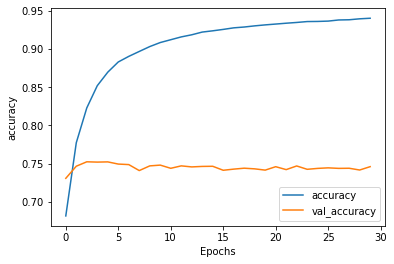

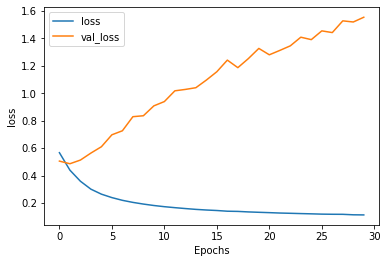

In [31]:
# epoch30 (earlystopping 안 줬을 때)
import matplotlib.pyplot as plt
def plot_graphs(history, string):
    plt.plot(history.history[string])
    plt.plot(history.history['val_' + string])
    plt.xlabel("Epochs")
    plt.ylabel(string)
    plt.legend([string, 'val_' + string])
    plt.show()
plot_graphs(history, 'accuracy')
plot_graphs(history, 'loss')

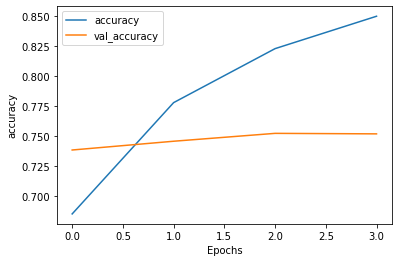

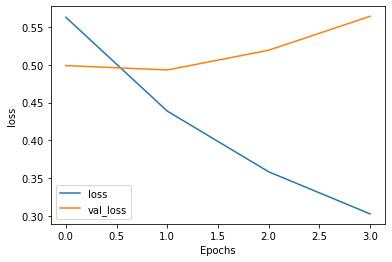

In [53]:
import matplotlib.pyplot as plt
def plot_graphs(history, string):
    plt.plot(history.history[string])
    plt.plot(history.history['val_' + string])
    plt.xlabel("Epochs")
    plt.ylabel(string)
    plt.legend([string, 'val_' + string])
    plt.show()
plot_graphs(history, 'accuracy')
plot_graphs(history, 'loss')

**저장한 모델 load**

In [66]:
mecab_model = tf.keras.models.load_model('word2vec_mecab_model/jy_model')

In [67]:
mecab_model.summary()

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 41)]         0                                            
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 41, 200)      4000000     input_3[0][0]                    
__________________________________________________________________________________________________
conv1d_6 (Conv1D)               (None, 41, 128)      76928       embedding_2[0][0]                
__________________________________________________________________________________________________
conv1d_7 (Conv1D)               (None, 41, 128)      102528      embedding_2[0][0]                
_______________________________________________________________________________________

In [68]:
from keras.callbacks import EarlyStopping
re_es = EarlyStopping(monitor='val_accuracy',min_delta=0.002,patience=1,mode='max')

In [69]:
re_history = mecab_model.fit(padded, training_labels_final, epochs = num_epochs, validation_data = (test_padded, testing_labels_final), callbacks=[re_es])
re_history

Epoch 1/30
4688/4688 [==============================] - 262s 56ms/step - loss: 0.3871 - accuracy: 0.8179 - val_loss: 0.4006 - val_accuracy: 0.8035
Epoch 2/30
4688/4688 [==============================] - 263s 56ms/step - loss: 0.2300 - accuracy: 0.8911 - val_loss: 0.5093 - val_accuracy: 0.7940


In [70]:
mecab_model.save('word2vec_mecab_model/0.79_model')

INFO:tensorflow:Assets written to: word2vec_mecab_model/0.79_model/assets


In [71]:
mecab_remodel = tf.keras.models.load_model('word2vec_mecab_model/0.79_model')

In [72]:
history_3 = mecab_remodel.fit(padded, training_labels_final, epochs = num_epochs, validation_data = (test_padded, testing_labels_final), callbacks=[re_es])
history_3

Epoch 1/30
4688/4688 [==============================] - 255s 54ms/step - loss: 0.1720 - accuracy: 0.9179 - val_loss: 0.5800 - val_accuracy: 0.7916
Epoch 2/30
4688/4688 [==============================] - 261s 56ms/step - loss: 0.1256 - accuracy: 0.9351 - val_loss: 0.7259 - val_accuracy: 0.7852


In [73]:
mecab_remodel.save('word2vec_mecab_model/0.78_3rd_model')

INFO:tensorflow:Assets written to: word2vec_mecab_model/0.78_3rd_model/assets


In [74]:
mecab_4thmodel = tf.keras.models.load_model('word2vec_mecab_model/0.78_3rd_model')

In [75]:
history_4 = mecab_4thmodel.fit(padded, training_labels_final, epochs = num_epochs, validation_data = (test_padded, testing_labels_final), callbacks=[re_es])
history_4

Epoch 1/30
4688/4688 [==============================] - 260s 55ms/step - loss: 0.1201 - accuracy: 0.9391 - val_loss: 0.8608 - val_accuracy: 0.7839
Epoch 2/30
4688/4688 [==============================] - 263s 56ms/step - loss: 0.1033 - accuracy: 0.9443 - val_loss: 0.9307 - val_accuracy: 0.7843


In [99]:
sentence = ["수면제인가 꿀잠잤음","바보같은 영화네요","조금 기대 이하이긴 했는데 그래도 만족함", "완전 재밌었다", "개꿀잼"]
sequence_exp = tokenizer.texts_to_sequences(sentence)
padded_exp = pad_sequences(sequence_exp, maxlen = max_length, truncating= 'post')
print(mecab_remodel.predict(padded_exp).round(2))

[[0.48]
 [0.11]
 [0.46]
 [0.93]
 [1.  ]]


In [90]:
mecab_4thmodel.save('word2vec_mecab_model/0.78_4th_model')

INFO:tensorflow:Assets written to: word2vec_mecab_model/0.78_4th_model/assets


In [91]:
mecab_5thmodel = tf.keras.models.load_model('word2vec_mecab_model/0.78_4th_model')

In [92]:
history_5 = mecab_5thmodel.fit(padded, training_labels_final, epochs = num_epochs, validation_data = (test_padded, testing_labels_final), callbacks=[re_es])
history_5

Epoch 1/30
4688/4688 [==============================] - 256s 55ms/step - loss: 0.1043 - accuracy: 0.9451 - val_loss: 1.0251 - val_accuracy: 0.7821
Epoch 2/30
4688/4688 [==============================] - 257s 55ms/step - loss: 0.0948 - accuracy: 0.9483 - val_loss: 1.2348 - val_accuracy: 0.7764
